# 1. Preparação do ambiente e carregamendo dos dados

In [157]:
# Bloco Inicial para Notebook carregado no Kaggle
# Carregamento dos pacotes que serão utilizados

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# pd.options.mode.chained_assignment = None
# pd.set_option('display.max_rows', 8000)
# import matplotlib.pyplot as plt
# from sklearn import preprocessing
# from sklearn.model_selection import train_test_split
# from sklearn.tree import DecisionTreeClassifier
# from pandas.plotting import scatter_matrix

# Código de utilização no kaggle para upload dos dados
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# Carregamento do dataset completo
# df_exoplanets_full = pd.read_csv('/kaggle/input/exoplanet-full-data-set-july-2022/dataset_exoplanets_29.07.2022_ready.csv')
# print('Carregado o arquivo: dataset_exoplanets_29.07.2022_ready.csv')
# print('Carregamento completo. A dimensão do dataset completo é ' + str(df_exoplanets_full.shape))

In [158]:
# Bloco Inicial para Notebook carregado localmente

# Carregamento dos pacotes que serão utilizados
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None
pd.set_option('display.max_rows', 8000)
pd.set_option('display.max_columns', 40)
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix

# Carregamento do dataset completo
df_exoplanets_full = pd.read_csv('dataset_exoplanets_29.07.2022_ready.csv')
print('Carregado o arquivo: dataset_exoplanets_29.07.2022_ready.csv')
print('Carregamento completo. A dimensão do dataset completo é ' + str(df_exoplanets_full.shape))

Carregado o arquivo: dataset_exoplanets_29.07.2022_ready.csv
Carregamento completo. A dimensão do dataset completo é (9564, 141)


----------------------------------------------------------------------------------------------------------------------------------------------

# 2. Seleção de dados e Montagem do dataset para treinanamento

In [159]:
# Criação do dataset de dados - realizando o drop dos atributos que não serão utilizados no treinamento
# Atributos retirados da tabela incluem valores de erros dos instrumentos de medidas e datas irrelevantes
df_exoplanets_data = df_exoplanets_full.copy()
df_exoplanets_data.drop(columns=['koi_pdisposition','koi_vet_stat','koi_vet_date','koi_disp_prov','koi_comment','koi_period_err1',
                                'koi_period_err2','koi_time0bk','koi_time0bk_err1','koi_time0bk_err2','koi_time0','koi_time0_err1',
                                'koi_time0_err2','koi_eccen_err1','koi_eccen_err2','koi_longp_err1','koi_longp_err2','koi_impact_err1',
                                'koi_impact_err2','koi_duration_err1','koi_duration_err2','koi_ingress_err1','koi_ingress_err2',
                                'koi_depth_err1','koi_depth_err2','koi_ror_err1','koi_ror_err2','koi_srho_err1','koi_srho_err2',
                                'koi_fittype','koi_prad_err1','koi_prad_err2','koi_sma_err1','koi_sma_err2','koi_incl_err1',
                                'koi_incl_err2','koi_teq_err1','koi_teq_err2','koi_insol','koi_insol_err1','koi_insol_err2',
                                'koi_dor','koi_dor_err1','koi_dor_err2','koi_limbdark_mod','koi_parm_prov','koi_tce_plnt_num',
                                'koi_tce_delivname','koi_quarters','koi_bin_oedp_sig','koi_trans_mod','koi_model_dof','koi_model_chisq',
                                'koi_datalink_dvr','koi_datalink_dvs','koi_steff_err1','koi_steff_err2','koi_slogg_err1','koi_slogg_err2',
                                'koi_smet_err1','koi_smet_err2','koi_srad_err1','koi_srad_err2','koi_smass_err1','koi_smass_err2','koi_sage_err1',
                                'koi_sage_err2','koi_sparprov','koi_fwm_stat_sig','koi_fwm_sra','koi_fwm_sra_err','koi_fwm_sdec',
                                'koi_fwm_sdec_err','koi_fwm_srao','koi_fwm_srao_err','koi_fwm_sdeco','koi_fwm_sdeco_err','koi_fwm_prao',
                                'koi_fwm_prao_err','koi_fwm_pdeco','koi_fwm_pdeco_err','koi_dicco_mra','koi_dicco_mra_err','koi_dicco_mdec',
                                'koi_dicco_mdec_err','koi_dicco_msky','koi_dicco_msky_err','koi_dikco_mra','koi_dikco_mra_err',
                                'koi_dikco_mdec','koi_dikco_mdec_err','koi_dikco_msky','koi_dikco_msky_err'],axis=1,inplace=True)

print('O shape do dataset df_exoplanets_data é ' + str(df_exoplanets_data.shape))
print('Total de colunas excluídas: ' + str(df_exoplanets_full.shape[1]-df_exoplanets_data.shape[1]))

O shape do dataset df_exoplanets_data é (9564, 48)
Total de colunas excluídas: 93


In [160]:
# Adição do drop do atributo koi_score devido aos resultados encontrados no Cap6 da versão 1 do notebook
df_exoplanets_data.drop(columns=['koi_score'],axis=1,inplace=True)

In [161]:
# Foi verificado que os atributos 'koi_eccen','koi_longp','koi_ingress','koi_ldm_coeff3','koi_ldm_coeff4','koi_sage' apresentam APENAS valores zeros ou nulos.
# Esses atributos foram retirados pois não inserem informação ao modelo
print(df_exoplanets_data[['koi_eccen','koi_longp','koi_ingress','koi_ldm_coeff3','koi_ldm_coeff4','koi_sage']].describe())
df_exoplanets_data.drop(['koi_eccen','koi_longp','koi_ingress','koi_ldm_coeff3','koi_ldm_coeff4','koi_sage'],axis=1,inplace=True)
print('O shape do dataset df_exoplanets_data é ' + str(df_exoplanets_data.shape))

       koi_eccen  koi_longp  koi_ingress  koi_ldm_coeff3  koi_ldm_coeff4  \
count     9201.0        0.0          0.0          9201.0          9201.0   
mean         0.0        NaN          NaN             0.0             0.0   
std          0.0        NaN          NaN             0.0             0.0   
min          0.0        NaN          NaN             0.0             0.0   
25%          0.0        NaN          NaN             0.0             0.0   
50%          0.0        NaN          NaN             0.0             0.0   
75%          0.0        NaN          NaN             0.0             0.0   
max          0.0        NaN          NaN             0.0             0.0   

       koi_sage  
count       0.0  
mean        NaN  
std         NaN  
min         NaN  
25%         NaN  
50%         NaN  
75%         NaN  
max         NaN  
O shape do dataset df_exoplanets_data é (9564, 41)


In [162]:
# Atributos irrelevantes - 'rowid', 'kepid', 'kepoi_name', 'kepler_name'
# Esses atributos são de identificação e não representam informação no modelo
df_exoplanets_data.drop(['rowid', 'kepid', 'kepoi_name', 'kepler_name'],axis=1,inplace=True)
print('O shape do dataset df_exoplanets_data é ' + str(df_exoplanets_data.shape))

O shape do dataset df_exoplanets_data é (9564, 37)


In [163]:
# O atributo koi_disposition é o target
# Ele apresenta 3 possibilidades: FALSE POSITIVE, CONFIRMED e CANDIDATE. 
#- FALSE POSITIVE - Confirmado por outros métodos que 
#- CONFIRMED - Confirmado como exoplaneta
#- CANDIDATE - Ainda em avaliação

# A base será separada em dois conjuntos:
#- FALSE POSITIVE + CONFIRMED
#- CANDIDATE

# A primeira base será utilizada para treinamento e teste 
# A base de candidatos poderá ser utlizada para verificação de quais objetos de interesse seriam confirmados como planetas utilizando o modelo

df_exoplanets_candidates = df_exoplanets_data.loc[df_exoplanets_data['koi_disposition']=='CANDIDATE']
df_exoplanets = df_exoplanets_data.loc[df_exoplanets_data['koi_disposition']!='CANDIDATE']

print('O shape do dataset df_exoplanets_candidates é ' + str(df_exoplanets_candidates.shape))
print('O shape do dataset df_exoplanets é ' + str(df_exoplanets.shape))

O shape do dataset df_exoplanets_candidates é (2056, 37)
O shape do dataset df_exoplanets é (7508, 37)


In [164]:
# Existem 38 atributos selecionados do dataset original - foi criado listas das categorias desses atributos para utilização futura
#df_exoplanets.columns
exoplanet_archive_information = ['koi_disposition']
project_disposition_columns = ['koi_fpflag_nt', 'koi_fpflag_ss','koi_fpflag_co', 'koi_fpflag_ec'] #project_disposition_columns = ['koi_score','koi_fpflag_nt', 'koi_fpflag_ss','koi_fpflag_co', 'koi_fpflag_ec']
transit_properties = ['koi_period', 'koi_impact', 'koi_duration', 'koi_depth', 'koi_ror', 'koi_srho', 'koi_prad', 'koi_sma', 'koi_incl', 'koi_teq', 'koi_ldm_coeff2', 'koi_ldm_coeff1']
tce_event_information = ['koi_max_sngle_ev', 'koi_max_mult_ev', 'koi_model_snr', 'koi_count', 'koi_num_transits']
stellar_parameters = ['koi_steff', 'koi_slogg', 'koi_smet', 'koi_srad', 'koi_smass']
kic_parameters = ['ra', 'dec', 'koi_kepmag', 'koi_gmag', 'koi_rmag', 'koi_imag', 'koi_zmag', 'koi_jmag', 'koi_hmag', 'koi_kmag']
categories = [exoplanet_archive_information, project_disposition_columns, transit_properties, tce_event_information, stellar_parameters, kic_parameters]

#### TESTE ####
y_feature = ['koi_disposition']
features = ['koi_fpflag_nt', 'koi_fpflag_ss','koi_fpflag_co', 'koi_fpflag_ec','koi_period', 'koi_impact', 'koi_duration', 'koi_depth', 'koi_ror', 'koi_srho', 'koi_prad', 'koi_sma', 'koi_incl', 'koi_teq', 'koi_ldm_coeff2', 'koi_ldm_coeff1','koi_max_sngle_ev', 'koi_max_mult_ev', 'koi_model_snr', 'koi_count', 'koi_num_transits','koi_steff', 'koi_slogg', 'koi_smet', 'koi_srad', 'koi_smass','ra', 'dec', 'koi_kepmag', 'koi_gmag', 'koi_rmag', 'koi_imag', 'koi_zmag', 'koi_jmag', 'koi_hmag', 'koi_kmag'] #features = ['koi_score','koi_fpflag_nt', 'koi_fpflag_ss','koi_fpflag_co', 'koi_fpflag_ec','koi_period', 'koi_impact', 'koi_duration', 'koi_depth', 'koi_ror', 'koi_srho', 'koi_prad', 'koi_sma', 'koi_incl', 'koi_teq', 'koi_ldm_coeff2', 'koi_ldm_coeff1','koi_max_sngle_ev', 'koi_max_mult_ev', 'koi_model_snr', 'koi_count', 'koi_num_transits','koi_steff', 'koi_slogg', 'koi_smet', 'koi_srad', 'koi_smass','ra', 'dec', 'koi_kepmag', 'koi_gmag', 'koi_rmag', 'koi_imag', 'koi_zmag', 'koi_jmag', 'koi_hmag', 'koi_kmag']

----------------------------------------------------------------------------------------------------------------------------------------------

# 3. Pré-Processamento, Análise Preliminar de Outliers e Dados Nulos/Vazios

### 3.1 Análise de Balanceamento do dataset

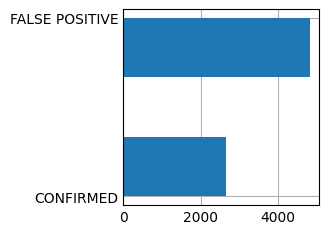

Base Balanceada. Aproximadamente relação de 1:2 - CONFIRMADO/FALSO POSITIVO


In [165]:
#Avaliando o balanceamento da base de dados
plt.style.use('_mpl-gallery')
df_exoplanets.koi_disposition.hist(bins=3, orientation = 'horizontal')
plt.show()
print('Base Balanceada. Aproximadamente relação de 1:2 - CONFIRMADO/FALSO POSITIVO')

### 3.2 Análise de Dados Nulos e/ou Vazios e Análise Preliminar de Outliers

In [166]:
# Necessário preencher os valores Nulos no atributos ou verificar se existe relevancia nele.
df_exoplanets.isna().any()

koi_disposition     False
koi_fpflag_nt       False
koi_fpflag_ss       False
koi_fpflag_co       False
koi_fpflag_ec       False
koi_period          False
koi_impact           True
koi_duration        False
koi_depth            True
koi_ror              True
koi_srho             True
koi_prad             True
koi_sma              True
koi_incl             True
koi_teq              True
koi_ldm_coeff2       True
koi_ldm_coeff1       True
koi_max_sngle_ev     True
koi_max_mult_ev      True
koi_model_snr        True
koi_count           False
koi_num_transits     True
koi_steff            True
koi_slogg            True
koi_smet             True
koi_srad             True
koi_smass            True
ra                  False
dec                 False
koi_kepmag           True
koi_gmag             True
koi_rmag             True
koi_imag             True
koi_zmag             True
koi_jmag             True
koi_hmag             True
koi_kmag             True
dtype: bool

In [167]:
#Atributo koi_score
#print(df_exoplanets.koi_score.isna().sum()) #Somatorio de valores nulos
#print(df_exoplanets.koi_score.describe())
#Como o koi_score é a confiança em relação a classe do registro. Preenchimento dos valores nulos será de acordo com o pior caso. Substituição de NULO por ZERO
#df_exoplanets.koi_score.fillna(0,inplace=True)
#print(df_exoplanets.koi_score.isna().sum()) #Somatorio de valores nulos



count    7250.000000
mean        0.758169
std         3.212828
min         0.000000
25%         0.227000
50%         0.586000
75%         0.917675
max       100.806000
Name: koi_impact, dtype: float64
Valores NULOS: 258


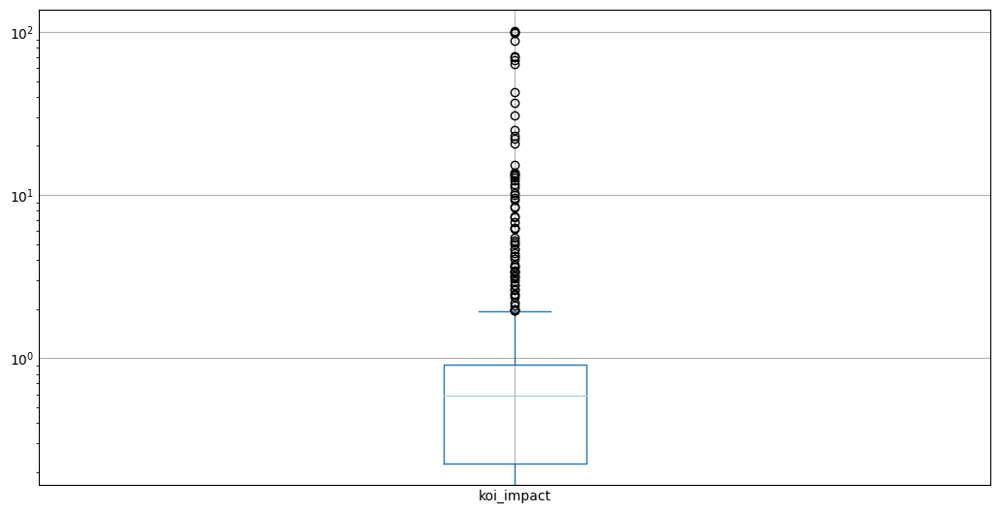

Valores NULOS: 0


In [168]:
# Atributo koi_impact com valores Outliers
print(df_exoplanets.koi_impact.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_impact.isna().sum()))
df_exoplanets.koi_impact.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_impact.fillna(df_exoplanets.koi_impact.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_impact.isna().sum()))
# Outliers mantidos por terem significado


count    7.250000e+03
mean     2.983129e+04
std      9.159879e+04
min      8.000000e-01
25%      1.826500e+02
50%      5.029500e+02
75%      2.380600e+03
max      1.541400e+06
Name: koi_depth, dtype: float64
Valores NULOS: 258


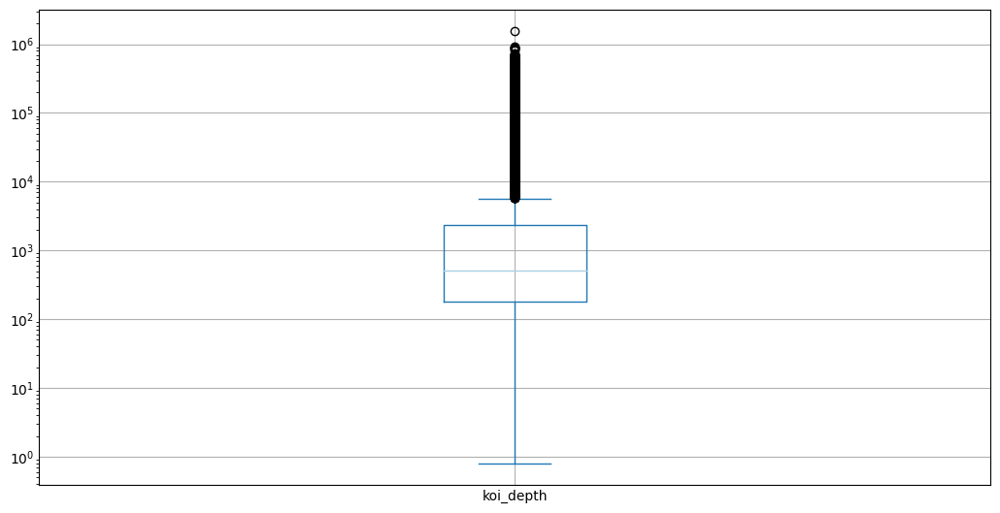

Valores NULOS: 0


In [169]:
# Atributo koi_depth com valores Outliers
print(df_exoplanets.koi_depth.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_depth.isna().sum()))
df_exoplanets.koi_depth.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_depth.fillna(df_exoplanets.koi_depth.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_depth.isna().sum()))
# Outliers mantidos por terem significado

count    7250.000000
mean        0.296041
std         3.171768
min         0.001289
25%         0.013230
50%         0.023904
75%         0.200595
max        99.870651
Name: koi_ror, dtype: float64
Valores NULOS: 258


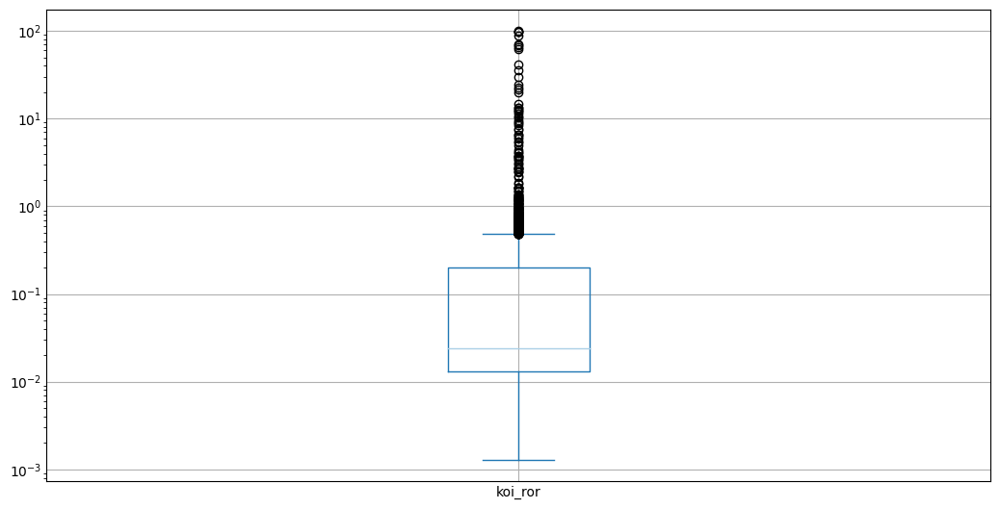

Valores NULOS: 0


In [170]:
# Atributo koi_ror com valores Outliers
print(df_exoplanets.koi_ror.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_ror.isna().sum()))
df_exoplanets.koi_ror.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_ror.fillna(df_exoplanets.koi_ror.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_ror.isna().sum()))
# Outliers mantidos por terem significado

count    7289.000000
mean        7.007737
std        48.515264
min         0.000040
25%         0.182620
50%         0.787840
75%         2.438100
max       980.854190
Name: koi_srho, dtype: float64
Valores NULOS: 219


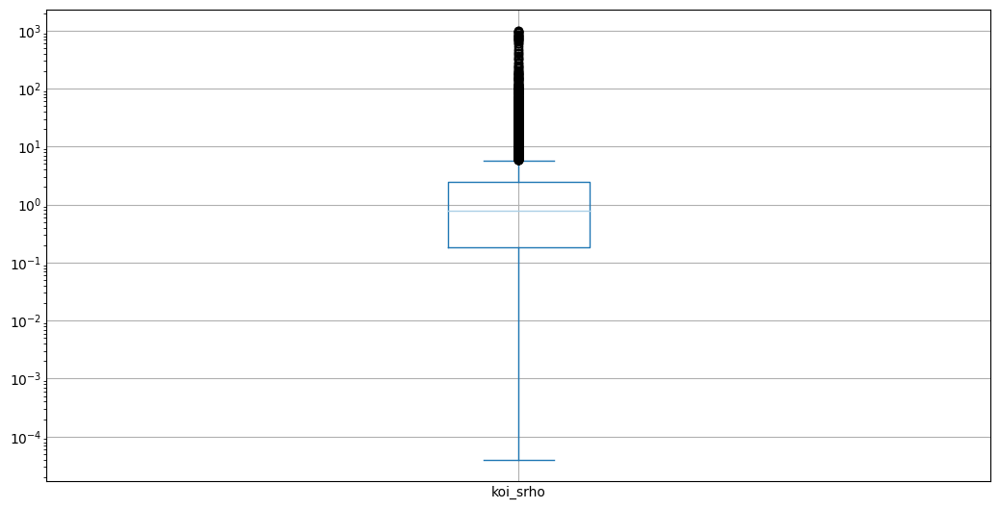

Valores NULOS: 0


In [171]:
# Atributo koi_srho com valores Outliers
print(df_exoplanets.koi_srho.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_srho.isna().sum()))
df_exoplanets.koi_srho.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_srho.fillna(df_exoplanets.koi_srho.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_srho.isna().sum()))
# Outliers mantidos por terem significado

#### Atributo koi_prad
#### Atributos com valores Outliers - Necessário tratamento

count      7250.000000
mean        105.221029
std        3197.095714
min           0.080000
25%           1.500000
50%           2.630000
75%          24.635000
max      200346.000000
Name: koi_prad, dtype: float64
Valores NULOS: 258


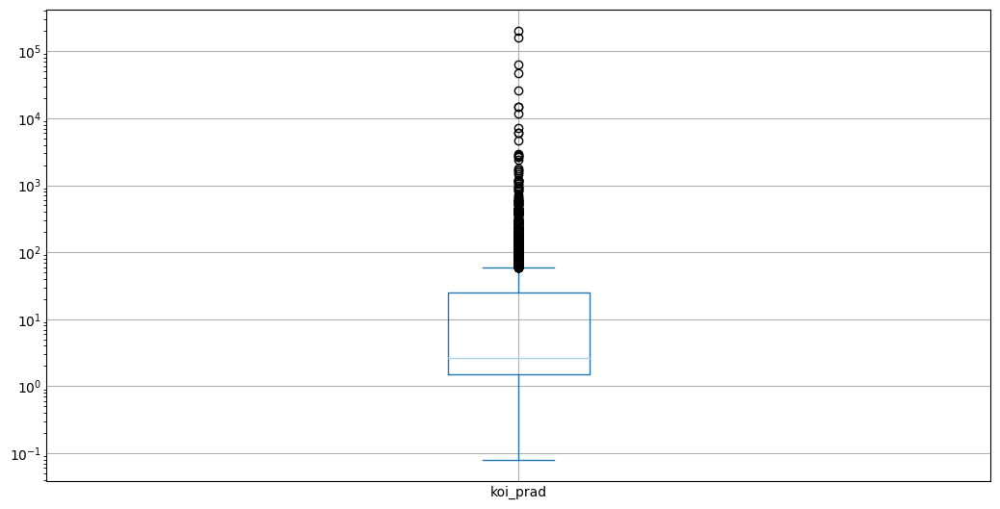

Valores NULOS: 0


In [172]:
# Atributo koi_prad com valores Outliers
print(df_exoplanets.koi_prad.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_prad.isna().sum()))
df_exoplanets.koi_prad.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_prad.fillna(df_exoplanets.koi_prad.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_prad.isna().sum()))
# Outliers mantidos por terem significado

count    7250.000000
mean        0.190404
std         0.291851
min         0.005900
25%         0.033100
50%         0.075400
75%         0.177275
max         2.152500
Name: koi_sma, dtype: float64
Valores NULOS: 258


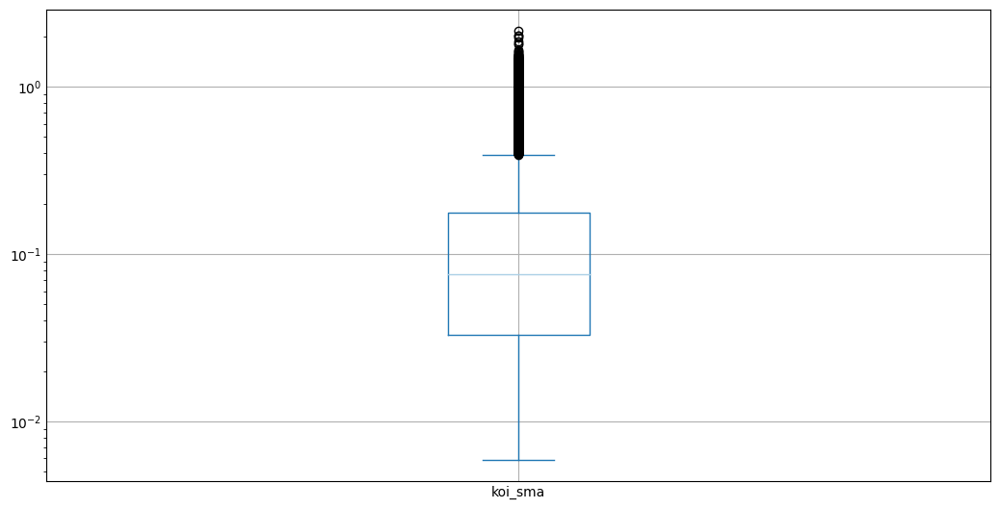

Valores NULOS: 0


In [173]:
# Atributo koi_sma com valores Outliers
print(df_exoplanets.koi_sma.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_sma.isna().sum()))
df_exoplanets.koi_sma.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_sma.fillna(df_exoplanets.koi_sma.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_sma.isna().sum()))
# Outliers mantidos por terem significado

count    7249.000000
mean       81.166869
std        16.459865
min         2.290000
25%        81.960000
50%        88.010000
75%        89.640000
max        90.000000
Name: koi_incl, dtype: float64
Valores NULOS: 259


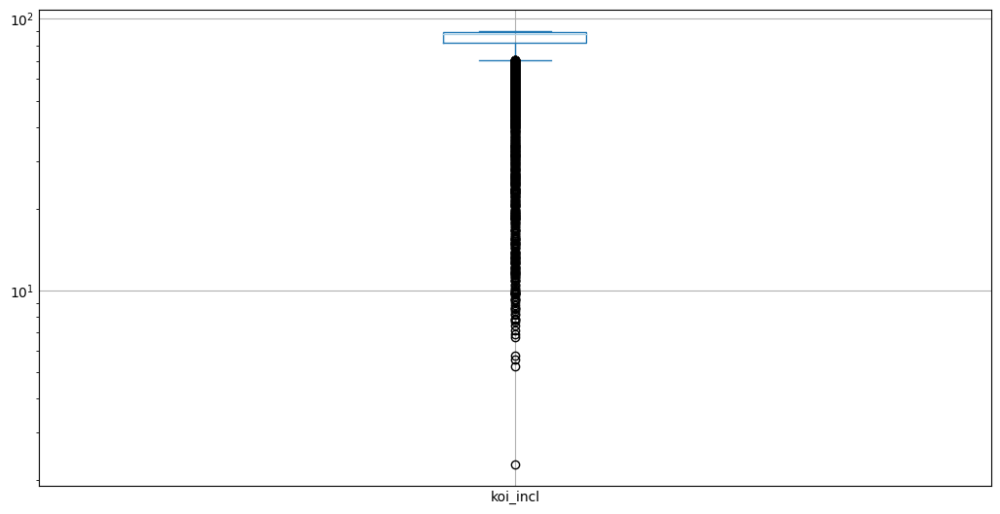

Valores NULOS: 0


In [174]:
# Atributo koi_incl com valores Outliers
print(df_exoplanets.koi_incl.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_incl.isna().sum()))
df_exoplanets.koi_incl.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_incl.fillna(df_exoplanets.koi_incl.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_incl.isna().sum()))
# Outliers mantidos por terem significado

#### Atributo koi_teq
#### Atributos com valores Outliers - Necessário tratamento

count     7250.000000
mean      1157.692552
std        903.870744
min         92.000000
25%        582.000000
50%        935.000000
75%       1486.000000
max      14667.000000
Name: koi_teq, dtype: float64
Valores NULOS: 258


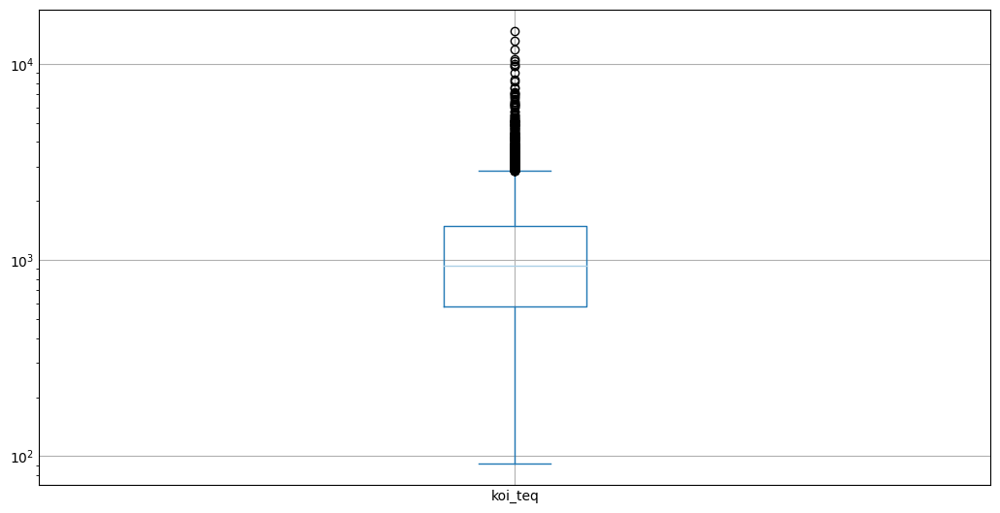

Valores NULOS: 0


In [175]:
# Atributo koi_teq com valores Outliers
print(df_exoplanets.koi_teq.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_teq.isna().sum()))
df_exoplanets.koi_teq.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_teq.fillna(df_exoplanets.koi_teq.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_teq.isna().sum()))
# Outliers mantidos por terem significado

Valores NULOS 1: 258
Valores NULOS 2: 258


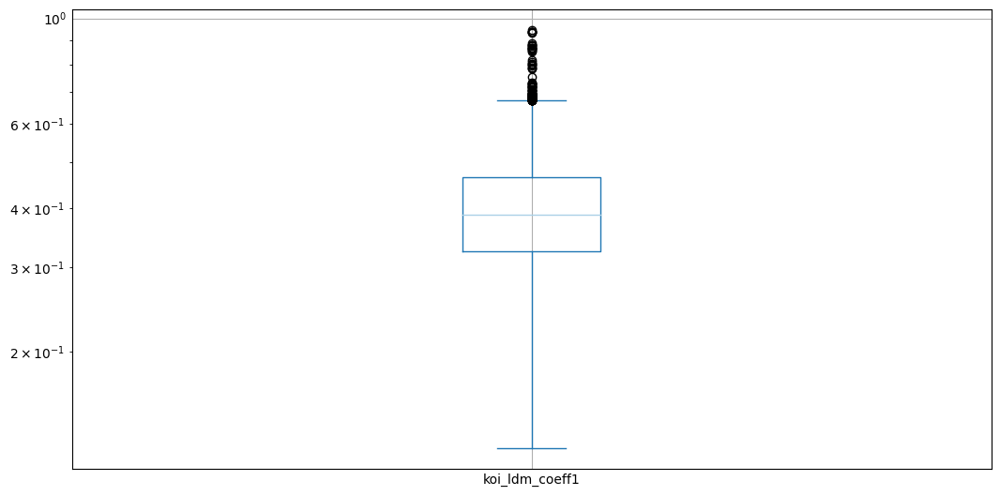

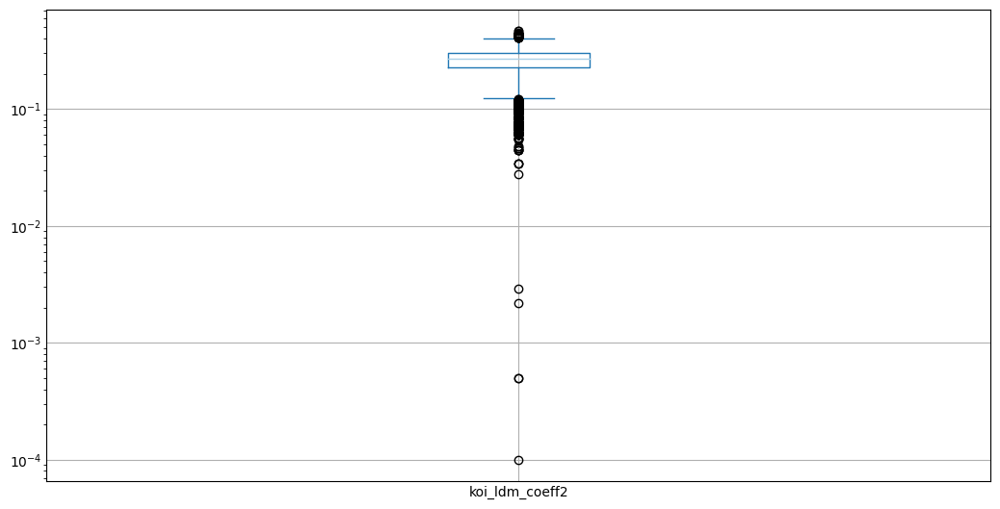

Valores NULOS 1: 0
Valores NULOS 2: 0


In [176]:
# Atributo koi_ldm_coeff1 e koi_ldm_coeff2 com valores Outliers
print('Valores NULOS 1: ' + str(df_exoplanets.koi_ldm_coeff1.isna().sum()))
print('Valores NULOS 2: ' + str(df_exoplanets.koi_ldm_coeff2.isna().sum()))
df_exoplanets.koi_ldm_coeff1.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
df_exoplanets.koi_ldm_coeff2.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_ldm_coeff1.fillna(df_exoplanets.koi_ldm_coeff1.mean(), inplace=True)
df_exoplanets.koi_ldm_coeff2.fillna(df_exoplanets.koi_ldm_coeff2.mean(), inplace=True)
print('Valores NULOS 1: ' + str(df_exoplanets.koi_ldm_coeff1.isna().sum()))
print('Valores NULOS 2: ' + str(df_exoplanets.koi_ldm_coeff2.isna().sum()))
# Outliers mantidos por terem significado

count     6827.000000
mean       215.829866
std        851.446303
min          2.538761
25%          4.230003
50%          6.257362
75%         27.319057
max      22982.162000
Name: koi_max_sngle_ev, dtype: float64
Valores NULOS: 681


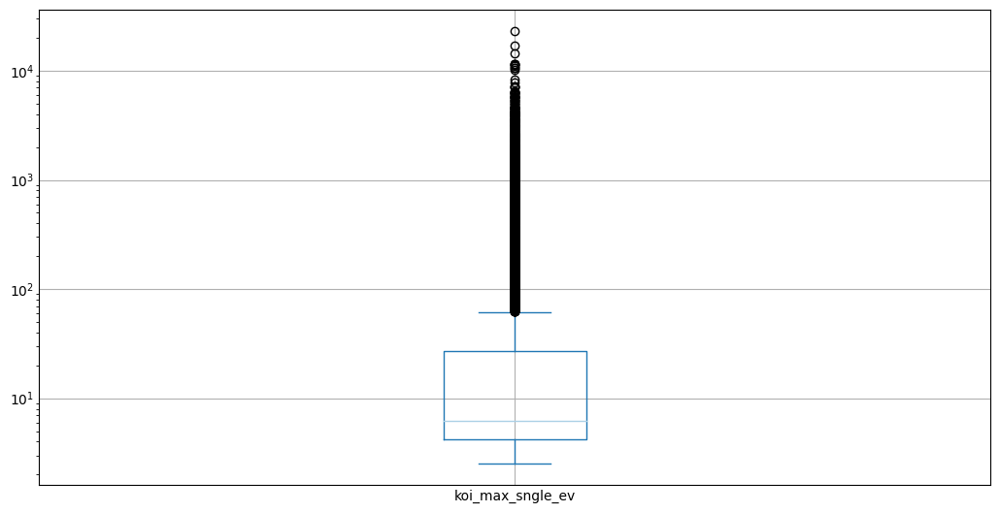

Valores NULOS: 0


In [177]:
# Atributo koi_max_sngle_ev com valores Outliers
print(df_exoplanets.koi_max_sngle_ev.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_max_sngle_ev.isna().sum()))
df_exoplanets.koi_max_sngle_ev.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_max_sngle_ev.fillna(df_exoplanets.koi_max_sngle_ev.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_max_sngle_ev.isna().sum()))
# Outliers mantidos por terem significado

count      6827.000000
mean       1256.308970
std        4582.831122
min           7.105086
25%          12.934684
50%          24.318182
75%         129.223915
max      120049.680000
Name: koi_max_mult_ev, dtype: float64
Valores NULOS: 681


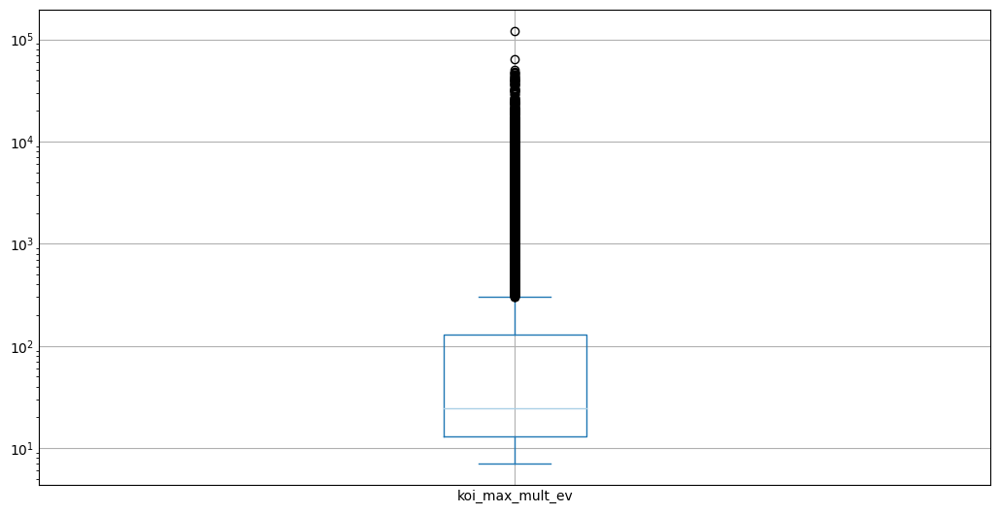

Valores NULOS: 0


In [178]:
# Atributo koi_max_mult_ev com valores Outliers
print(df_exoplanets.koi_max_mult_ev.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_max_mult_ev.isna().sum()))
df_exoplanets.koi_max_mult_ev.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_max_mult_ev.fillna(df_exoplanets.koi_max_mult_ev.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_max_mult_ev.isna().sum()))
# Outliers mantidos por terem significado

count    7250.000000
mean      321.512979
std       885.187587
min         0.000000
25%        15.400000
50%        30.800000
75%       117.000000
max      9054.700000
Name: koi_model_snr, dtype: float64
Valores NULOS: 258


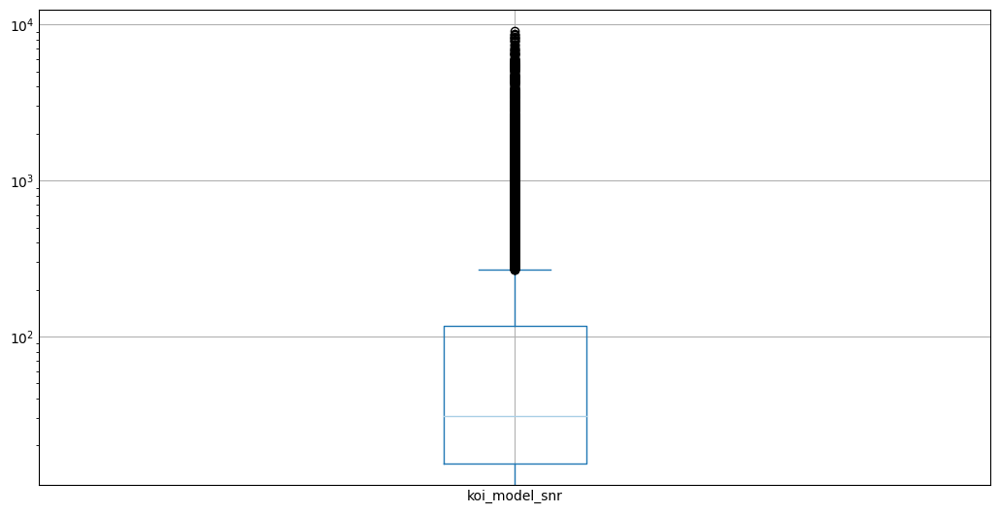

Valores NULOS: 0


In [179]:
# Atributo koi_model_snr com valores Outliers
print(df_exoplanets.koi_model_snr.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_model_snr.isna().sum()))
df_exoplanets.koi_model_snr.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_model_snr.fillna(df_exoplanets.koi_model_snr.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_model_snr.isna().sum()))
# Outliers mantidos por terem significado

count    6827.000000
mean      421.198770
std       570.590456
min         0.000000
25%        46.500000
50%       165.000000
75%       553.500000
max      2664.000000
Name: koi_num_transits, dtype: float64
Valores NULOS: 681


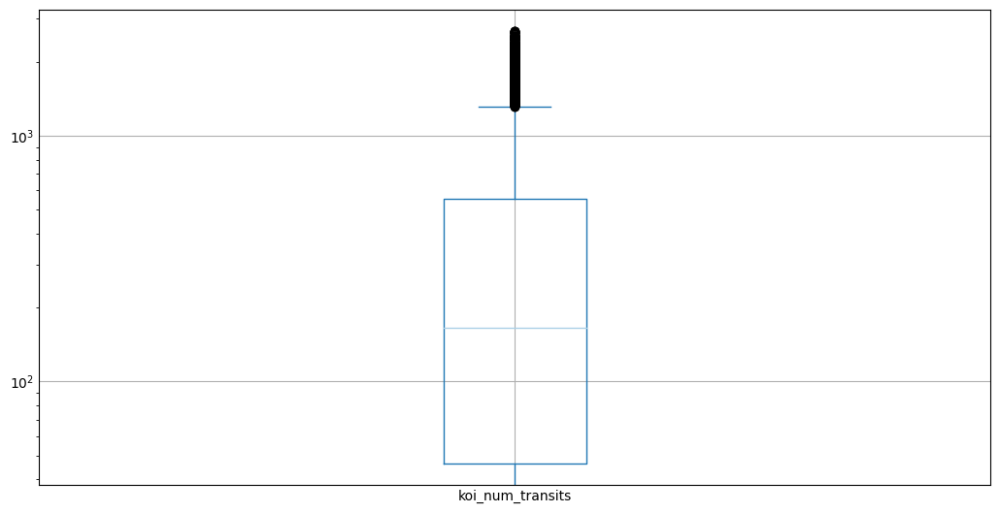

Valores NULOS: 0


In [180]:
# Atributo koi_num_transits com valores Outliers
print(df_exoplanets.koi_num_transits.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_num_transits.isna().sum()))
df_exoplanets.koi_num_transits.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_num_transits.fillna(df_exoplanets.koi_num_transits.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_num_transits.isna().sum()))
# Outliers mantidos por terem significado

count     7250.000000
mean      5718.807172
std        820.400723
min       2661.000000
25%       5317.250000
50%       5776.000000
75%       6119.000000
max      15896.000000
Name: koi_steff, dtype: float64
Valores NULOS: 258


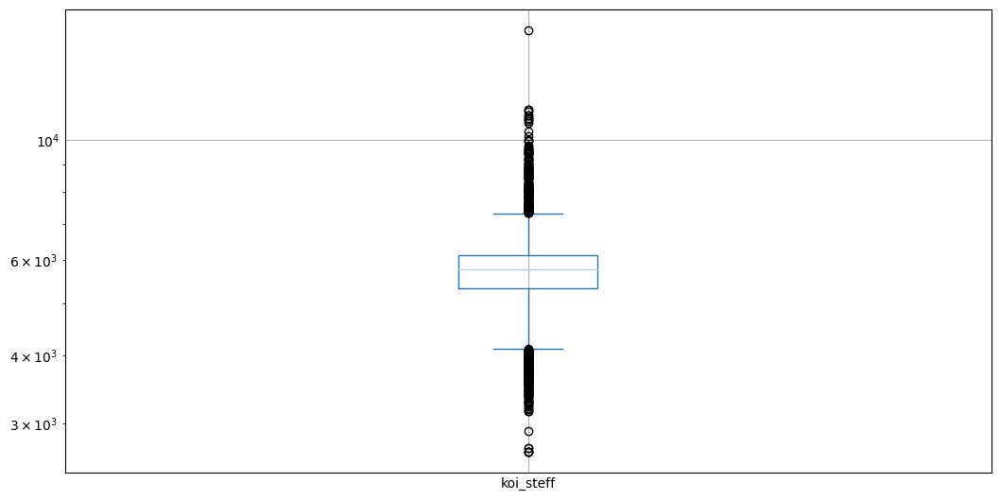

Valores NULOS: 0


In [181]:
# Atributo koi_steff com valores Outliers
print(df_exoplanets.koi_steff.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_steff.isna().sum()))
df_exoplanets.koi_steff.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_steff.fillna(df_exoplanets.koi_steff.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_steff.isna().sum()))
# Outliers mantidos por terem significado

count    7250.000000
mean        4.309946
std         0.438653
min         0.047000
25%         4.217000
50%         4.438000
75%         4.543000
max         5.283000
Name: koi_slogg, dtype: float64
Valores NULOS: 258


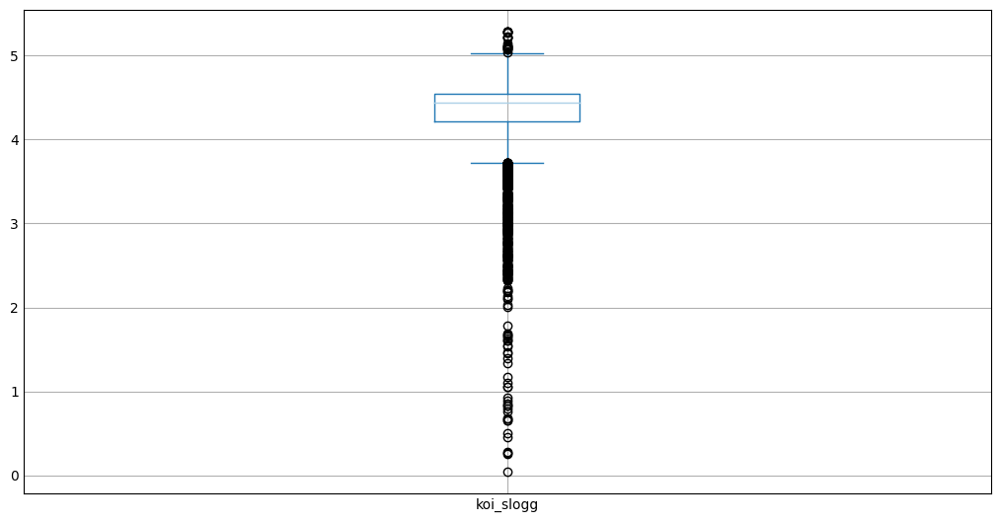

Valores NULOS: 0


In [182]:
# Atributo koi_slogg com valores Outliers
print(df_exoplanets.koi_slogg.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_slogg.isna().sum()))
df_exoplanets.koi_slogg.plot(kind='box',figsize=(10,5))
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_slogg.fillna(df_exoplanets.koi_slogg.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_slogg.isna().sum()))
# Outliers mantidos por terem significado

count    7230.000000
mean       -0.129463
std         0.282253
min        -2.500000
25%        -0.260000
50%        -0.100000
75%         0.070000
max         0.560000
Name: koi_smet, dtype: float64
Valores NULOS: 278


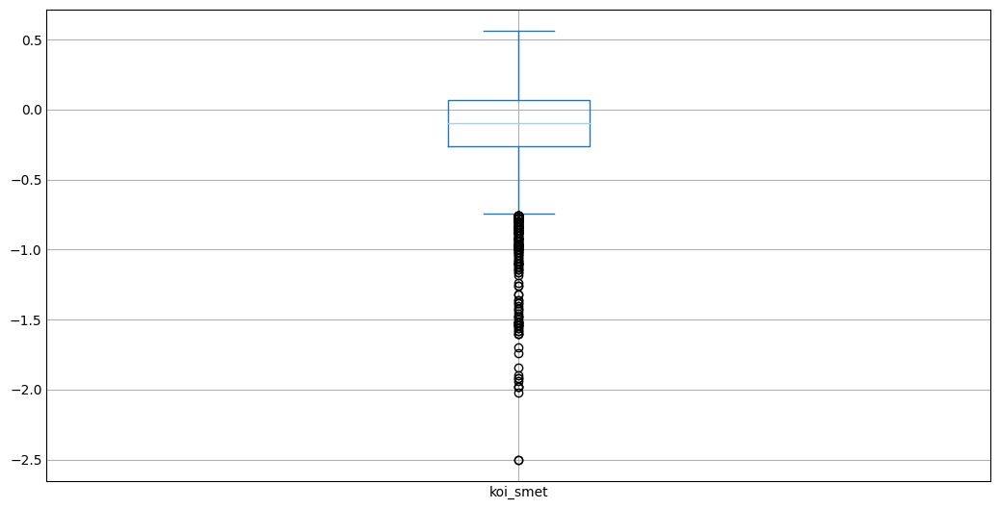

Valores NULOS: 0


In [183]:
# Atributo koi_smet com valores Outliers
print(df_exoplanets.koi_smet.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_smet.isna().sum()))
df_exoplanets.koi_smet.plot(kind='box',figsize=(10,5))
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_smet.fillna(df_exoplanets.koi_smet.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_smet.isna().sum()))
# Outliers mantidos por terem significado

count    7250.000000
mean        1.759367
std         6.311392
min         0.116000
25%         0.829000
50%         1.000000
75%         1.349000
max       229.908000
Name: koi_srad, dtype: float64
Valores NULOS: 258


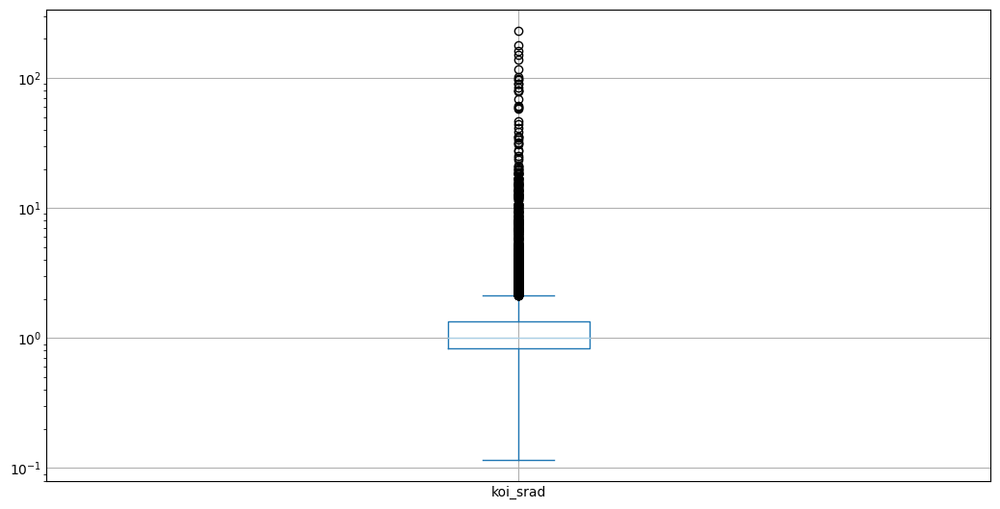

Valores NULOS: 0


In [184]:
# Atributo koi_srad com valores Outliers
print(df_exoplanets.koi_srad.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_srad.isna().sum()))
df_exoplanets.koi_srad.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_srad.fillna(df_exoplanets.koi_srad.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_srad.isna().sum()))
# Outliers mantidos por terem significado

count    7250.000000
mean        1.024015
std         0.354285
min         0.000000
25%         0.844000
50%         0.973000
75%         1.100000
max         3.735000
Name: koi_smass, dtype: float64
Valores NULOS: 258


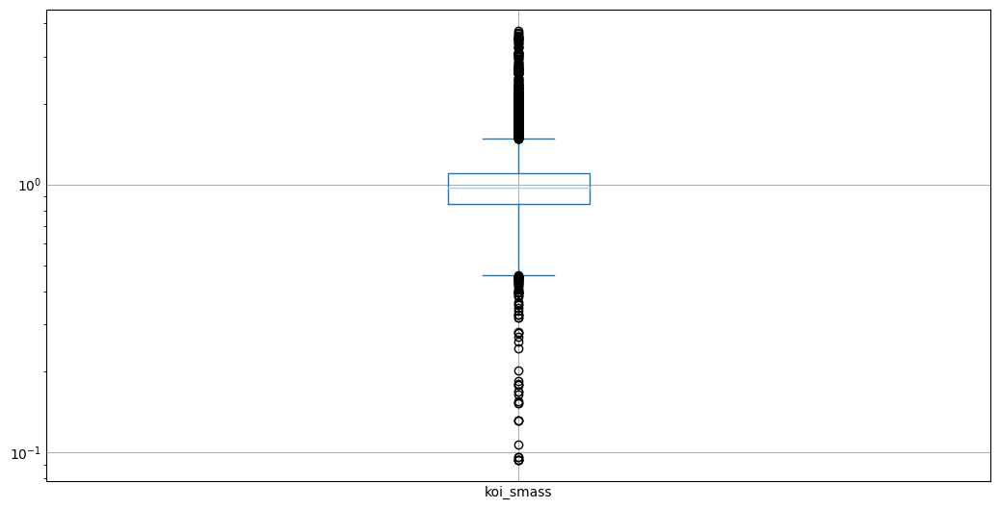

Valores NULOS: 0


In [185]:
# Atributo koi_smass com valores Outliers
print(df_exoplanets.koi_smass.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_smass.isna().sum()))
df_exoplanets.koi_smass.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_smass.fillna(df_exoplanets.koi_smass.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_smass.isna().sum()))
# Outliers mantidos por terem significado

count    7507.000000
mean       14.248763
std         1.402805
min         6.966000
25%        13.424000
50%        14.498000
75%        15.304500
max        20.003000
Name: koi_kepmag, dtype: float64
Valores NULOS: 1


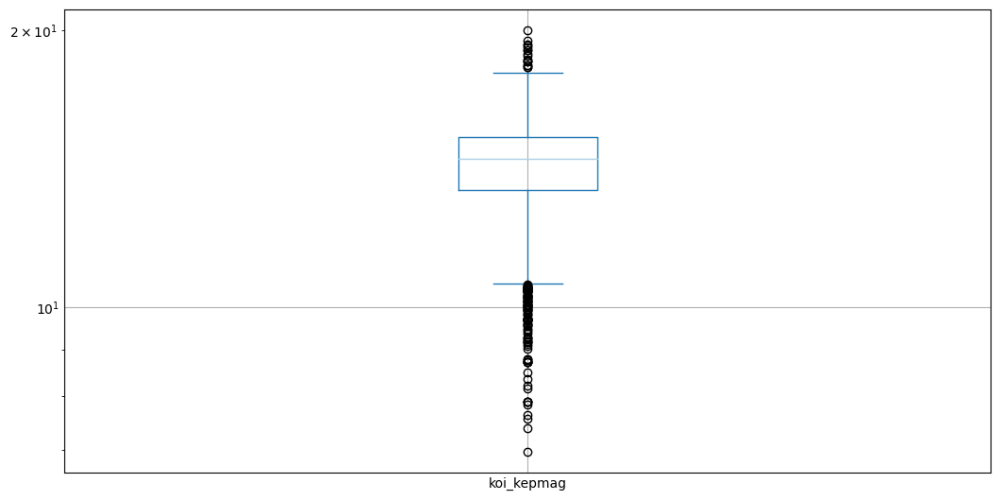

Valores NULOS: 0


In [186]:
# Atributo koi_kepmag com valores Outliers
print(df_exoplanets.koi_kepmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_kepmag.isna().sum()))
df_exoplanets.koi_kepmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_kepmag.fillna(df_exoplanets.koi_kepmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_kepmag.isna().sum()))
# Outliers mantidos por terem significado

count    7474.000000
mean       14.815195
std         1.519401
min         7.225000
25%        13.876000
50%        15.036500
75%        15.926000
max        21.150000
Name: koi_gmag, dtype: float64
Valores NULOS: 34


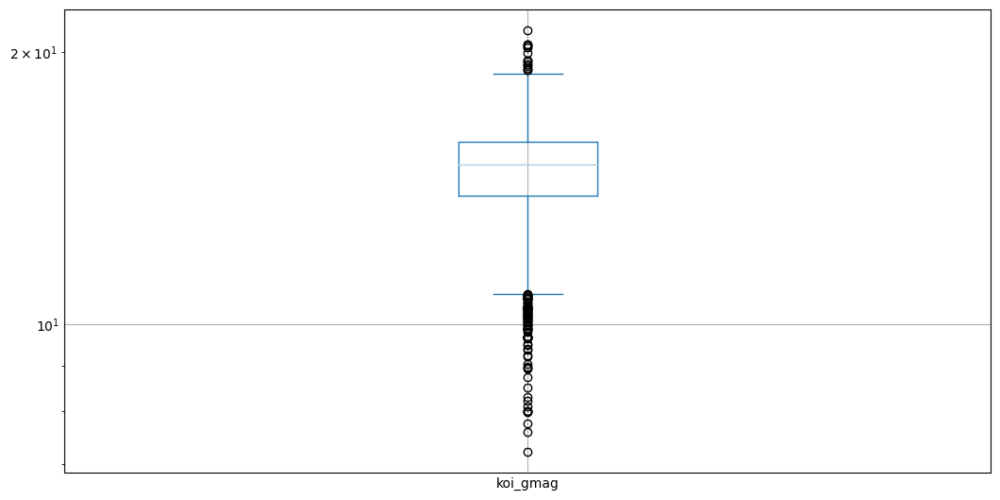

Valores NULOS: 0


In [187]:
# Atributo koi_gmag com valores Outliers
print(df_exoplanets.koi_gmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_gmag.isna().sum()))
df_exoplanets.koi_gmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_gmag.fillna(df_exoplanets.koi_gmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_gmag.isna().sum()))
# Outliers mantidos por terem significado

count    7501.000000
mean       14.206438
std         1.400502
min         7.101000
25%        13.374000
50%        14.448000
75%        15.258000
max        19.960000
Name: koi_rmag, dtype: float64
Valores NULOS: 7


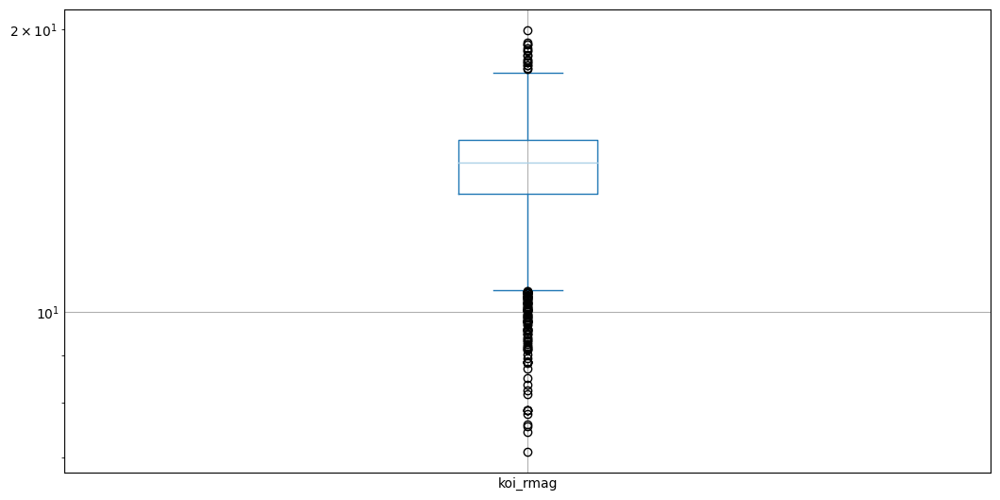

Valores NULOS: 0


In [188]:
# Atributo koi_rmag com valores Outliers
print(df_exoplanets.koi_rmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_rmag.isna().sum()))
df_exoplanets.koi_rmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_rmag.fillna(df_exoplanets.koi_rmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_rmag.isna().sum()))
# Outliers mantidos por terem significado

#### Atributo koi_imag
#### Valores completos com a média

count    7381.000000
mean       14.064495
std         1.306962
min         7.627000
25%        13.285000
50%        14.298000
75%        15.045000
max        19.900000
Name: koi_imag, dtype: float64
Valores NULOS: 127


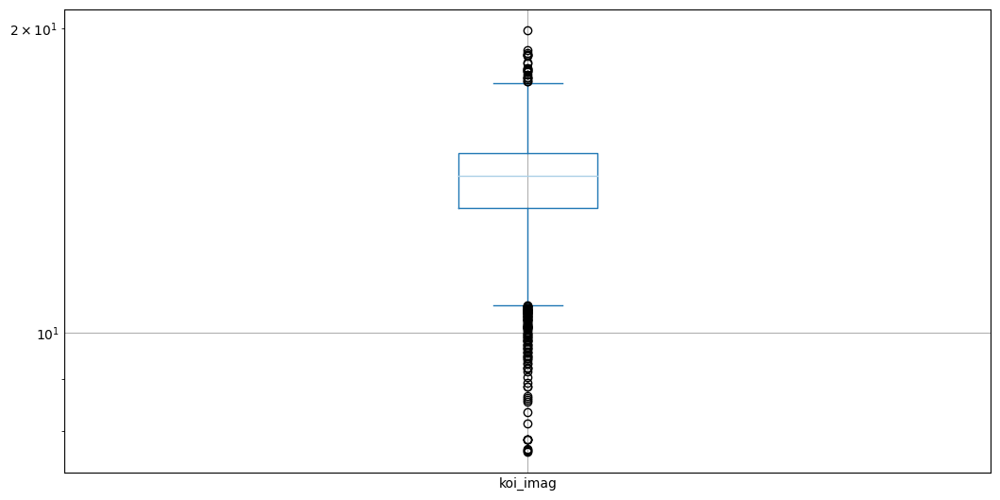

Valores NULOS: 0


In [189]:
# Atributo koi_imag com valores Outliers
print(df_exoplanets.koi_imag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_imag.isna().sum()))
df_exoplanets.koi_imag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_imag.fillna(df_exoplanets.koi_imag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_imag.isna().sum()))
# Outliers mantidos por terem significado

count    6992.000000
mean       13.975821
std         1.236673
min         7.657000
25%        13.260000
50%        14.223000
75%        14.929250
max        17.403000
Name: koi_zmag, dtype: float64
Valores NULOS: 516


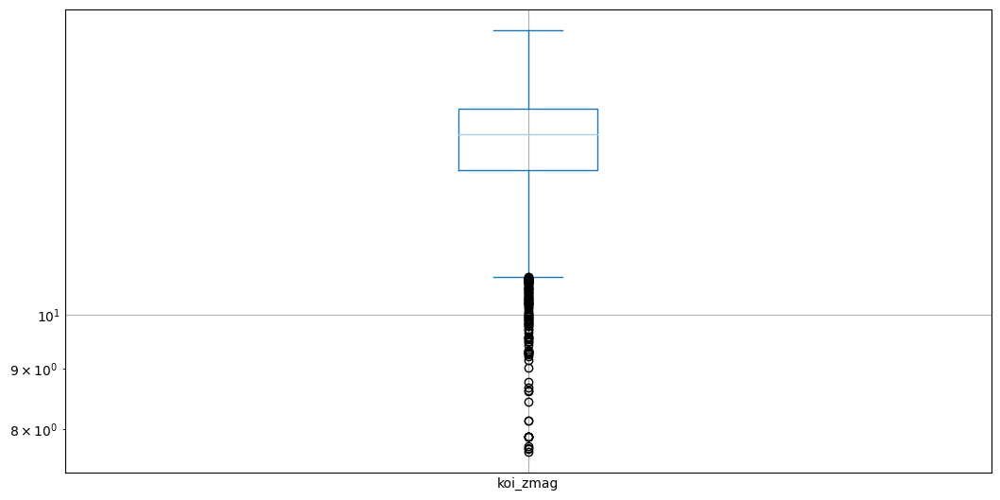

Valores NULOS: 0


In [190]:
# Atributo koi_zmag com valores Outliers
print(df_exoplanets.koi_zmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_zmag.isna().sum()))
df_exoplanets.koi_zmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_zmag.fillna(df_exoplanets.koi_zmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_zmag.isna().sum()))
# Outliers mantidos por terem significado

count    7483.000000
mean       12.979900
std         1.305649
min         5.431000
25%        12.250000
50%        13.203000
75%        13.960000
max        17.372000
Name: koi_jmag, dtype: float64
Valores NULOS: 25


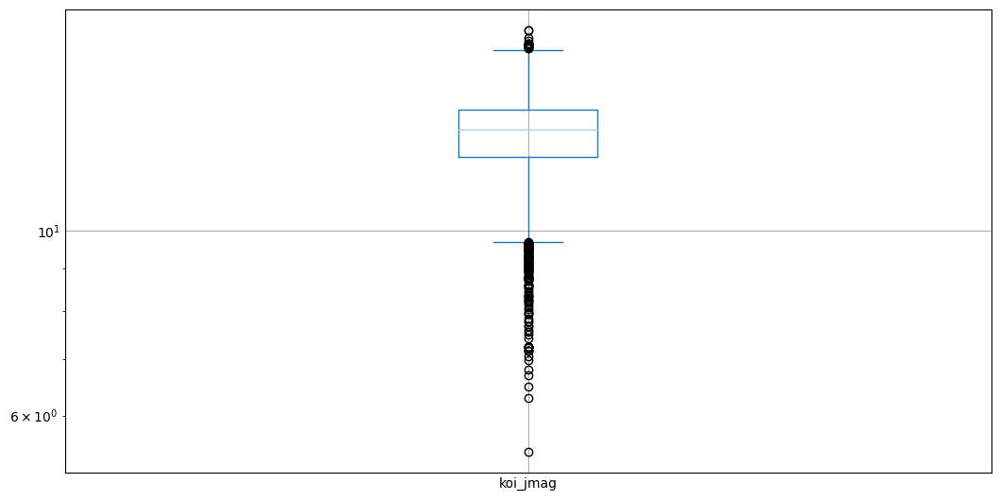

Valores NULOS: 0


In [191]:
# Atributo koi_jmag com valores Outliers
print(df_exoplanets.koi_jmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_jmag.isna().sum()))
df_exoplanets.koi_jmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_jmag.fillna(df_exoplanets.koi_jmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_jmag.isna().sum()))
# Outliers mantidos por terem significado

count    7483.000000
mean       12.607977
std         1.282287
min         5.054000
25%        11.913000
50%        12.808000
75%        13.544000
max        17.615000
Name: koi_hmag, dtype: float64
Valores NULOS: 25


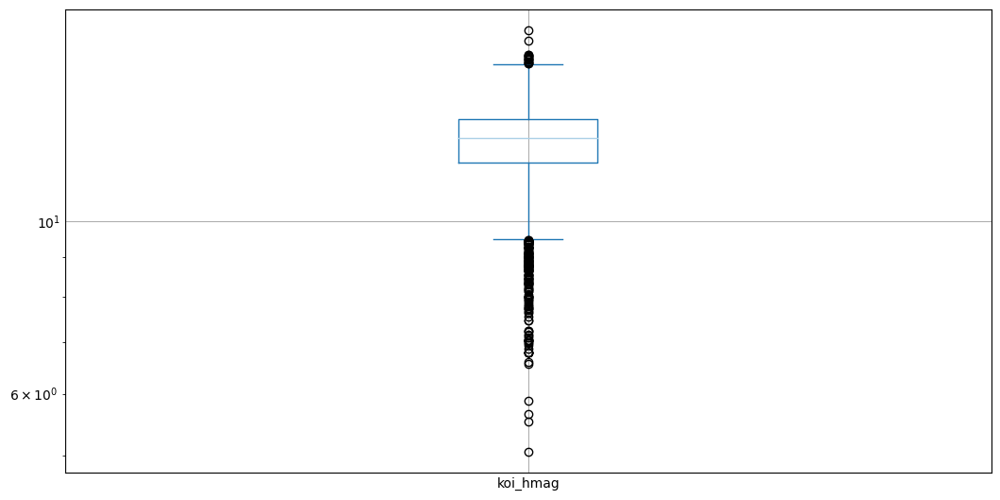

Valores NULOS: 0


In [192]:
# Atributo koi_hmag com valores Outliers
print(df_exoplanets.koi_hmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_hmag.isna().sum()))
df_exoplanets.koi_hmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_hmag.fillna(df_exoplanets.koi_hmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_hmag.isna().sum()))
# Outliers mantidos por terem significado

count    7483.000000
mean       12.530341
std         1.282013
min         4.941000
25%        11.840000
50%        12.721000
75%        13.477500
max        17.038000
Name: koi_kmag, dtype: float64
Valores NULOS: 25


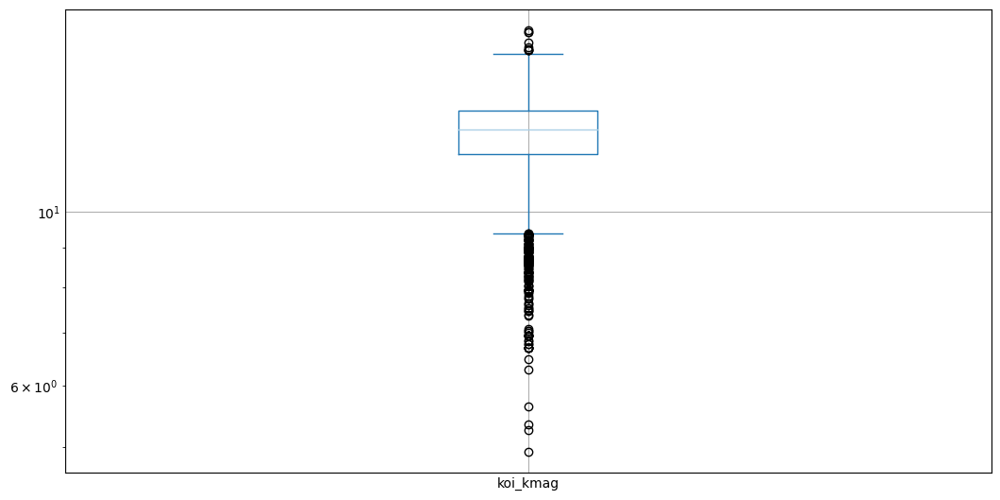

Valores NULOS: 0


In [193]:
# Atributo koi_kmag com valores Outliers
print(df_exoplanets.koi_kmag.describe())
print('Valores NULOS: ' + str(df_exoplanets.koi_kmag.isna().sum()))
df_exoplanets.koi_kmag.plot(kind='box',figsize=(10,5),logy=True)
plt.show()
# Inseridos Valores Médios
df_exoplanets.koi_kmag.fillna(df_exoplanets.koi_kmag.mean(), inplace=True)
print('Valores NULOS: ' + str(df_exoplanets.koi_kmag.isna().sum()))
# Outliers mantidos por terem significado

# 4. Análise e Exploração dos Dados

### 4.1 Categoria -> exoplanet_archive_information

<BarContainer object of 2 artists>

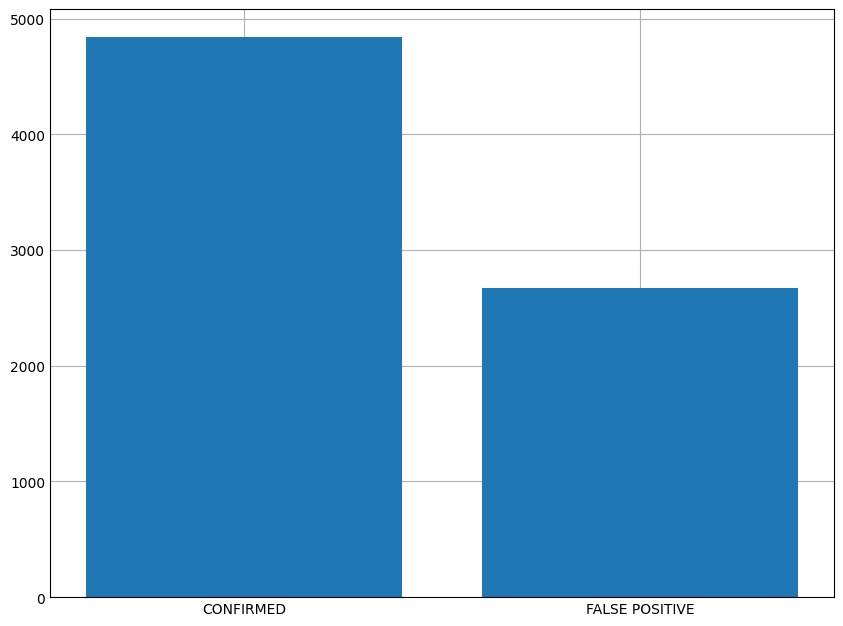

In [194]:
# Análise exploratória da Categoria exoplanet_archive_information
labels = df_exoplanets[exoplanet_archive_information[0]].unique()
qty = df_exoplanets[exoplanet_archive_information[0]].value_counts()

#Criação da imagem
fig, ax = plt.subplots(figsize=(8,6))
ax.bar(labels,qty)

# Como o único atributo dessa categoria é categórico e será alterado apenas em outra fase do projeto não há insights vindo desses dados

### 4.2 Categoria -> project_disposition_columns

In [195]:
# Análise exploratória da Categoria exoplanet_archive_information
# Atributos presentes nessa categoria
project_disposition_columns

['koi_fpflag_nt', 'koi_fpflag_ss', 'koi_fpflag_co', 'koi_fpflag_ec']

array([[<AxesSubplot: title={'center': 'koi_fpflag_nt'}>,
        <AxesSubplot: title={'center': 'koi_fpflag_ss'}>],
       [<AxesSubplot: title={'center': 'koi_fpflag_co'}>,
        <AxesSubplot: title={'center': 'koi_fpflag_ec'}>]], dtype=object)

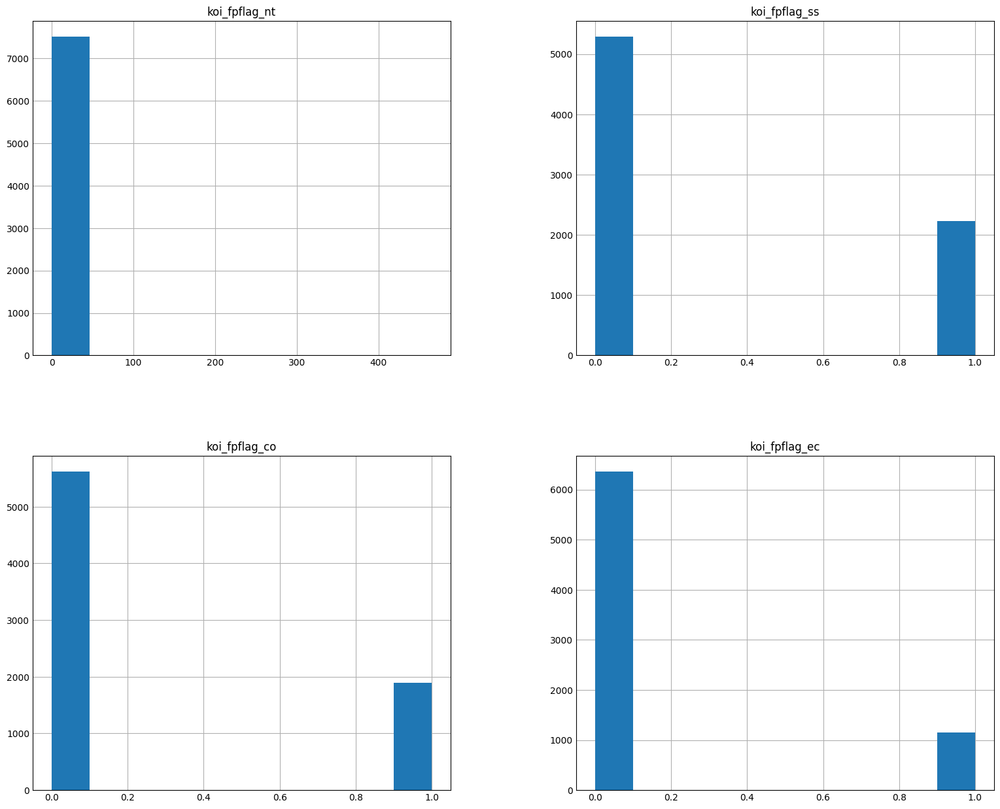

In [196]:
#Criação da imagem
df_exoplanets[project_disposition_columns[:]].hist(figsize=(15,12))

array([[<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_nt'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_nt'>,
        <AxesSubplot: xlabel='koi_fpflag_co', ylabel='koi_fpflag_nt'>,
        <AxesSubplot: xlabel='koi_fpflag_ec', ylabel='koi_fpflag_nt'>],
       [<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_ss'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_ss'>,
        <AxesSubplot: xlabel='koi_fpflag_co', ylabel='koi_fpflag_ss'>,
        <AxesSubplot: xlabel='koi_fpflag_ec', ylabel='koi_fpflag_ss'>],
       [<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_co'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_co'>,
        <AxesSubplot: xlabel='koi_fpflag_co', ylabel='koi_fpflag_co'>,
        <AxesSubplot: xlabel='koi_fpflag_ec', ylabel='koi_fpflag_co'>],
       [<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_ec'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_ec'>,
   

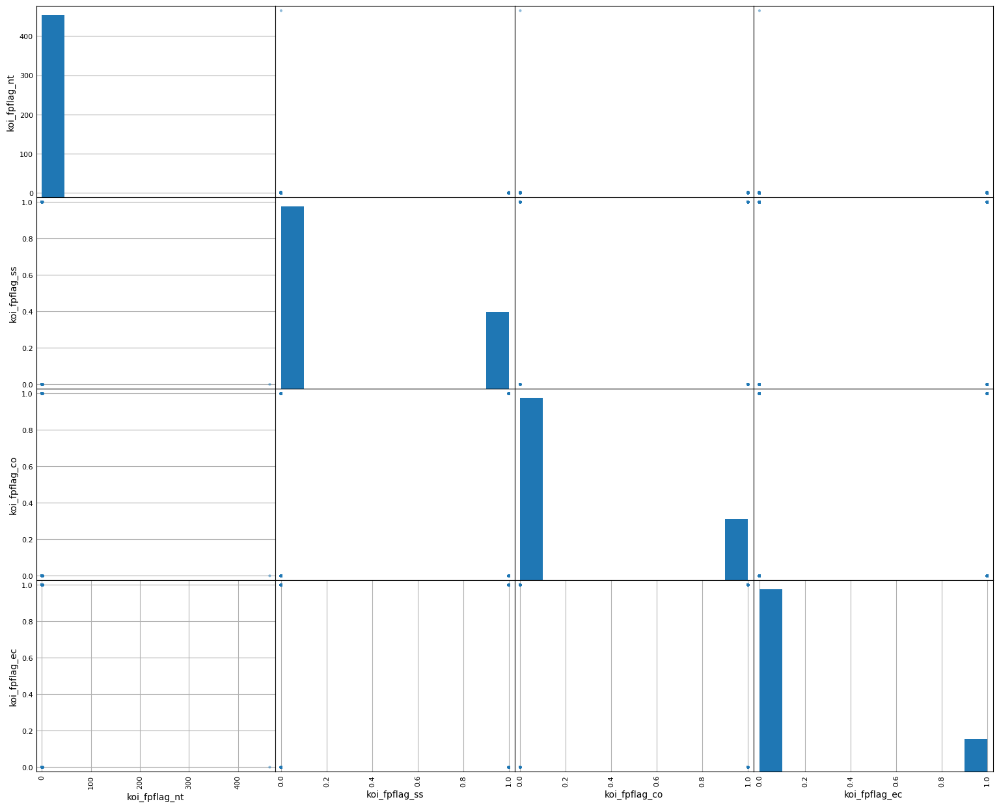

In [197]:
scatter_matrix(df_exoplanets[project_disposition_columns[:]],figsize=(15,12))

##### ATRIBUTO koi_score

In [198]:
# ATRIBUTO koi_score
# A value between 0 and 1 that indicates the confidence in the KOIdisposition.
# For CANDIDATEs, a higher value indicates more confidencein its disposition, 
# while for FALSE POSITIVEs, a higher value indicatesless confidence in that disposition. 
# The value is calculated from a MonteCarlo technique such that the score's value is equivalent to the frction ofiterations where the Robovetter yields a disposition of CANDIDATE.

# Inicialmente sem insights para esse atributo

##### ATRIBUTO koi_fpflag_nt

count    7508.000000
mean        0.265583
std         5.379242
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       465.000000
Name: koi_fpflag_nt, dtype: float64


<AxesSubplot: >

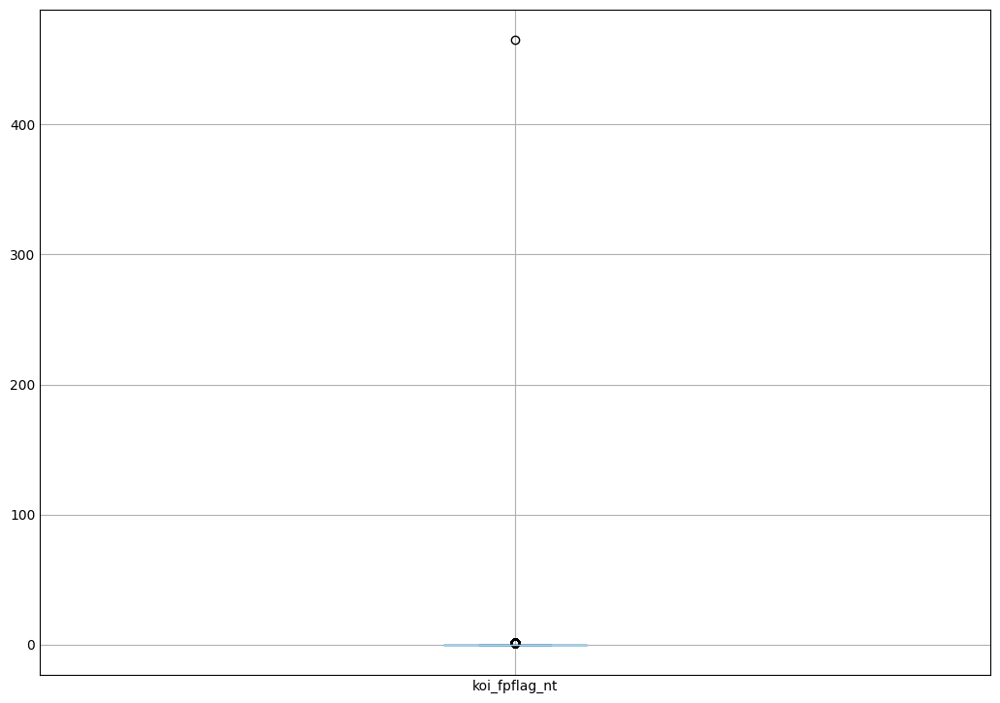

In [199]:
# ATRIBUTO koi_fpflag_nt
# A KOI whose light curve is not consistent with that of a transiting planet.
# This includes, but is not limited to, instrumental artifacts, non-eclipsingvariable stars, and spurious (very low SNR) detections.
print(df_exoplanets['koi_fpflag_nt'].describe())
df_exoplanets['koi_fpflag_nt'].plot(kind='box',figsize=(10,7))

In [200]:
#Como o atributo é uma flag deveria ser 0 ou 1 - porém um registro apresenta o valor 465 - será retirado do modelo
df_exoplanets.drop_duplicates(subset=['koi_fpflag_nt'])

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,0,0,0,0,9.488036,0.146,2.9575,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,0.2291,0.4603,5.135849,28.470820,35.8,2,142.0,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
93,FALSE POSITIVE,1,0,1,0,7.544039,1.175,6.2220,322.6,0.194187,0.00393,17.47,0.0731,58.94,838.0,0.2711,0.3858,4.500132,12.162734,14.2,1,143.0,5657.0,4.567,-0.18,0.824,0.919,293.94116,38.601101,15.559,16.125,15.509,15.316,15.222,14.282,13.905,13.841
3008,CONFIRMED,465,0,0,0,16.542953,0.329,3.8516,726.0,0.024368,2.23110,2.31,0.1229,89.41,611.0,0.1828,0.5324,6.060774,30.508324,36.1,1,63.0,5215.0,4.518,0.28,0.867,0.904,297.67261,48.302311,14.687,15.408,14.606,14.378,14.282,13.267,12.789,12.724


In [201]:
print(df_exoplanets['koi_fpflag_nt'].count())
filtro = df_exoplanets['koi_fpflag_nt'] > 1
df_exoplanets[filtro]
df_exoplanets.drop([3008],inplace=True)
print(df_exoplanets['koi_fpflag_nt'].count())

7508
7507


In [202]:
df_exoplanets.drop_duplicates(subset=['koi_fpflag_nt'])

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,0,0,0,0,9.488036,0.146,2.9575,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,0.2291,0.4603,5.135849,28.470820,35.8,2,142.0,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
93,FALSE POSITIVE,1,0,1,0,7.544039,1.175,6.2220,322.6,0.194187,0.00393,17.47,0.0731,58.94,838.0,0.2711,0.3858,4.500132,12.162734,14.2,1,143.0,5657.0,4.567,-0.18,0.824,0.919,293.94116,38.601101,15.559,16.125,15.509,15.316,15.222,14.282,13.905,13.841


##### ATRIBUTO koi_fpflag_ss

count    7507.000000
mean        0.296257
std         0.456636
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: koi_fpflag_ss, dtype: float64


<AxesSubplot: ylabel='Frequency'>

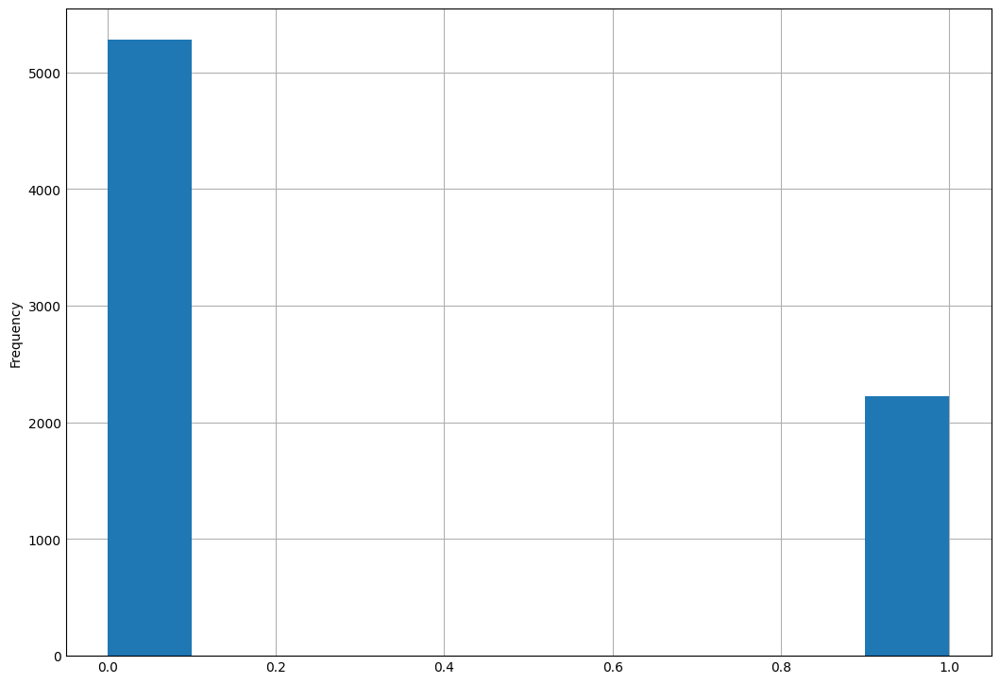

In [203]:
# ATRIBUTO koi_fpflag_ss
# A KOI that is observed to have a significant secondary event, transitshape, or out-of-eclipse variability, 
# which indicates that the transit-likeevent is most likely caused by an eclipsing binary.
# However, self-luminous, hot Jupiters with a visible secondary eclipse will also have thisflag set, but with a disposition of PC.
print(df_exoplanets['koi_fpflag_ss'].describe())
df_exoplanets['koi_fpflag_ss'].plot(kind='hist',figsize=(10,7))
# Mesma situação da flag NT porém sem necessidade de tratamento

In [204]:
df_exoplanets.drop_duplicates(subset=['koi_fpflag_ss'])

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,0,0,0,0,9.488036,0.146,2.95750,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,0.2291,0.4603,5.135849,28.47082,35.8,2,142.0,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.89,15.270,15.114,15.006,14.082,13.751,13.648
3,FALSE POSITIVE,0,1,0,0,1.736952,1.276,2.40641,8079.2,0.387394,0.22080,33.46,0.0267,67.09,1395.0,0.2865,0.3556,39.066550,541.89510,505.6,1,621.0,5805.0,4.564,-0.52,0.791,0.836,285.53461,48.285210,15.597,16.10,15.554,15.382,15.266,14.326,13.911,13.809


##### ATRIBUTO koi_fpflag_co

count    7507.000000
mean        0.251632
std         0.433980
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: koi_fpflag_co, dtype: float64


<AxesSubplot: ylabel='Frequency'>

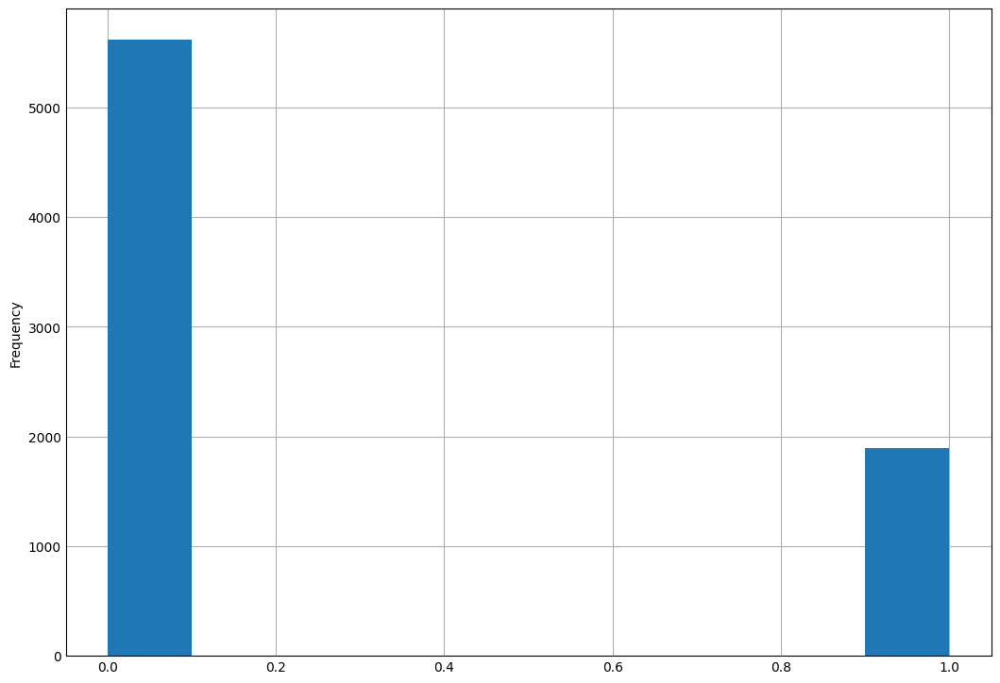

In [205]:
# ATRIBUTO koi_fpflag_ss
# The source of the signal is from a nearby star, as inferred by measuringthe centroid location of the image both in and out of transit,
# or by thestrength of the transit signal in the target's outer (halo) pixels ascompared to the transit signal from the pixels in the optimal (or core)aperture.
print(df_exoplanets['koi_fpflag_co'].describe())
df_exoplanets['koi_fpflag_co'].plot(kind='hist',figsize=(10,7))
# Mesma situação da flag NT porém sem necessidade de tratamento

In [206]:
df_exoplanets.drop_duplicates(subset=['koi_fpflag_co'])

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,0,0,0,0,9.488036,0.146,2.9575,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,0.2291,0.4603,5.135849,28.47082,35.8,2,142.0,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648
8,FALSE POSITIVE,0,1,1,0,7.361790,1.169,5.0220,233.7,0.183387,0.00485,39.21,0.0820,60.92,1342.0,0.3050,0.3201,10.964684,46.15308,47.7,1,185.0,6227.0,3.986,0.00,1.958,1.358,298.86435,42.151569,12.660,12.999,12.609,12.515,12.480,11.659,11.415,11.396


##### ATRIBUTO koi_fpflag_ec

count    7507.000000
mean        0.152924
std         0.359938
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: koi_fpflag_ec, dtype: float64


<AxesSubplot: ylabel='Frequency'>

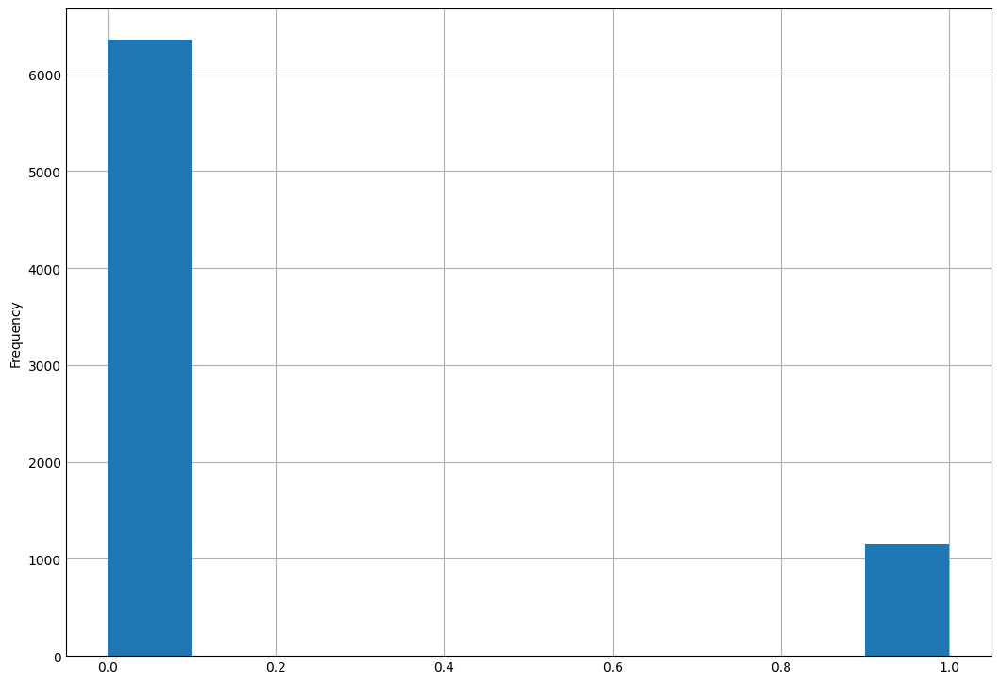

In [207]:
# ATRIBUTO koi_fpflag_co
# The KOI shares the same period and epoch as another object and isjudged to be the result of flux contamination in the aperture or electroniccrosstalk.
print(df_exoplanets['koi_fpflag_ec'].describe())
df_exoplanets['koi_fpflag_ec'].plot(kind='hist',figsize=(10,7))

In [208]:
df_exoplanets.drop_duplicates(subset=['koi_fpflag_ec'])

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
0,CONFIRMED,0,0,0,0,9.488036,0.146,2.9575,615.8,0.022344,3.20796,2.26,0.0853,89.66,793.0,0.2291,0.4603,5.135849,28.470820,35.8,2,142.0,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,15.347,15.89,15.270,15.114,15.006,14.082,13.751,13.648
20,FALSE POSITIVE,0,1,1,1,2.696371,0.044,3.6129,397.9,0.017673,0.51471,1.58,0.0349,89.56,1066.0,0.1496,0.5746,5.508401,34.570904,48.2,1,501.0,4989.0,4.504,0.10,0.819,0.781,283.76547,47.804298,15.269,16.07,15.204,14.926,14.789,13.732,13.212,13.140


array([[<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_nt'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_nt'>,
        <AxesSubplot: xlabel='koi_fpflag_co', ylabel='koi_fpflag_nt'>,
        <AxesSubplot: xlabel='koi_fpflag_ec', ylabel='koi_fpflag_nt'>],
       [<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_ss'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_ss'>,
        <AxesSubplot: xlabel='koi_fpflag_co', ylabel='koi_fpflag_ss'>,
        <AxesSubplot: xlabel='koi_fpflag_ec', ylabel='koi_fpflag_ss'>],
       [<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_co'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_co'>,
        <AxesSubplot: xlabel='koi_fpflag_co', ylabel='koi_fpflag_co'>,
        <AxesSubplot: xlabel='koi_fpflag_ec', ylabel='koi_fpflag_co'>],
       [<AxesSubplot: xlabel='koi_fpflag_nt', ylabel='koi_fpflag_ec'>,
        <AxesSubplot: xlabel='koi_fpflag_ss', ylabel='koi_fpflag_ec'>,
   

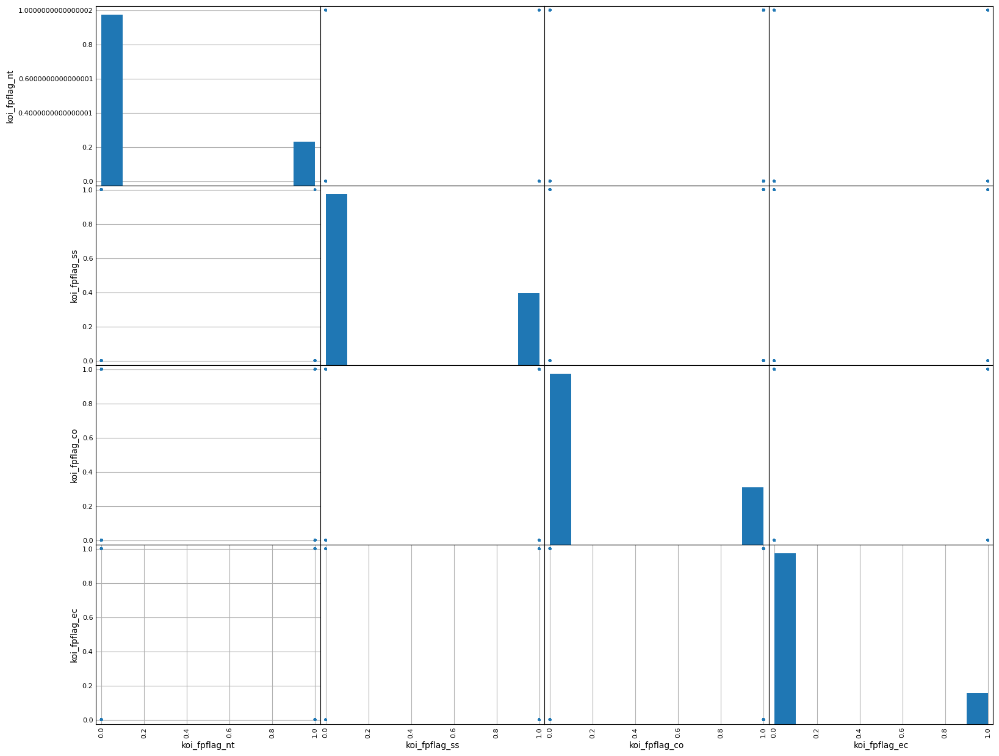

In [209]:
scatter_matrix(df_exoplanets[project_disposition_columns[:]],figsize=(15,12))

### 4.3 Categoria -> transit_properties

In [210]:
# Análise exploratória da Categoria transit_properties
# Atributos presentes nessa categoria
transit_properties

['koi_period',
 'koi_impact',
 'koi_duration',
 'koi_depth',
 'koi_ror',
 'koi_srho',
 'koi_prad',
 'koi_sma',
 'koi_incl',
 'koi_teq',
 'koi_ldm_coeff2',
 'koi_ldm_coeff1']

array([[<AxesSubplot: title={'center': 'koi_period'}>,
        <AxesSubplot: title={'center': 'koi_impact'}>,
        <AxesSubplot: title={'center': 'koi_duration'}>],
       [<AxesSubplot: title={'center': 'koi_depth'}>,
        <AxesSubplot: title={'center': 'koi_ror'}>,
        <AxesSubplot: title={'center': 'koi_srho'}>],
       [<AxesSubplot: title={'center': 'koi_prad'}>,
        <AxesSubplot: title={'center': 'koi_sma'}>,
        <AxesSubplot: title={'center': 'koi_incl'}>],
       [<AxesSubplot: title={'center': 'koi_teq'}>,
        <AxesSubplot: title={'center': 'koi_ldm_coeff2'}>,
        <AxesSubplot: title={'center': 'koi_ldm_coeff1'}>]], dtype=object)

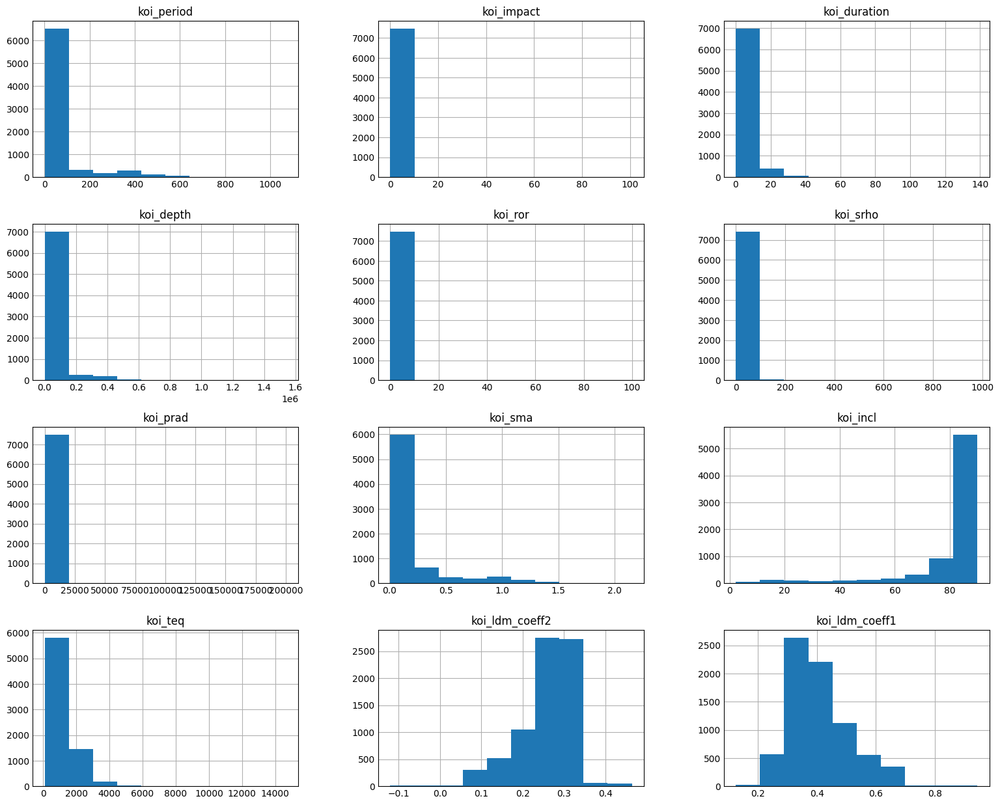

In [211]:
# Plot dos histogramas da categoria
# Criação da imagem
df_exoplanets[transit_properties[:]].hist(figsize=(15,12))

In [212]:
df_exoplanets[transit_properties[:]].describe()

,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1
count,7507.000000,7507.000000,7507.000000,7.507000e+03,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000
mean,51.797237,0.758226,5.725596,2.983517e+04,0.296077,7.008373,105.234738,0.190413,81.165770,1157.765376,0.254902,0.406316
std,112.156312,3.157343,6.848792,9.001637e+04,3.116994,47.805516,3141.885668,0.286810,16.174228,888.239616,0.064160,0.105274
min,0.241843,0.000000,0.104600,8.000000e-01,0.001289,0.000040,0.080000,0.005900,2.290000,92.000000,-0.120600,0.125400
25%,2.224613,0.241550,2.478950,1.900000e+02,0.013489,0.193355,1.530000,0.034300,81.166869,593.000000,0.229100,0.326800
50%,8.038670,0.613000,3.842640,5.386000e+02,0.024912,0.856500,2.750000,0.079600,87.800000,966.000000,0.267800,0.392800
75%,30.582145,0.908000,6.279000,4.510950e+03,0.241305,2.716575,29.345000,0.190404,89.590000,1459.500000,0.298100,0.460300
max,1071.232624,100.806000,138.540000,1.541400e+06,99.870651,980.854190,200346.000000,2.152500,90.000000,14667.000000,0.464000,0.944300


array([[<AxesSubplot: xlabel='koi_period', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_impact', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_duration', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_depth', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_ror', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_srho', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_prad', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_sma', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_incl', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_teq', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_ldm_coeff2', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_ldm_coeff1', ylabel='koi_period'>],
       [<AxesSubplot: xlabel='koi_period', ylabel='koi_impact'>,
        <AxesSubplot: xlabel='koi_impact', ylabel='koi_impact'>,
        <AxesSubplot: xlabel='koi_duration', ylabel='koi_impact'>,
        <AxesSubplot: xlabel

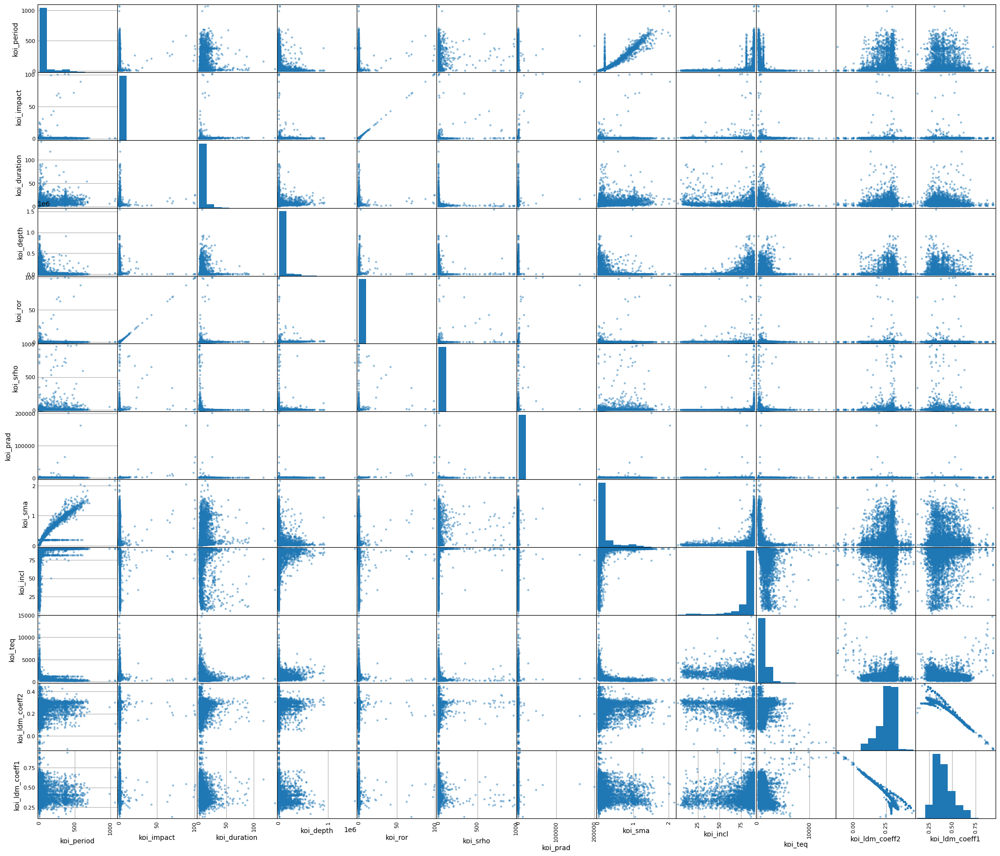

In [213]:
scatter_matrix(df_exoplanets[transit_properties[:]],figsize=(20,17))

In [214]:
df_exoplanets[transit_properties[:]].describe()

,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1
count,7507.000000,7507.000000,7507.000000,7.507000e+03,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000,7507.000000
mean,51.797237,0.758226,5.725596,2.983517e+04,0.296077,7.008373,105.234738,0.190413,81.165770,1157.765376,0.254902,0.406316
std,112.156312,3.157343,6.848792,9.001637e+04,3.116994,47.805516,3141.885668,0.286810,16.174228,888.239616,0.064160,0.105274
min,0.241843,0.000000,0.104600,8.000000e-01,0.001289,0.000040,0.080000,0.005900,2.290000,92.000000,-0.120600,0.125400
25%,2.224613,0.241550,2.478950,1.900000e+02,0.013489,0.193355,1.530000,0.034300,81.166869,593.000000,0.229100,0.326800
50%,8.038670,0.613000,3.842640,5.386000e+02,0.024912,0.856500,2.750000,0.079600,87.800000,966.000000,0.267800,0.392800
75%,30.582145,0.908000,6.279000,4.510950e+03,0.241305,2.716575,29.345000,0.190404,89.590000,1459.500000,0.298100,0.460300
max,1071.232624,100.806000,138.540000,1.541400e+06,99.870651,980.854190,200346.000000,2.152500,90.000000,14667.000000,0.464000,0.944300


##### Atributo koi_period

<AxesSubplot: >

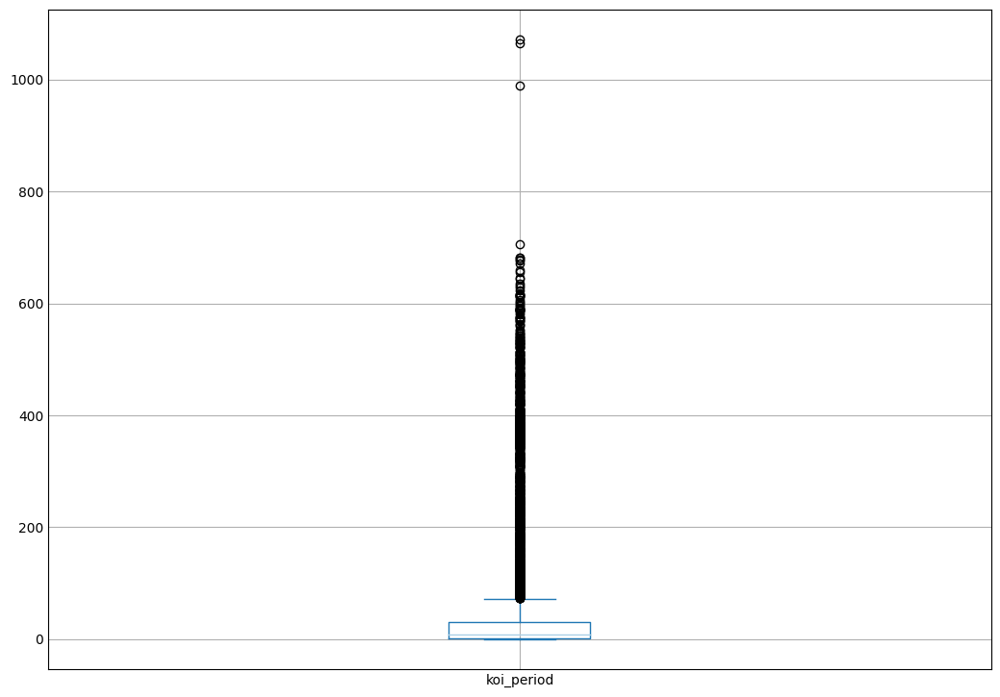

In [215]:
df_exoplanets['koi_period'].plot(kind='box',figsize=(10,7))

##### Atributo koi_impact

<AxesSubplot: >

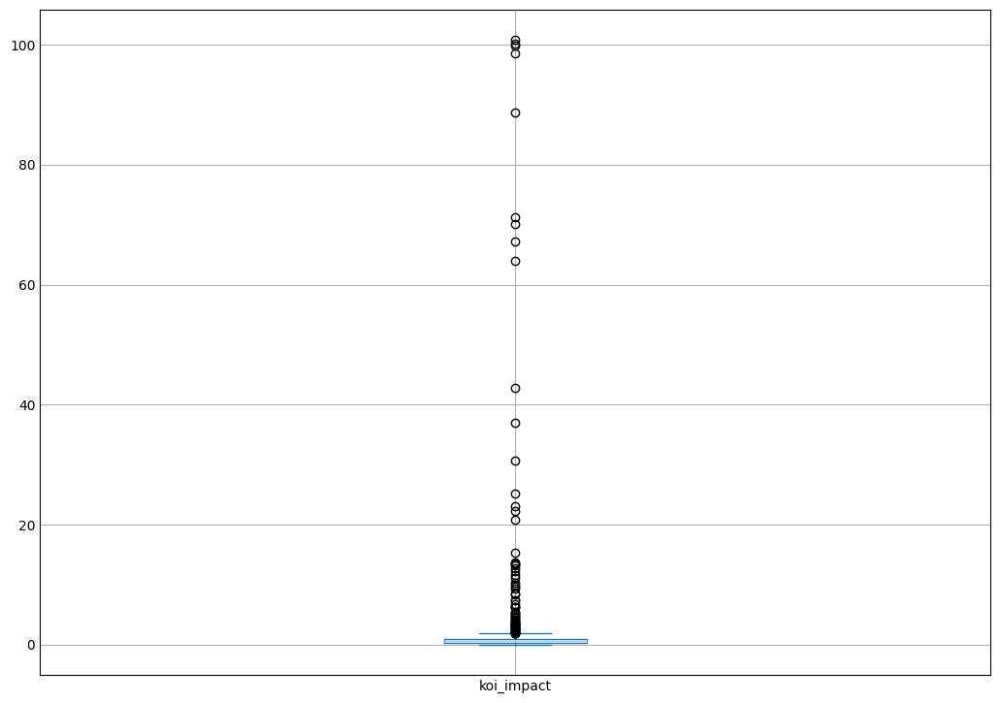

In [216]:
df_exoplanets['koi_impact'].plot(kind='box',figsize=(10,7))

<AxesSubplot: >

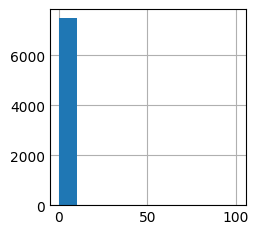

In [217]:
df_exoplanets['koi_impact'].hist()

In [218]:
df_exoplanets['koi_impact'].describe()

count    7507.000000
mean        0.758226
std         3.157343
min         0.000000
25%         0.241550
50%         0.613000
75%         0.908000
max       100.806000
Name: koi_impact, dtype: float64

##### Atributo koi_duration

<AxesSubplot: >

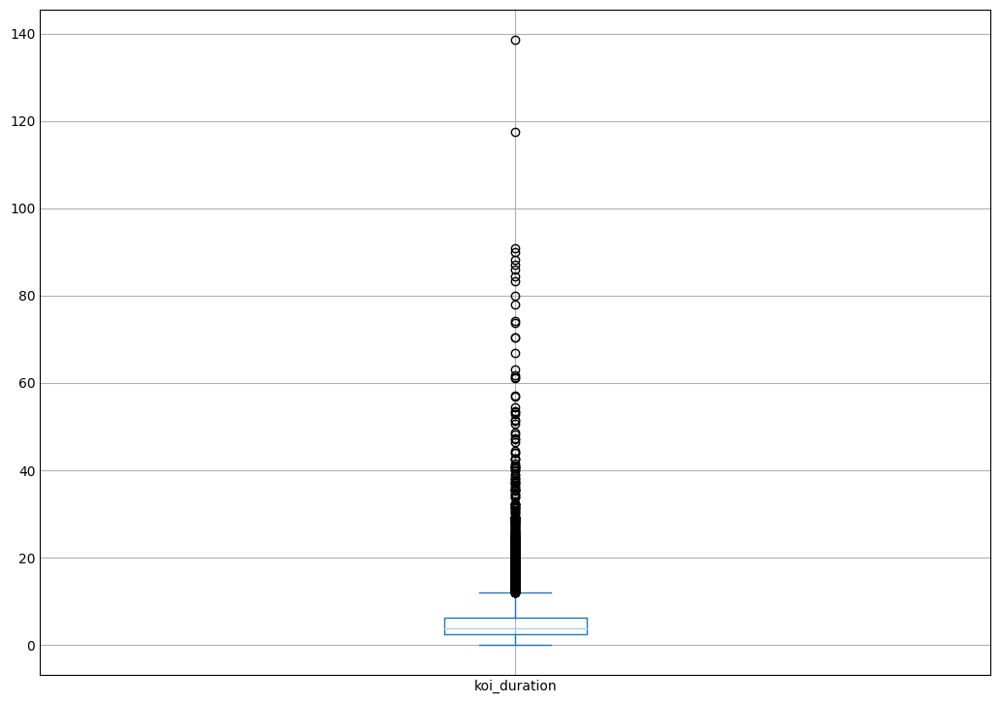

In [219]:
df_exoplanets['koi_duration'].plot(kind='box',figsize=(10,7))

##### Atributo koi_depth

<AxesSubplot: >

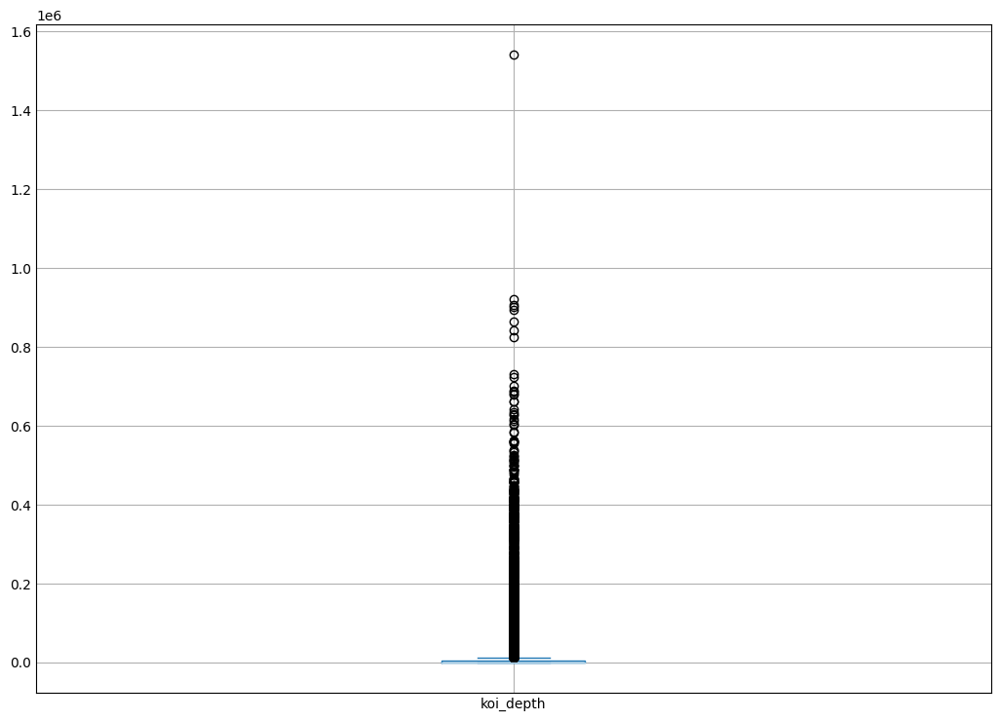

In [220]:
df_exoplanets['koi_depth'].plot(kind='box',figsize=(10,7))

##### Atributo koi_ror

<AxesSubplot: >

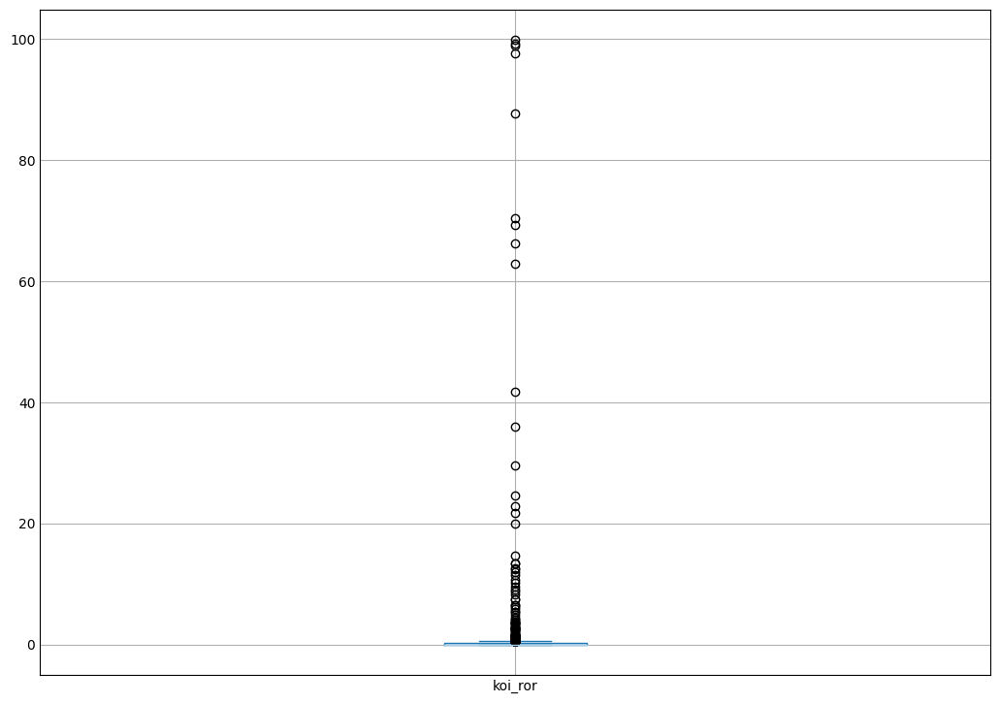

In [221]:
df_exoplanets['koi_ror'].plot(kind='box',figsize=(10,7))

##### Atributo koi_srho

<AxesSubplot: >

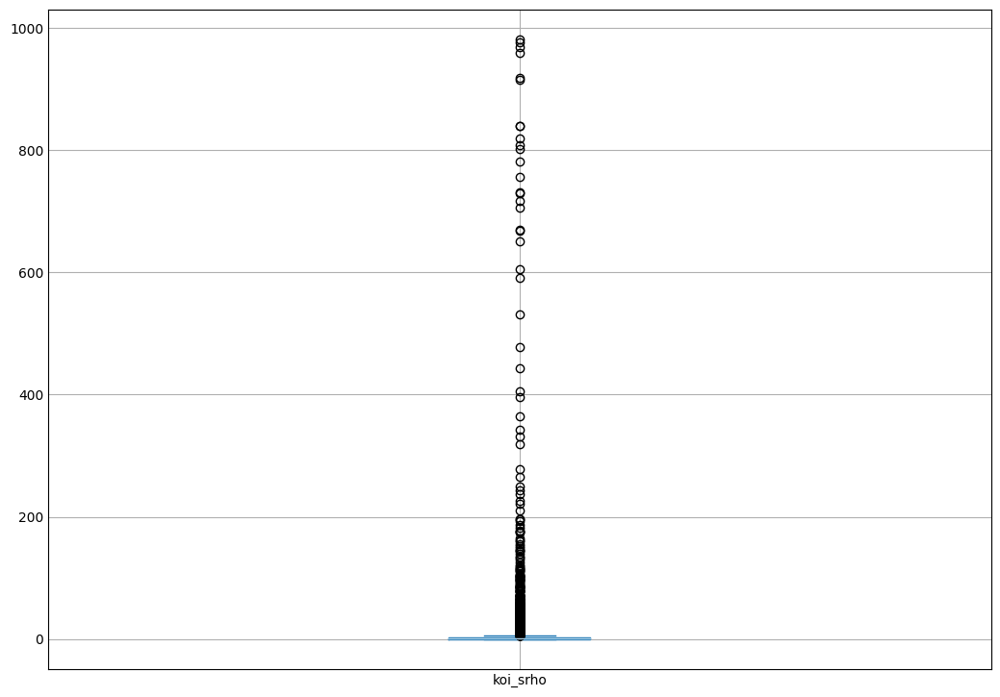

In [222]:
df_exoplanets['koi_srho'].plot(kind='box',figsize=(10,7))

##### Atributo koi_prad

<AxesSubplot: >

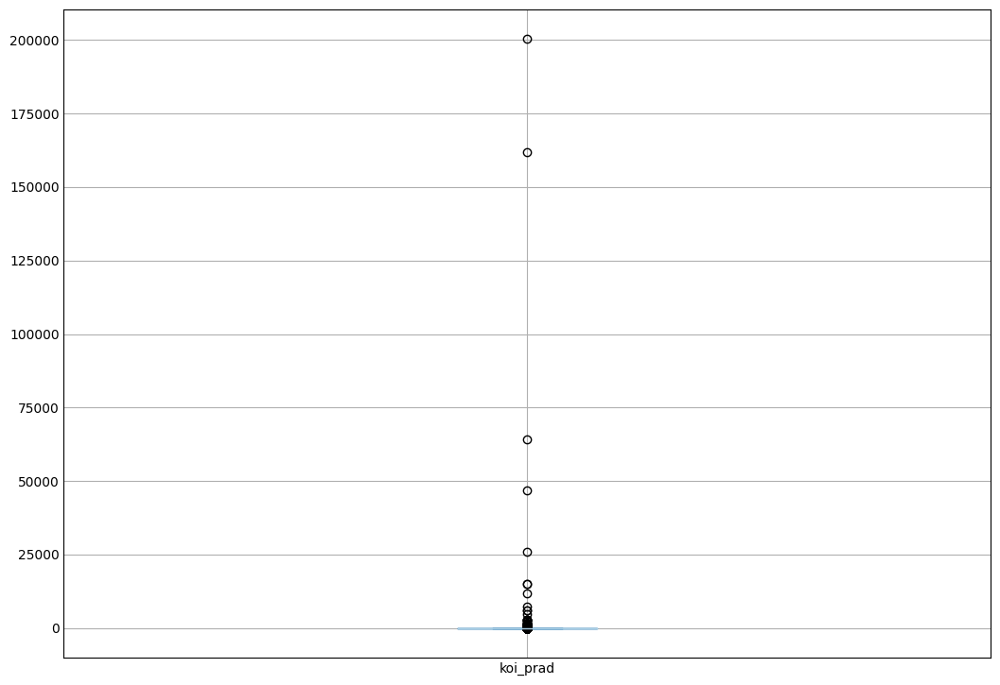

In [223]:
df_exoplanets['koi_prad'].plot(kind='box',figsize=(10,7))

In [224]:
df_exoplanets['koi_prad'].describe()

count      7507.000000
mean        105.234738
std        3141.885668
min           0.080000
25%           1.530000
50%           2.750000
75%          29.345000
max      200346.000000
Name: koi_prad, dtype: float64

In [225]:
#Criação de limiar para retiradas de outliers baseado nas imagens e dados
limiar_sup = df_exoplanets['koi_prad'].mean() + 2 * df_exoplanets['koi_prad'].std()
#limiar_inf = df_exoplanets['koi_prad'].mean() - 2 * df_exoplanets['koi_prad'].std()
#limiar_sup
filtro = df_exoplanets['koi_prad'] > limiar_sup
df_exoplanets[filtro].index
print(df_exoplanets['koi_prad'].count())
df_exoplanets.drop(df_exoplanets[filtro].index,inplace=True)
print(df_exoplanets['koi_prad'].count())

7507
7498


<AxesSubplot: >

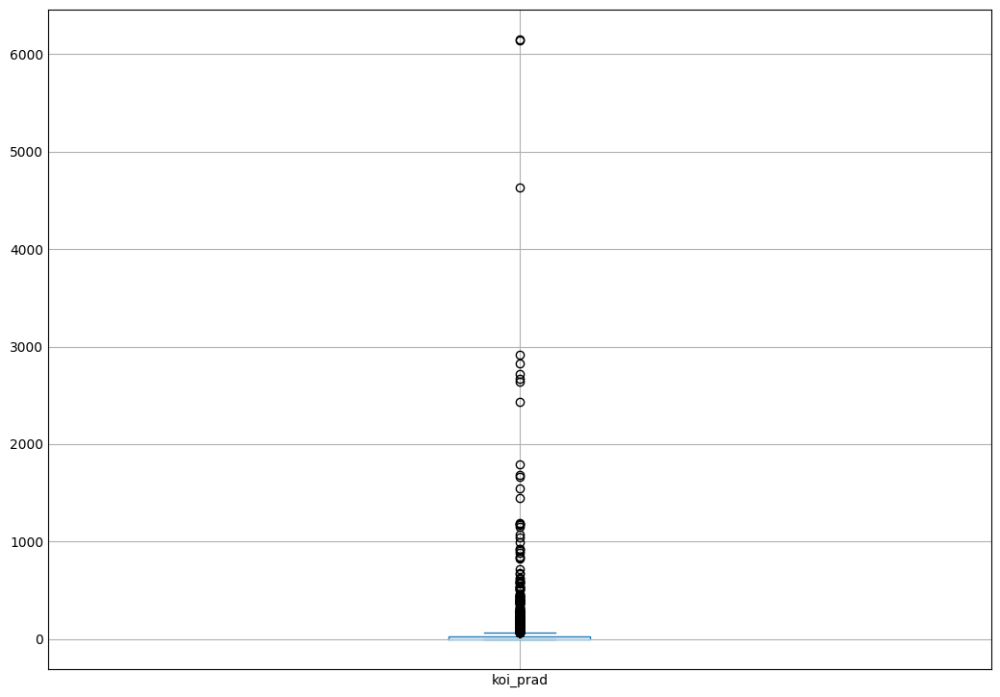

In [226]:
df_exoplanets['koi_prad'].plot(kind='box',figsize=(10,7))

<AxesSubplot: ylabel='Frequency'>

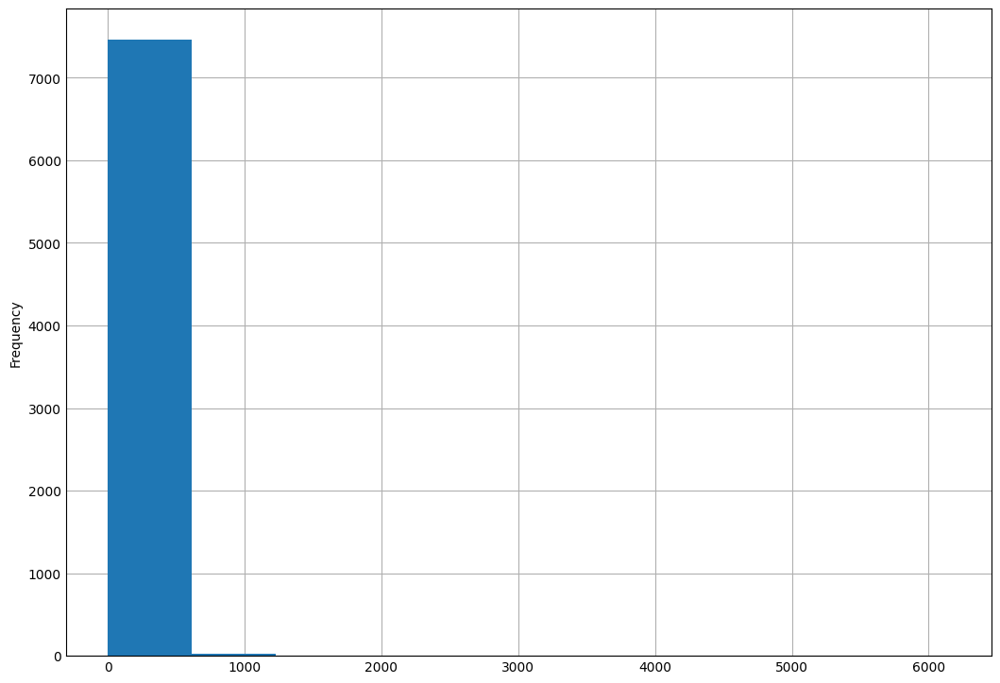

In [227]:
df_exoplanets['koi_prad'].plot(kind='hist',figsize=(10,7))

##### Atributo koi_sma

<AxesSubplot: >

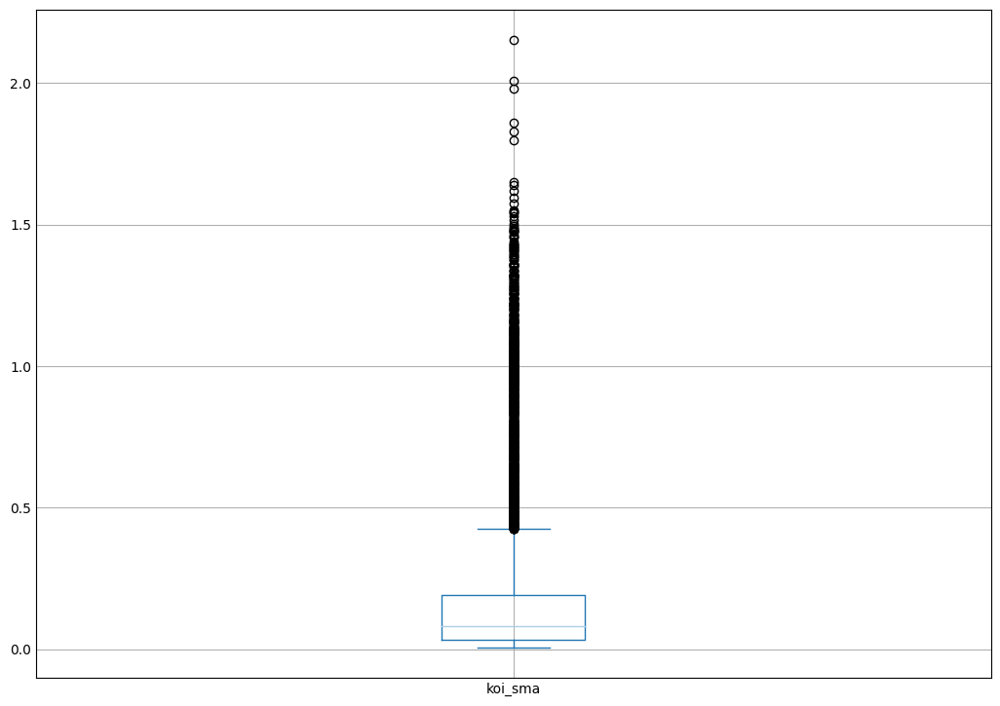

In [228]:
df_exoplanets['koi_sma'].plot(kind='box',figsize=(10,7))

##### Atributo koi_incl

<AxesSubplot: >

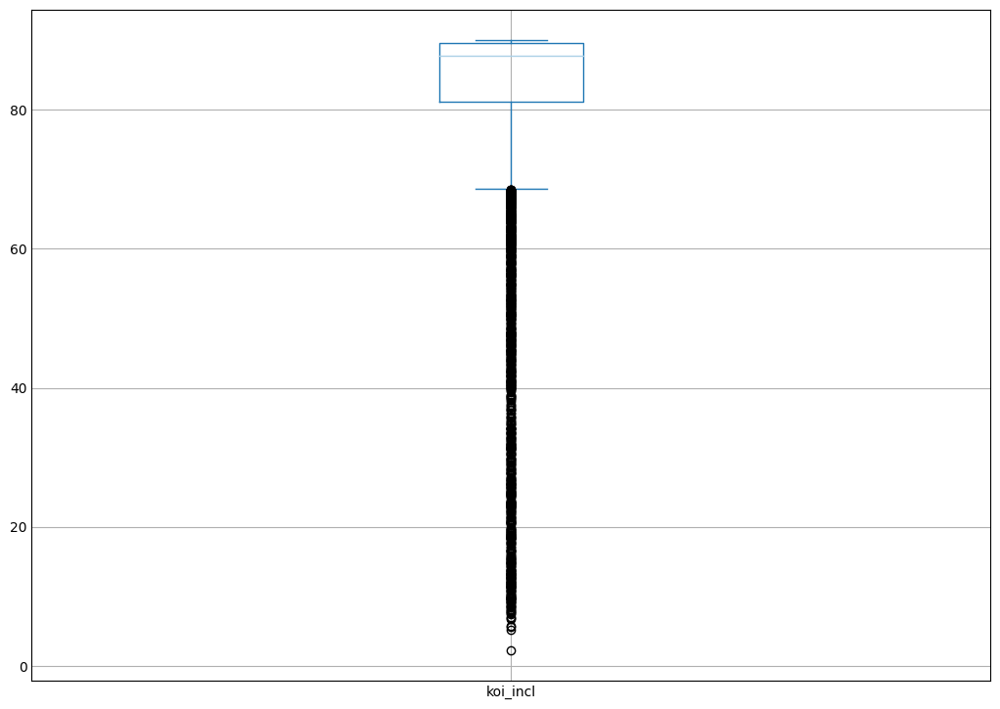

In [229]:
df_exoplanets['koi_incl'].plot(kind='box',figsize=(10,7))

##### Atributo koi_teq

<AxesSubplot: >

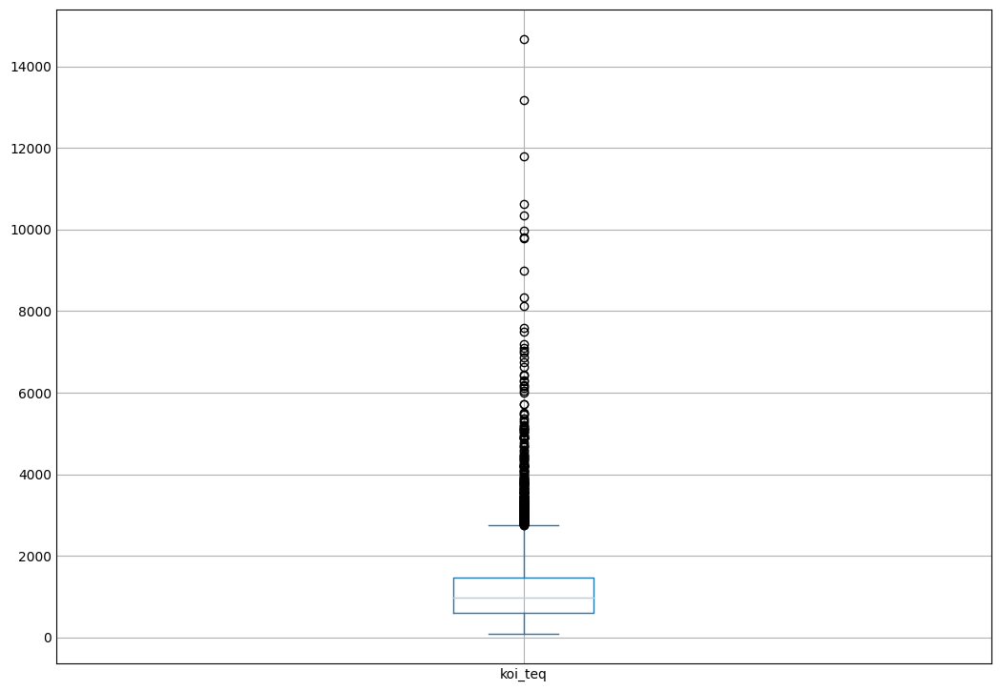

In [230]:
df_exoplanets['koi_teq'].plot(kind='box',figsize=(10,7))

In [231]:
#Criação de limiar para retiradas de outliers baseado nas imagens e dados
limiar_sup = df_exoplanets['koi_teq'].mean() + 2 * df_exoplanets['koi_teq'].std()
limiar_inf = df_exoplanets['koi_teq'].mean() - 2 * df_exoplanets['koi_teq'].std()
limiar_sup
filtro = df_exoplanets['koi_teq'] > limiar_sup
df_exoplanets[filtro].index
print(df_exoplanets['koi_teq'].count())
df_exoplanets.drop(df_exoplanets[filtro].index,inplace=True)
print(df_exoplanets['koi_teq'].count())

7498
7229


<AxesSubplot: >

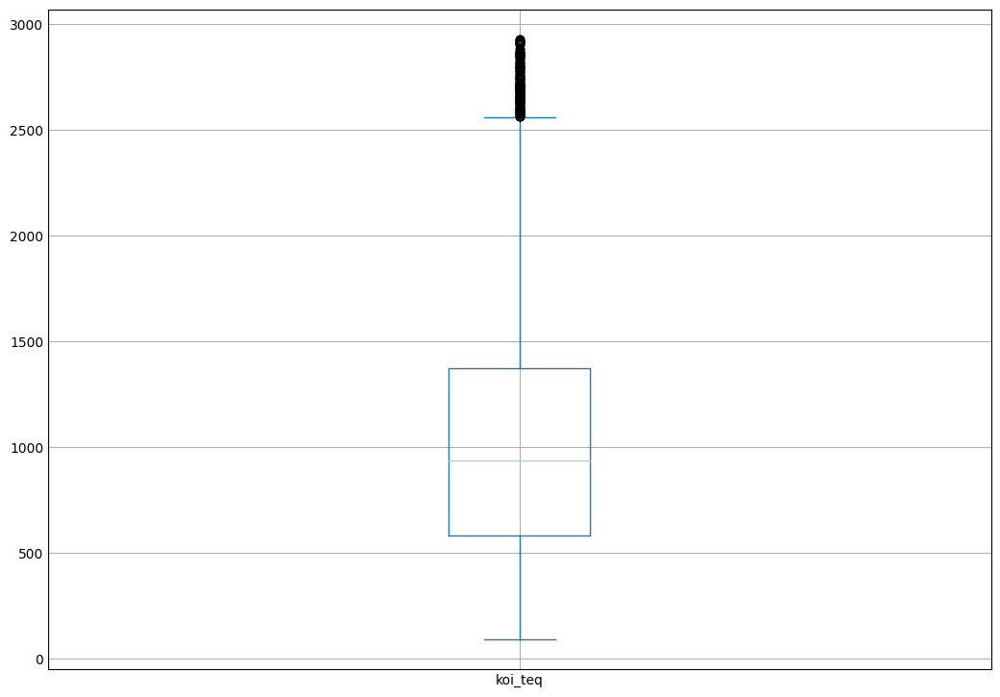

In [232]:
df_exoplanets['koi_teq'].plot(kind='box',figsize=(10,7))

##### Atributo koi_ldm_coeff1

<AxesSubplot: >

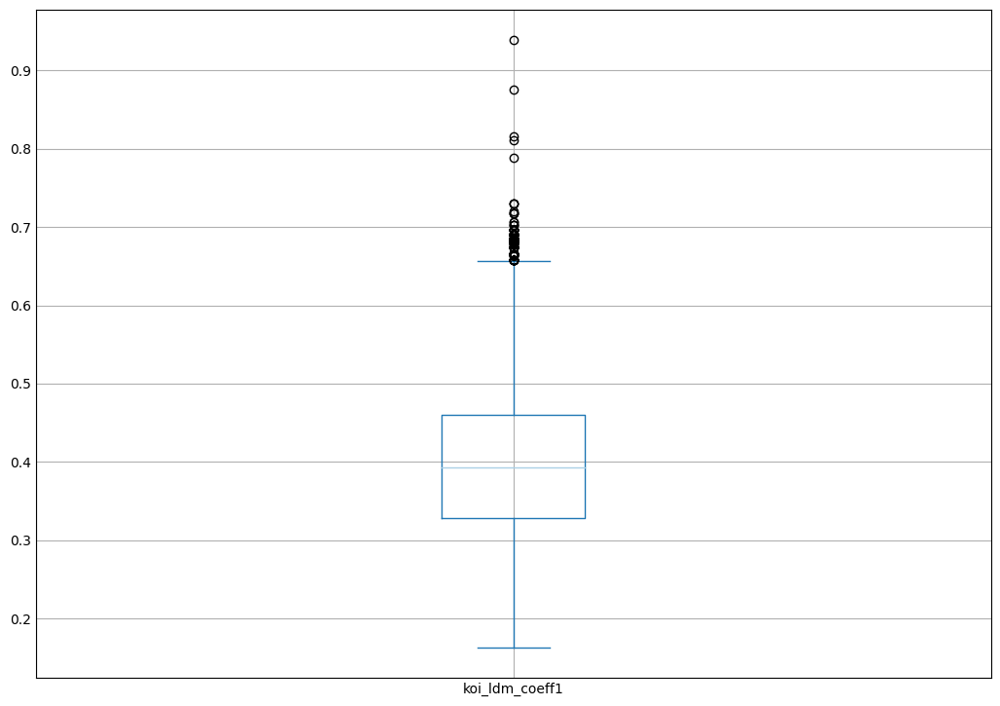

In [233]:
df_exoplanets['koi_ldm_coeff1'].plot(kind='box',figsize=(10,7))

##### Atributo koi_ldm_coeff2

<AxesSubplot: >

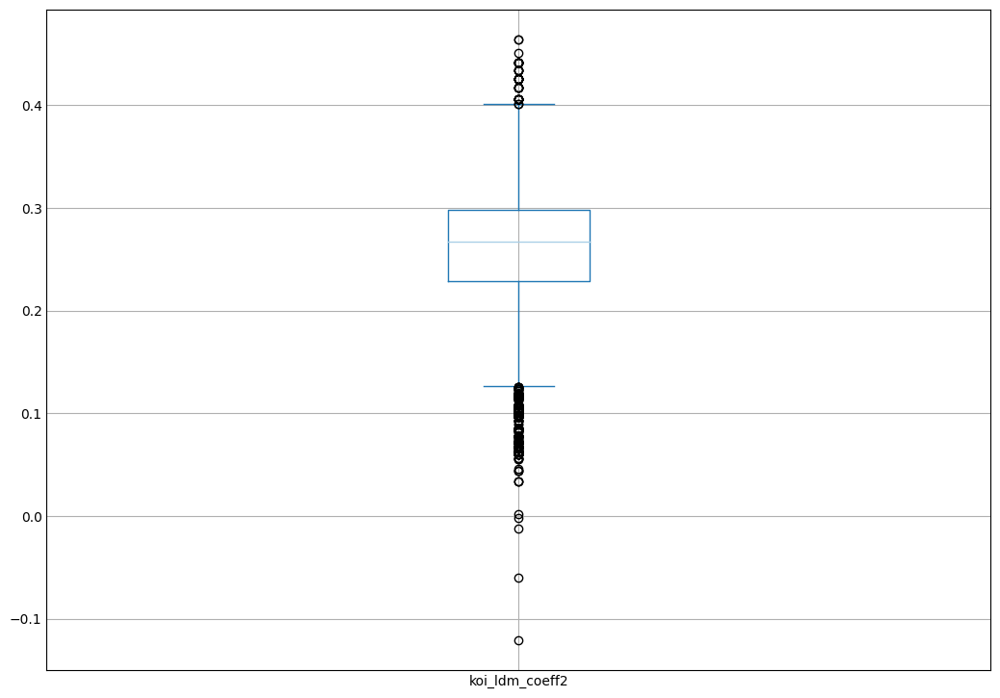

In [234]:
df_exoplanets['koi_ldm_coeff2'].plot(kind='box',figsize=(10,7))

array([[<AxesSubplot: xlabel='koi_period', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_impact', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_duration', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_depth', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_ror', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_srho', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_prad', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_sma', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_incl', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_teq', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_ldm_coeff2', ylabel='koi_period'>,
        <AxesSubplot: xlabel='koi_ldm_coeff1', ylabel='koi_period'>],
       [<AxesSubplot: xlabel='koi_period', ylabel='koi_impact'>,
        <AxesSubplot: xlabel='koi_impact', ylabel='koi_impact'>,
        <AxesSubplot: xlabel='koi_duration', ylabel='koi_impact'>,
        <AxesSubplot: xlabel

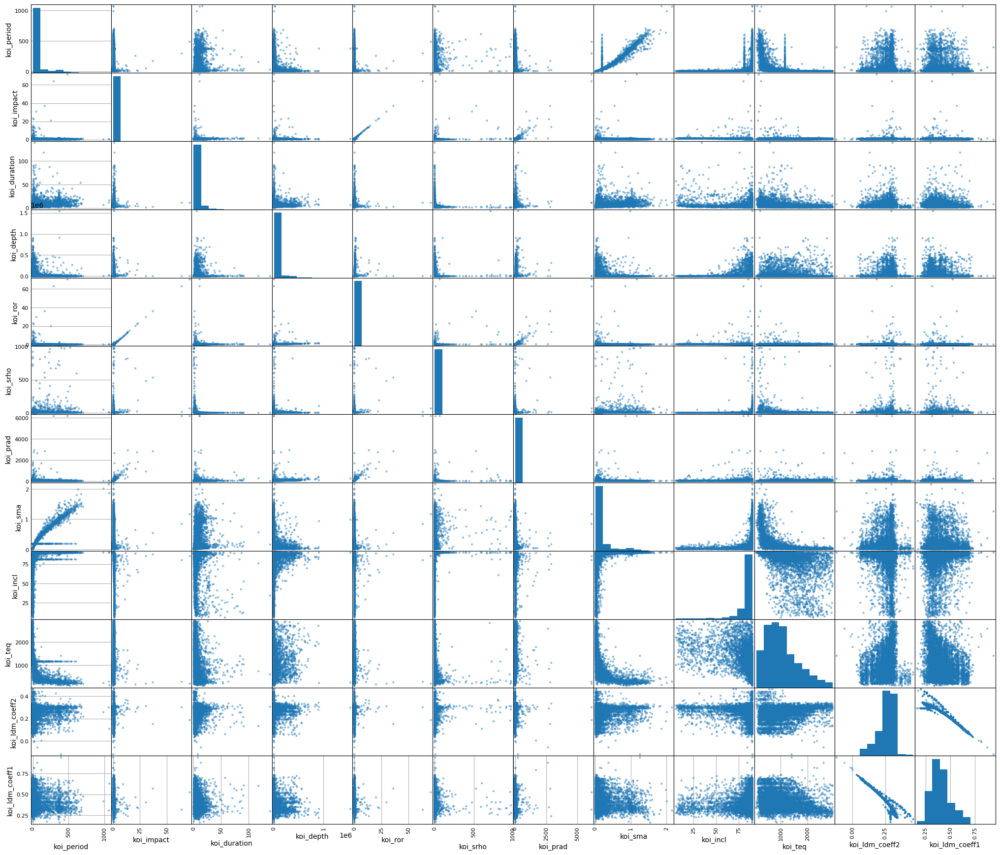

In [235]:
scatter_matrix(df_exoplanets[transit_properties[:]],figsize=(20,17))

### 4.4 Categoria -> tce_event_information

array([[<AxesSubplot: xlabel='koi_max_sngle_ev', ylabel='koi_max_sngle_ev'>,
        <AxesSubplot: xlabel='koi_max_mult_ev', ylabel='koi_max_sngle_ev'>,
        <AxesSubplot: xlabel='koi_model_snr', ylabel='koi_max_sngle_ev'>,
        <AxesSubplot: xlabel='koi_count', ylabel='koi_max_sngle_ev'>,
        <AxesSubplot: xlabel='koi_num_transits', ylabel='koi_max_sngle_ev'>],
       [<AxesSubplot: xlabel='koi_max_sngle_ev', ylabel='koi_max_mult_ev'>,
        <AxesSubplot: xlabel='koi_max_mult_ev', ylabel='koi_max_mult_ev'>,
        <AxesSubplot: xlabel='koi_model_snr', ylabel='koi_max_mult_ev'>,
        <AxesSubplot: xlabel='koi_count', ylabel='koi_max_mult_ev'>,
        <AxesSubplot: xlabel='koi_num_transits', ylabel='koi_max_mult_ev'>],
       [<AxesSubplot: xlabel='koi_max_sngle_ev', ylabel='koi_model_snr'>,
        <AxesSubplot: xlabel='koi_max_mult_ev', ylabel='koi_model_snr'>,
        <AxesSubplot: xlabel='koi_model_snr', ylabel='koi_model_snr'>,
        <AxesSubplot: xlabel='koi_cou

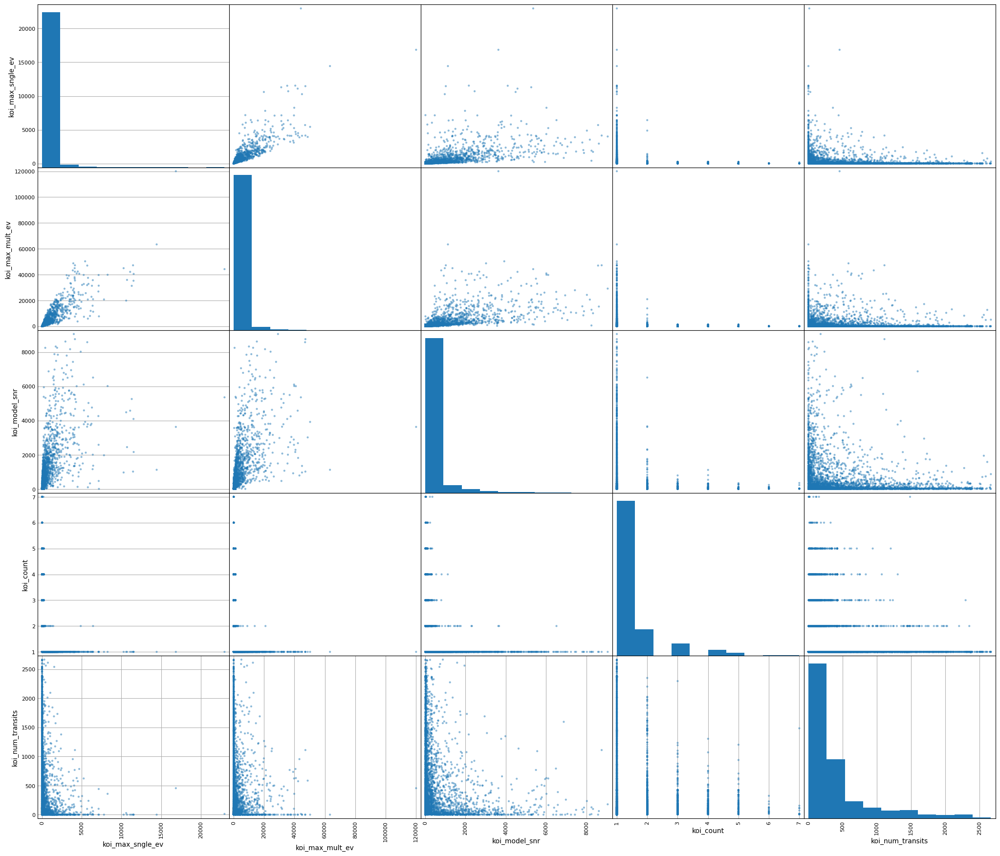

In [236]:
scatter_matrix(df_exoplanets[tce_event_information[:]],figsize=(20,17))

### 4.5 Categoria -> stellar_parameters

array([[<AxesSubplot: xlabel='koi_steff', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_slogg', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_smet', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_srad', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_smass', ylabel='koi_steff'>],
       [<AxesSubplot: xlabel='koi_steff', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_slogg', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_smet', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_srad', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_smass', ylabel='koi_slogg'>],
       [<AxesSubplot: xlabel='koi_steff', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_slogg', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_smet', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_srad', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_smass', ylabel='koi_smet'>],
       [<AxesSubplot: xlabel='koi_steff', ylabel='koi_srad'>,
 

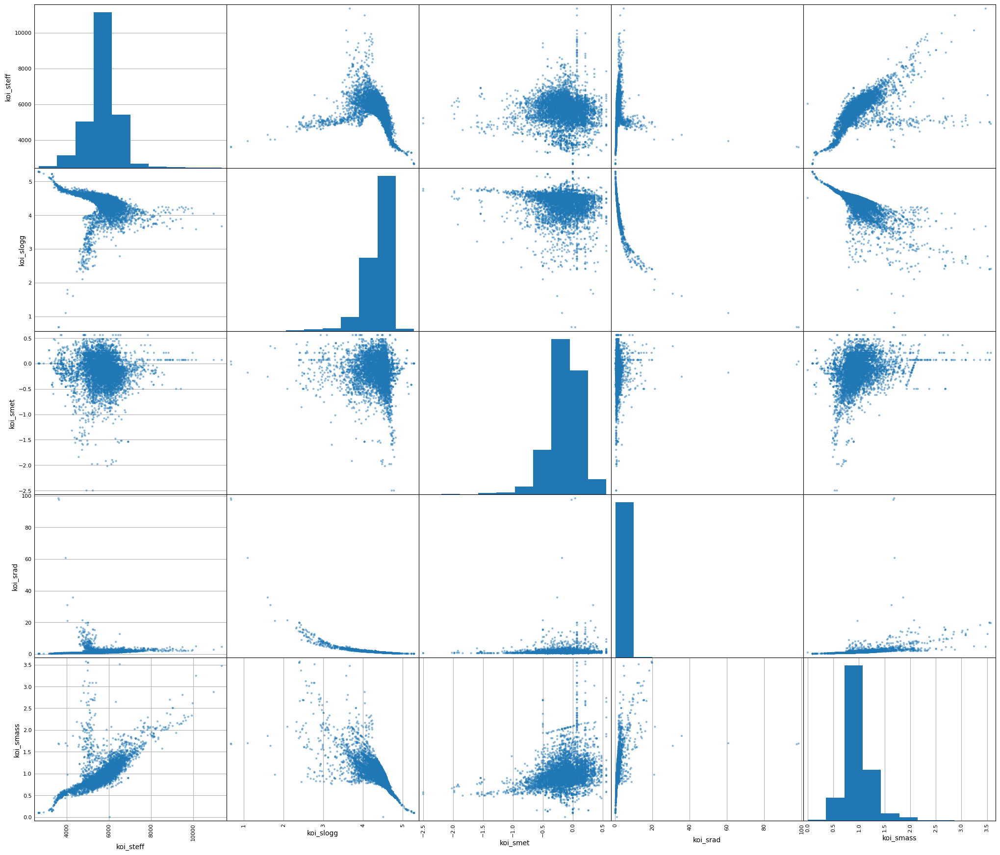

In [237]:
scatter_matrix(df_exoplanets[stellar_parameters[:]],figsize=(20,17))

##### Atributo koi_steff

<AxesSubplot: >

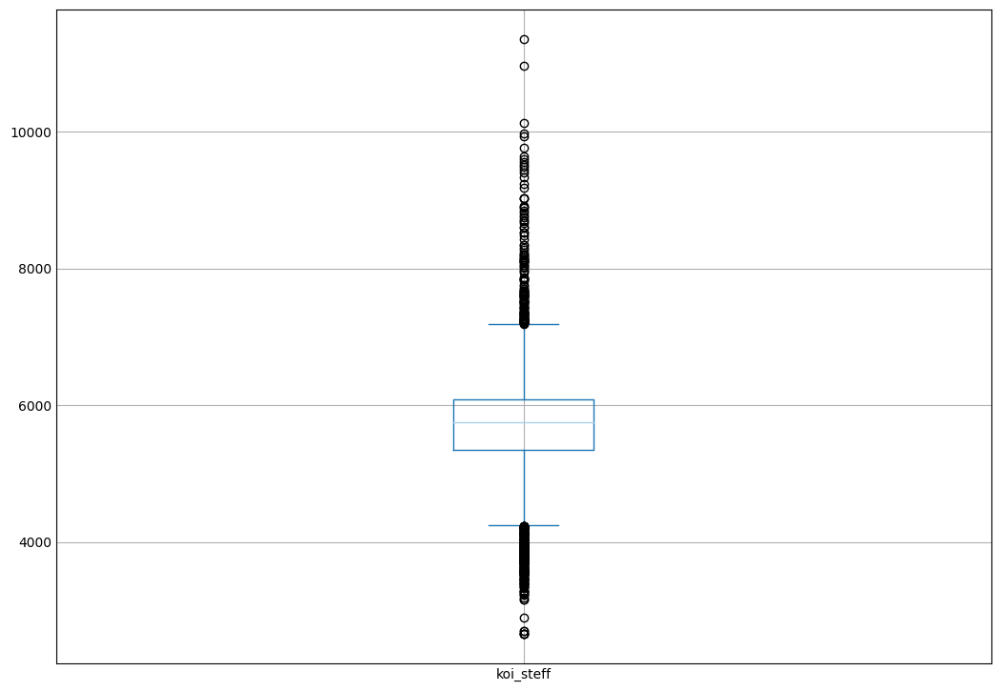

In [238]:
df_exoplanets['koi_steff'].plot(kind='box',figsize=(10,7))

In [239]:
#Criação de limiar para retiradas de outliers baseado nas imagens e dados
limiar_sup = df_exoplanets['koi_steff'].mean() + 2 * df_exoplanets['koi_steff'].std()
limiar_inf = df_exoplanets['koi_steff'].mean() - 2 * df_exoplanets['koi_steff'].std()
print(limiar_sup)
print(limiar_inf)
filtro = (df_exoplanets['koi_steff'] > limiar_sup) | (df_exoplanets['koi_steff'] < limiar_inf)
df_exoplanets[filtro].index
print(df_exoplanets['koi_steff'].count())
df_exoplanets.drop(df_exoplanets[filtro].index,inplace=True)
print(df_exoplanets['koi_steff'].count())

7147.304640542543
4238.923952757432
7229
6783


<AxesSubplot: >

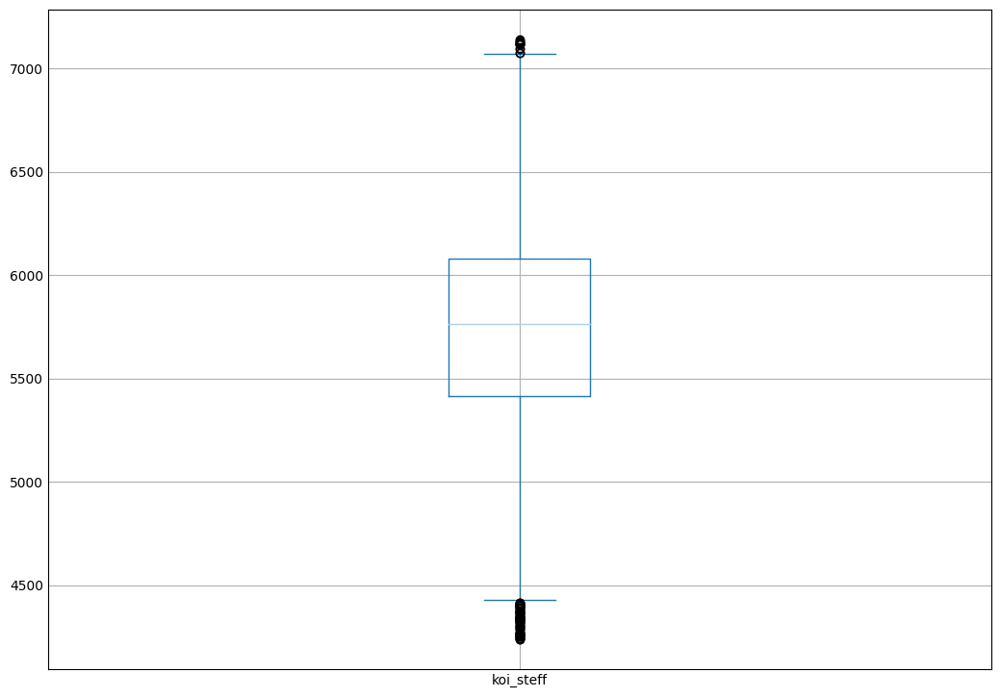

In [240]:
df_exoplanets['koi_steff'].plot(kind='box',figsize=(10,7))

##### Atributo koi_srad

<AxesSubplot: >

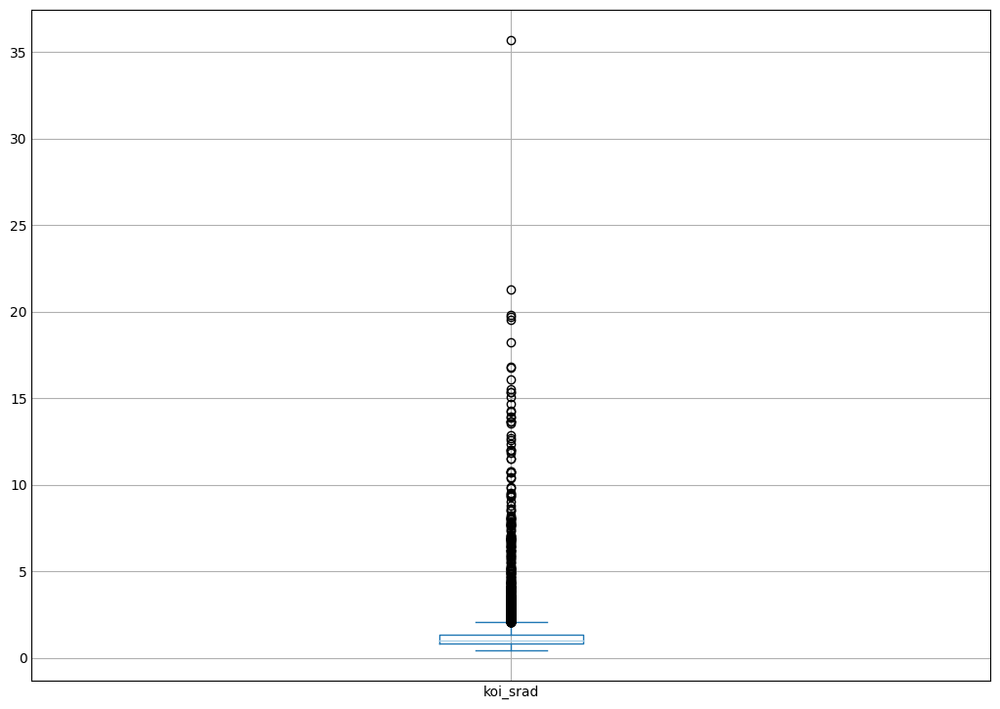

In [241]:
df_exoplanets['koi_srad'].plot(kind='box',figsize=(10,7))

In [242]:
#Criação de limiar para retiradas de outliers baseado nas imagens e dados
limiar_sup = df_exoplanets['koi_srad'].mean() + 2 * df_exoplanets['koi_srad'].std()
#limiar_inf = df_exoplanets['koi_prad'].mean() - 2 * df_exoplanets['koi_prad'].std()
#limiar_sup
filtro = df_exoplanets['koi_srad'] > limiar_sup
df_exoplanets[filtro].index
print(df_exoplanets['koi_srad'].count())
df_exoplanets.drop(df_exoplanets[filtro].index,inplace=True)
print(df_exoplanets['koi_srad'].count())

6783
6631


<AxesSubplot: >

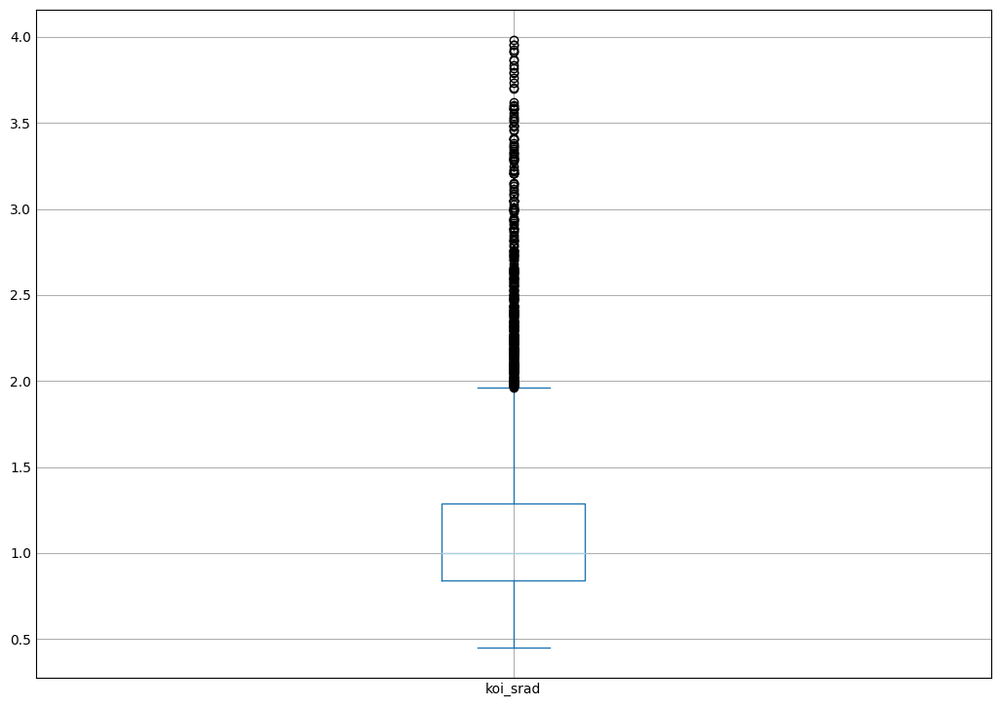

In [243]:
df_exoplanets['koi_srad'].plot(kind='box',figsize=(10,7))

array([[<AxesSubplot: xlabel='koi_steff', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_slogg', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_smet', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_srad', ylabel='koi_steff'>,
        <AxesSubplot: xlabel='koi_smass', ylabel='koi_steff'>],
       [<AxesSubplot: xlabel='koi_steff', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_slogg', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_smet', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_srad', ylabel='koi_slogg'>,
        <AxesSubplot: xlabel='koi_smass', ylabel='koi_slogg'>],
       [<AxesSubplot: xlabel='koi_steff', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_slogg', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_smet', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_srad', ylabel='koi_smet'>,
        <AxesSubplot: xlabel='koi_smass', ylabel='koi_smet'>],
       [<AxesSubplot: xlabel='koi_steff', ylabel='koi_srad'>,
 

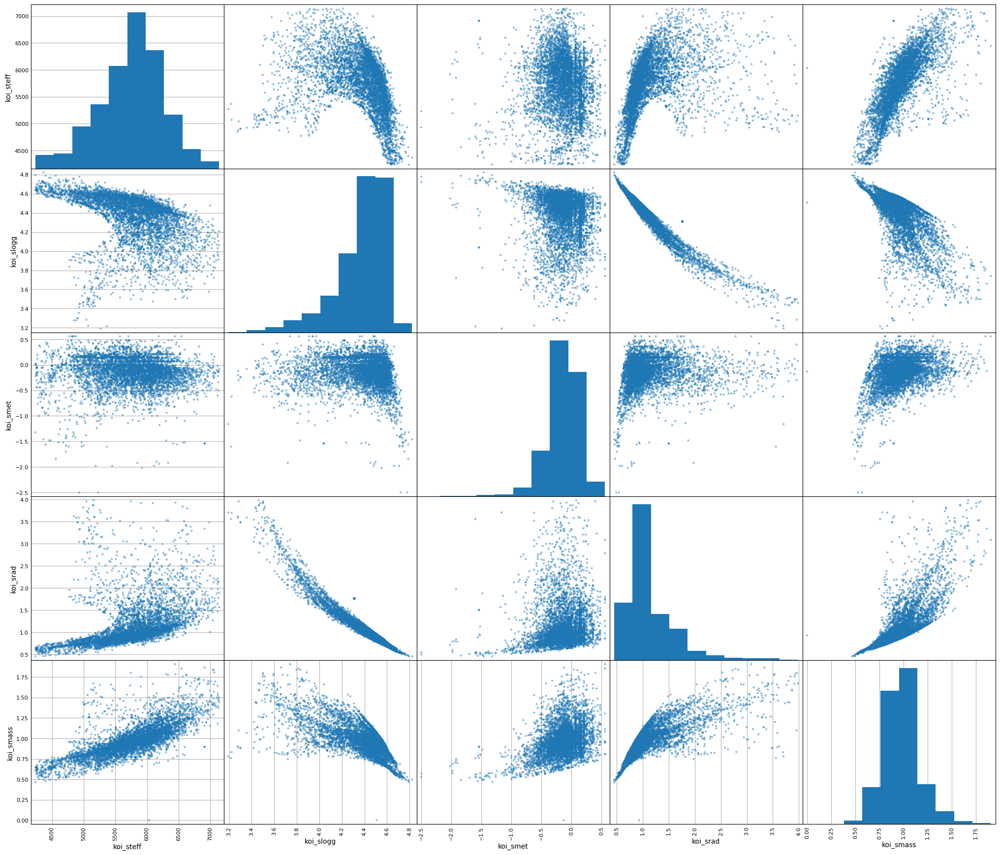

In [244]:
scatter_matrix(df_exoplanets[stellar_parameters[:]],figsize=(20,17))

### 4.6 Categoria -> kic_parameters

array([[<AxesSubplot: xlabel='ra', ylabel='ra'>,
        <AxesSubplot: xlabel='dec', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_kepmag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_gmag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_rmag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_imag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_zmag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_jmag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_hmag', ylabel='ra'>,
        <AxesSubplot: xlabel='koi_kmag', ylabel='ra'>],
       [<AxesSubplot: xlabel='ra', ylabel='dec'>,
        <AxesSubplot: xlabel='dec', ylabel='dec'>,
        <AxesSubplot: xlabel='koi_kepmag', ylabel='dec'>,
        <AxesSubplot: xlabel='koi_gmag', ylabel='dec'>,
        <AxesSubplot: xlabel='koi_rmag', ylabel='dec'>,
        <AxesSubplot: xlabel='koi_imag', ylabel='dec'>,
        <AxesSubplot: xlabel='koi_zmag', ylabel='dec'>,
        <AxesSubplot: xlabel='koi_jmag', ylabel='dec'>,
        <AxesSubplo

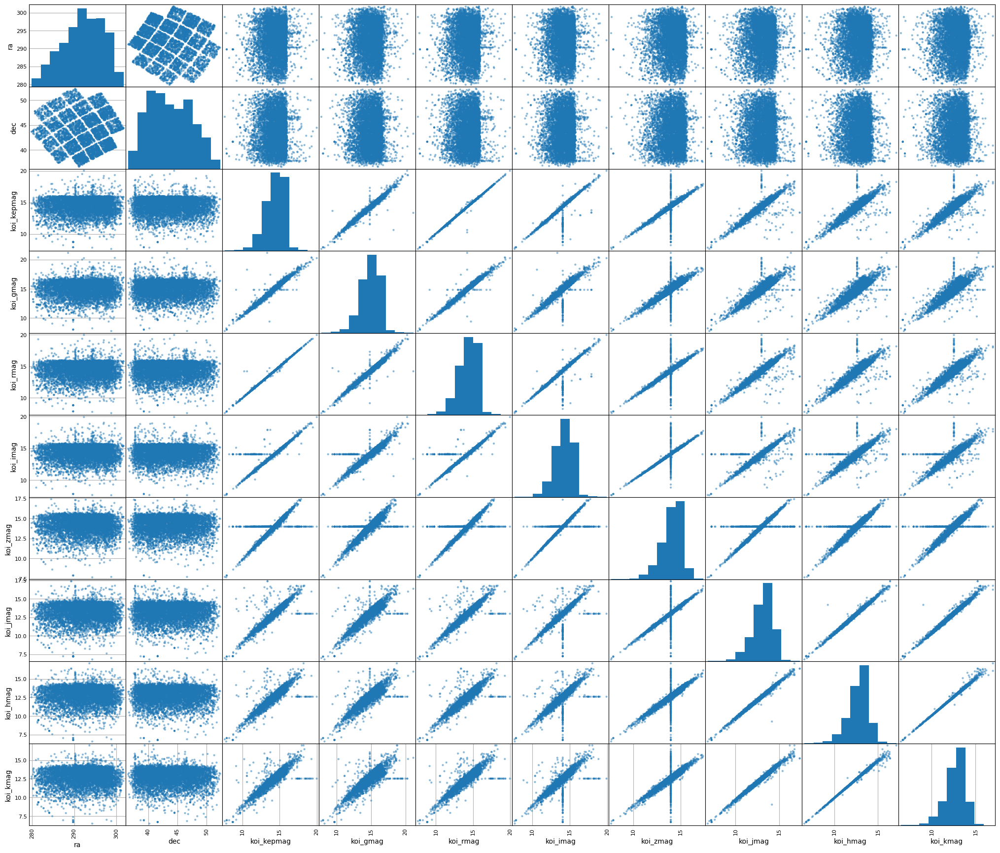

In [245]:
scatter_matrix(df_exoplanets[kic_parameters[:]],figsize=(20,17))

array([[<AxesSubplot: xlabel='ra', ylabel='ra'>,
        <AxesSubplot: xlabel='dec', ylabel='ra'>],
       [<AxesSubplot: xlabel='ra', ylabel='dec'>,
        <AxesSubplot: xlabel='dec', ylabel='dec'>]], dtype=object)

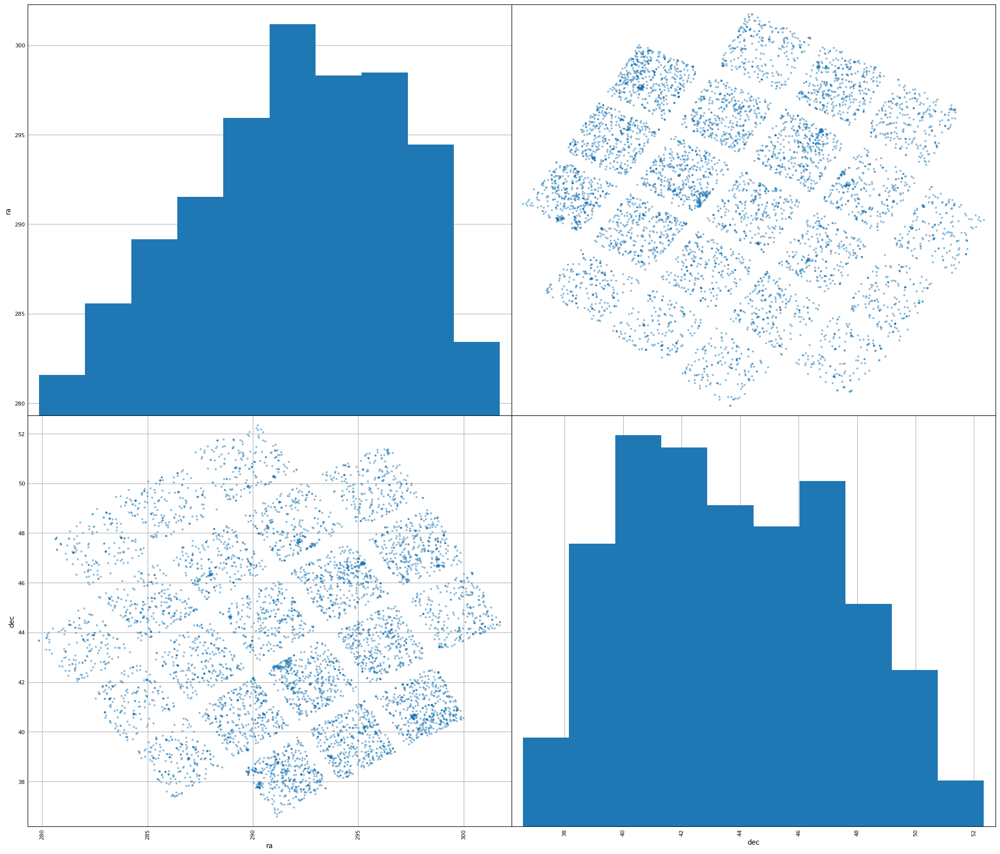

In [246]:
scatter_matrix(df_exoplanets[kic_parameters[:2]],figsize=(20,17))

### 4.7 Análises Extras

In [247]:
corr_matrix = df_exoplanets.corr()

C:\Users\diogo.silveira\AppData\Local\Temp\ipykernel_8148\1308473588.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_exoplanets.corr()


In [248]:
corr_matrix

,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
koi_fpflag_nt,1.000000,-0.298775,-0.043992,0.025678,0.478793,0.023480,0.274475,-0.055607,0.026882,0.172281,0.052392,0.447639,-0.117859,-0.099503,0.095794,-0.105642,-0.038115,-0.051227,-0.092082,-0.132373,0.114840,0.088085,-0.057834,-0.111692,0.129200,0.070310,-0.002551,-0.060343,-0.050777,-0.056148,-0.049314,-0.048181,-0.036193,-0.040075,-0.036503,-0.035994
koi_fpflag_ss,-0.298775,1.000000,0.086478,0.042931,-0.148238,0.118089,0.002541,0.416394,0.105829,-0.053575,0.129981,-0.151339,-0.158310,0.183653,0.135675,-0.149303,0.324668,0.348036,0.421703,-0.256652,0.054778,0.109823,-0.040269,-0.225685,0.022548,0.007298,0.080856,-0.046727,0.049400,0.044020,0.051873,0.049618,0.022814,0.044996,0.047642,0.045406
koi_fpflag_co,-0.043992,0.086478,1.000000,0.510920,-0.161246,0.030535,-0.047255,-0.173320,-0.026920,-0.039706,-0.043705,-0.193523,-0.310327,0.305433,0.056099,-0.061834,-0.142432,-0.148345,-0.175337,-0.212299,0.321426,0.037589,0.076602,-0.096771,-0.069380,-0.017962,0.187054,-0.093278,0.103118,0.103978,0.102227,0.099041,0.106144,0.122090,0.121169,0.120888
koi_fpflag_ec,0.025678,0.042931,0.510920,1.000000,-0.140532,0.007786,0.024657,-0.120086,-0.030454,-0.051633,-0.042396,-0.170512,-0.288334,0.271250,0.035349,-0.038415,-0.096589,-0.106059,-0.127678,-0.155616,0.297886,0.018020,0.062795,-0.078240,-0.060653,-0.027359,0.076830,-0.039329,0.068730,0.071826,0.070642,0.068307,0.072485,0.081871,0.081525,0.081476
koi_period,0.478793,-0.148238,-0.161246,-0.140532,1.000000,0.011032,0.318996,-0.054340,0.031091,0.166619,0.030894,0.950384,0.202522,-0.487760,0.045782,-0.048492,0.004758,-0.044668,-0.061489,-0.064240,-0.194941,0.037415,-0.039575,-0.035880,0.058629,0.028951,-0.070361,-0.001858,-0.039568,-0.042553,-0.040565,-0.046347,-0.030541,-0.032456,-0.032331,-0.030945
koi_impact,0.023480,0.118089,0.030535,0.007786,0.011032,1.000000,0.034637,0.019850,0.970371,0.075961,0.946801,0.007490,-0.163444,0.007907,0.036579,-0.039488,0.003609,0.008286,0.015240,-0.054098,-0.012658,0.025132,0.011823,-0.063462,-0.003002,-0.002385,0.028227,-0.024027,0.032541,0.029241,0.032968,0.034587,0.027233,0.037215,0.037146,0.036366
koi_duration,0.274475,0.002541,-0.047255,0.024657,0.318996,0.034637,1.000000,0.063168,0.020631,-0.069714,0.037704,0.352827,-0.197753,-0.266286,0.108124,-0.113482,0.081292,0.035933,0.068355,-0.061053,-0.236321,0.104396,-0.138596,-0.063443,0.137270,0.110233,0.035001,-0.028302,-0.071728,-0.076990,-0.071431,-0.068348,-0.059336,-0.059874,-0.056248,-0.055471
koi_depth,-0.055607,0.416394,-0.173320,-0.120086,-0.054340,0.019850,0.063168,1.000000,0.122097,0.024629,0.157651,-0.060062,0.059628,0.067985,0.076648,-0.089271,0.653752,0.646467,0.573197,-0.144598,-0.084417,0.068583,-0.038303,-0.163710,0.026368,-0.007981,0.022294,-0.023363,0.051072,0.044288,0.053087,0.053914,0.004560,0.026841,0.026323,0.023353
koi_ror,0.026882,0.105829,-0.026920,-0.030454,0.031091,0.970371,0.020631,0.122097,1.000000,0.092410,0.975954,0.028546,-0.045237,-0.014574,0.021196,-0.023038,0.074088,0.078126,0.076102,-0.049494,-0.028352,0.009550,0.016395,-0.056480,-0.010633,-0.015241,0.017345,-0.019461,0.040825,0.037551,0.041124,0.043225,0.031081,0.039917,0.039044,0.038102
koi_srho,0.172281,-0.053575,-0.039706,-0.051633,0.166619,0.075961,-0.069714,0.024629,0.092410,1.000000,0.072497,0.179020,0.062926,-0.099504,0.012787,-0.015344,0.020342,-0.003294,-0.032225,-0.032354,0.002826,0.009424,0.011479,-0.032038,-0.001215,0.001672,-0.001599,-0.006762,0.001591,0.001414,0.001398,-0.002140,0.001169,-0.000238,0.000158,-0.000542


In [249]:
corr_matrix[(corr_matrix > 0.8) | (corr_matrix < -0.8)]

,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_impact,koi_duration,koi_depth,koi_ror,koi_srho,koi_prad,koi_sma,koi_incl,koi_teq,koi_ldm_coeff2,koi_ldm_coeff1,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_steff,koi_slogg,koi_smet,koi_srad,koi_smass,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag
koi_fpflag_nt,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_fpflag_ss,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_fpflag_co,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_fpflag_ec,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_period,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.950384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_impact,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.970371,NaN,0.946801,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_duration,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_depth,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_ror,NaN,NaN,NaN,NaN,NaN,0.970371,NaN,NaN,1.000000,NaN,0.975954,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
koi_srho,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [250]:
# scatter_matrix(df_exoplanets[atributos],figsize=(20,17))

# 5. Preparação dos Dados para os Modelos de Aprendizado

### Importação de Bibliotecas e definição de funções

In [251]:
from numpy import array
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif
from sklearn.utils import column_or_1d
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

X = df_exoplanets[features]
y = df_exoplanets[exoplanet_archive_information]
#y = column_or_1d(y.values.ravel(), warn=True)

### Cenário 1

In [252]:
# Cenário 1
# - Seleção dos atributos através do fator f
# - Manter Registros inalterados
# - Divisao da bases de treino em teste e treino

y_1 = column_or_1d(y.values.ravel(), warn=True)

select_1 = SelectKBest(f_classif,k=19)
X_new_1 = select_1.fit(X,y_1)
filter = X_new_1.get_support()

best_features_1 = array(df_exoplanets.columns)
best_features_1 = best_features_1[1:]
best_features_1 = best_features_1[filter]

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(df_exoplanets[best_features_1], y, test_size=0.25, random_state=0)

### Cenário 2

In [253]:
# Cenário 2
# - Utilização de função de padronização de valores dos valores
# - Divisao da bases de treino em teste e treino

scaler_2 = RobustScaler()
scaler_2.fit(X)
X_2_scaled = scaler_2.transform(X)
X_2 = pd.DataFrame(X_2_scaled, columns=X.columns)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y, test_size=0.25, random_state=0)


### Cenário 3

In [254]:
# Cenário 3
# - Utilização de função de normalização dos valores
# - Seleção dos atributos através do fator chi2
# - Divisao da bases de treino em teste e treino

scaler_3 = MinMaxScaler()
scaler_3.fit(X)
X_3 = scaler_3.transform(X)

select_3 = SelectKBest(chi2,k=19)
X_new_3 = select_3.fit(X_3,y)
filter = X_new_3.get_support()

best_features_3 = array(df_exoplanets.columns)
best_features_3 = best_features_3[1:]
best_features_3 = best_features_3[filter]
#print(best_features_3)

X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(df_exoplanets[best_features_3], y, test_size=0.25, random_state=0)

### Cenário 4

In [255]:
# Cenário 4
# - Divisao da bases de treino em teste e treino sem modificações com tamanho no teste superior (40%)

X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(X, y, test_size=0.40, random_state=0)

# 6. Implementação dos modelos de Machine Learning

### Importação de Bibliotecas e definição de funções

In [256]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.metrics import confusion_matrix

In [257]:
def plot_feature_importances_exoplanet_c1(model):
    n_features = X_train_1.shape[1]
    plt.figure(figsize=(15,10))
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X_train_1.columns)
    plt.xlabel("Feature importance",fontdict = {'fontsize' : 14})
    plt.ylabel("Feature",fontdict = {'fontsize' : 14})

In [258]:
def plot_feature_importances_exoplanet_c2(model):
    n_features = X_train_2.shape[1]
    plt.figure(figsize=(15,10))
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X_train_2.columns)
    plt.xlabel("Feature importance",fontdict = {'fontsize' : 14})
    plt.ylabel("Feature",fontdict = {'fontsize' : 14})

In [259]:
def plot_feature_importances_exoplanet_c3(model):
    n_features = X_train_3.shape[1]
    plt.figure(figsize=(15,10))
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X_train_3.columns)
    plt.xlabel("Feature importance",fontdict = {'fontsize' : 14})
    plt.ylabel("Feature",fontdict = {'fontsize' : 14})

In [260]:
def plot_feature_importances_exoplanet_c4(model):
    n_features = X_train_4.shape[1]
    plt.figure(figsize=(15,10))
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X_train_4.columns)
    plt.xlabel("Feature importance",fontdict = {'fontsize' : 14})
    plt.ylabel("Feature",fontdict = {'fontsize' : 14})

### Cenário 1

In [261]:
model_DTC_vanilla = tree.DecisionTreeClassifier()
model_C1_1 = model_DTC_vanilla.fit(X_train_1,y_train_1)
y_pred_C1_1_DTC = model_C1_1.predict(X_test_1)

print("Accuracy on training set: {:.4f}".format(model_C1_1.score(X_train_1, y_train_1)))
print("Accuracy on test set: {:.4f}".format(model_C1_1.score(X_test_1, y_test_1)))
print(confusion_matrix(y_test_1, y_pred_C1_1_DTC))

Accuracy on training set: 1.0000
Accuracy on test set: 0.9922
[[ 621    9]
 [   4 1024]]


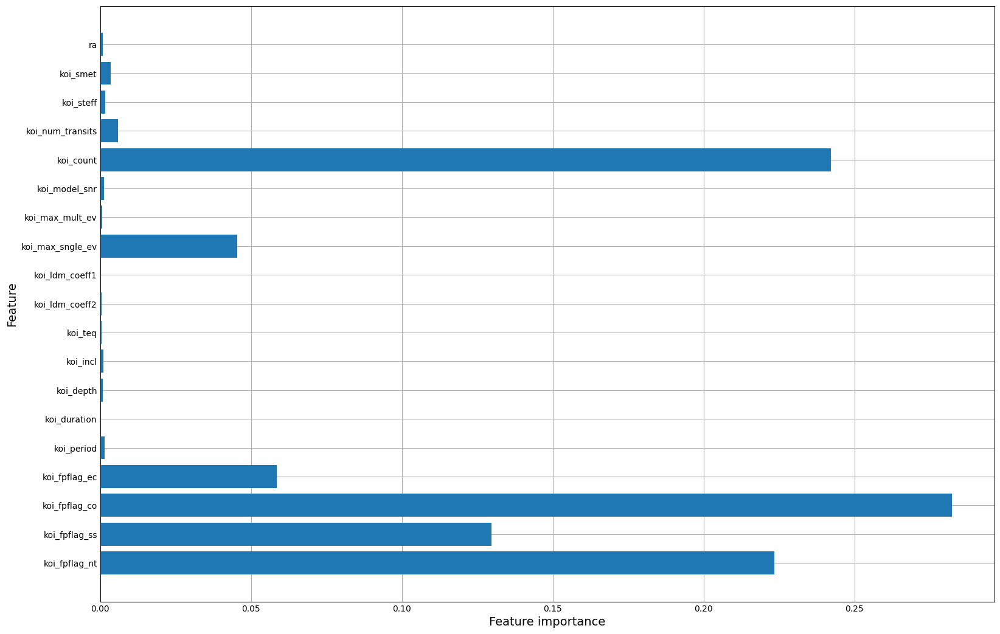

In [262]:
plot_feature_importances_exoplanet_c1(model_C1_1)

In [263]:
model_DTC = tree.DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=50)
model_C1_2 = model_DTC.fit(X_train_1,y_train_1)
y_pred_C1_2_DTC = model_C1_2.predict(X_test_1)

print("Accuracy on training set: {:.4f}".format(model_C1_2.score(X_train_1, y_train_1)))
print("Accuracy on test set: {:.4f}".format(model_C1_2.score(X_test_1, y_test_1)))
print(confusion_matrix(y_test_1, y_pred_C1_2_DTC))

Accuracy on training set: 0.8506
Accuracy on test set: 0.8359
[[627   3]
 [269 759]]


In [264]:
model_DTC = tree.DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=50)
model_C1_2 = model_DTC.fit(X_train_1,y_train_1)
y_pred_C1_2_DTC = model_C1_2.predict(X_test_1)

print("Accuracy on training set: {:.4f}".format(model_C1_2.score(X_train_1, y_train_1)))
print("Accuracy on test set: {:.4f}".format(model_C1_2.score(X_test_1, y_test_1)))
print(confusion_matrix(y_test_1, y_pred_C1_2_DTC))

Accuracy on training set: 0.9682
Accuracy on test set: 0.9674
[[627   3]
 [ 51 977]]


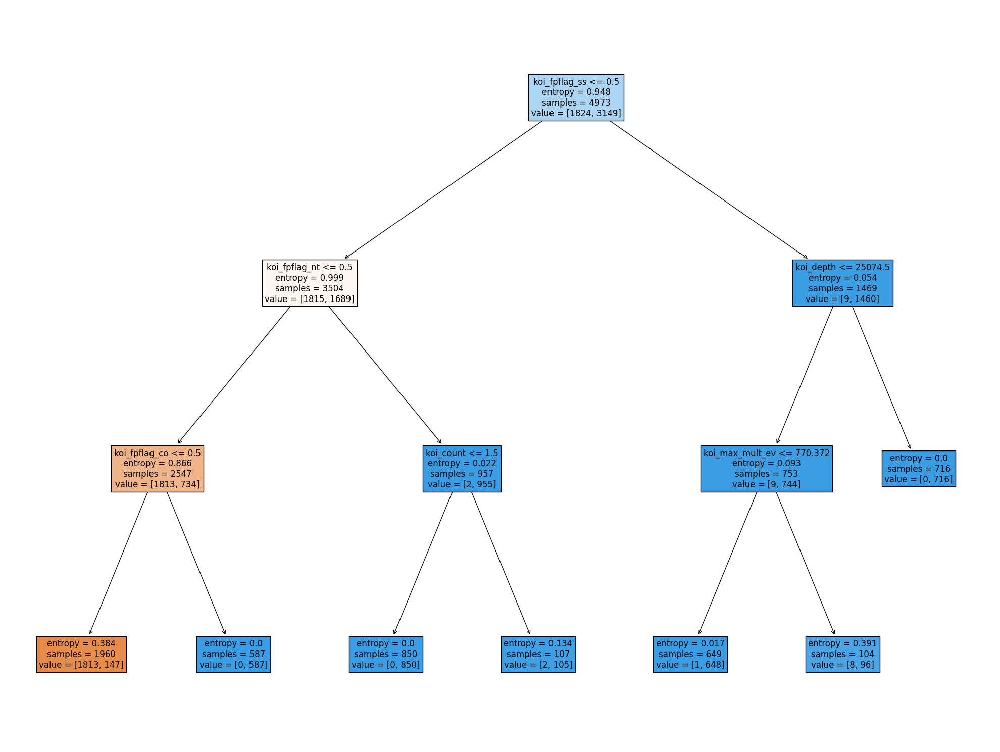

In [265]:
plt.figure(figsize=(20, 15))
tree.plot_tree(model_C1_2, filled=True,fontsize=12, feature_names=X_train_1.columns)
plt.show()

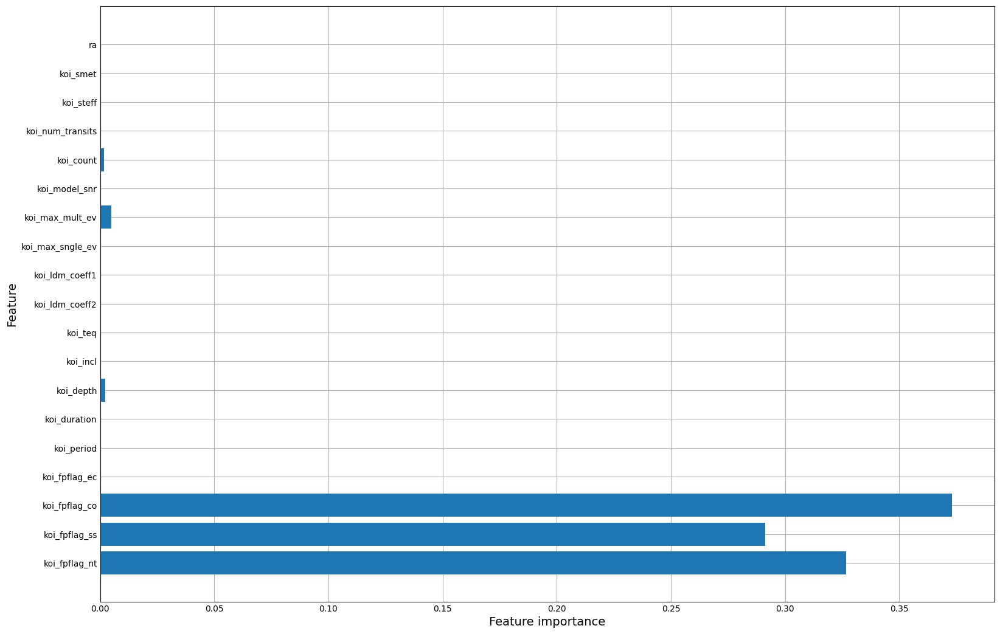

In [266]:
plot_feature_importances_exoplanet_c1(model_C1_2)

In [267]:
model_RFC_vanilla = RandomForestClassifier()
model_C1_3 = model_RFC_vanilla.fit(X_train_1,y_train_1.values.ravel())
y_pred_C1_3_RFC = model_C1_3.predict(X_test_1)

print("Accuracy on training set: {:.3f}".format(model_C1_3.score(X_train_1, y_train_1)))
print("Accuracy on test set: {:.3f}".format(model_C1_3.score(X_test_1, y_test_1)))
print(confusion_matrix(y_test_1, y_pred_C1_3_RFC))

Accuracy on training set: 1.000
Accuracy on test set: 0.996
[[ 624    6]
 [   0 1028]]


In [268]:
model_RFC_vanilla = RandomForestClassifier(criterion='gini', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C1_4 = model_RFC_vanilla.fit(X_train_1,y_train_1.values.ravel())
y_pred_C1_4_RFC = model_C1_4.predict(X_test_1)

print("Accuracy on training set: {:.4f}".format(model_C1_4.score(X_train_1, y_train_1)))
print("Accuracy on test set: {:.4f}".format(model_C1_4.score(X_test_1, y_test_1)))
print(confusion_matrix(y_test_1, y_pred_C1_4_RFC))

Accuracy on training set: 0.9775
Accuracy on test set: 0.9813
[[ 607   23]
 [   8 1020]]


In [269]:
model_RFC_vanilla = RandomForestClassifier(criterion='entropy', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C1_4 = model_RFC_vanilla.fit(X_train_1,y_train_1.values.ravel())
y_pred_C1_4_RFC = model_C1_4.predict(X_test_1)

print("Accuracy on training set: {:.4f}".format(model_C1_4.score(X_train_1, y_train_1)))
print("Accuracy on test set: {:.4f}".format(model_C1_4.score(X_test_1, y_test_1)))
print(confusion_matrix(y_test_1, y_pred_C1_4_RFC))

Accuracy on training set: 0.9865
Accuracy on test set: 0.9873
[[ 616   14]
 [   7 1021]]


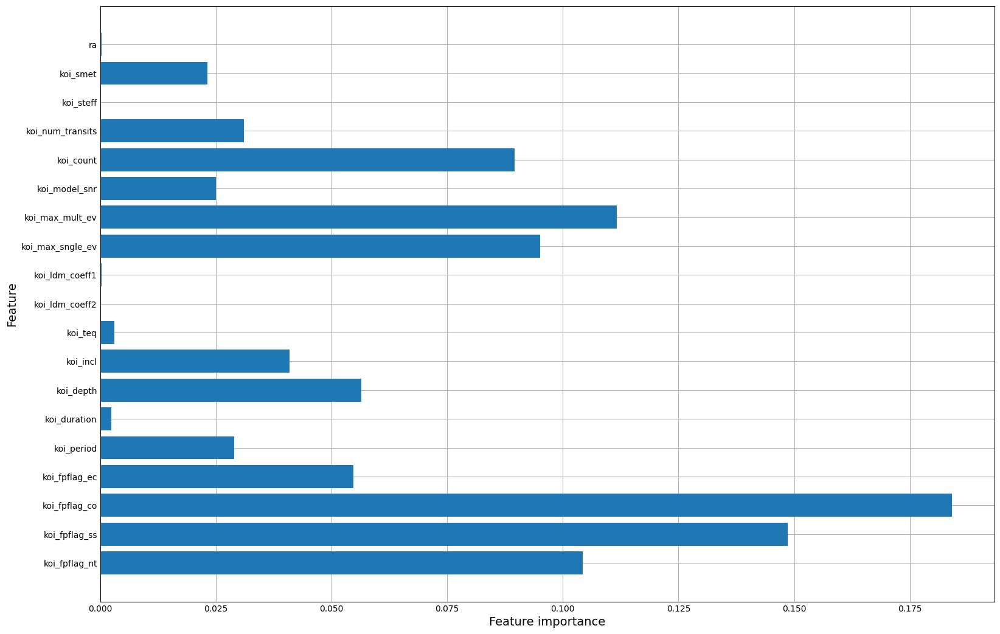

In [270]:
plot_feature_importances_exoplanet_c1(model_C1_4)

### Cenário 2

In [271]:
model_DTC_vanilla = tree.DecisionTreeClassifier()
model_C2_1 = model_DTC_vanilla.fit(X_train_2,y_train_2)
y_pred_C2_1_DTC = model_C2_1.predict(X_test_2)

print("Accuracy on training set: {:.4f}".format(model_C2_1.score(X_train_2, y_train_2)))
print("Accuracy on test set: {:.4f}".format(model_C2_1.score(X_test_2, y_test_2)))
print(confusion_matrix(y_test_2, y_pred_C2_1_DTC))

Accuracy on training set: 1.0000
Accuracy on test set: 0.9940
[[ 625    5]
 [   5 1023]]


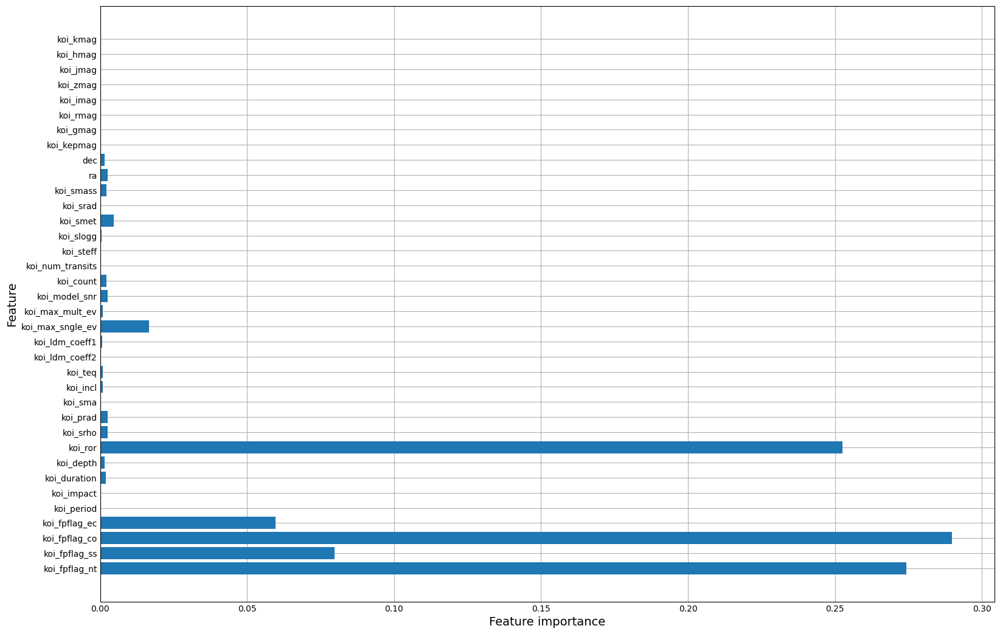

In [272]:
plot_feature_importances_exoplanet_c2(model_C2_1)

In [273]:
model_DTC = tree.DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=50)
model_C2_2 = model_DTC.fit(X_train_2,y_train_2)
y_pred_C2_2_DTC = model_C2_2.predict(X_test_2)

print("Accuracy on training set: {:.4f}".format(model_C2_2.score(X_train_2, y_train_2)))
print("Accuracy on test set: {:.4f}".format(model_C2_2.score(X_test_2, y_test_2)))
print(confusion_matrix(y_test_2, y_pred_C2_2_DTC))

Accuracy on training set: 0.9523
Accuracy on test set: 0.9505
[[623   7]
 [ 75 953]]


In [274]:
model_DTC = tree.DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=50)
model_C2_2 = model_DTC.fit(X_train_2,y_train_2)
y_pred_C2_2_DTC = model_C2_2.predict(X_test_2)

print("Accuracy on training set: {:.4f}".format(model_C2_2.score(X_train_2, y_train_2)))
print("Accuracy on test set: {:.4f}".format(model_C2_2.score(X_test_2, y_test_2)))
print(confusion_matrix(y_test_2, y_pred_C2_2_DTC))

Accuracy on training set: 0.9511
Accuracy on test set: 0.9511
[[627   3]
 [ 78 950]]


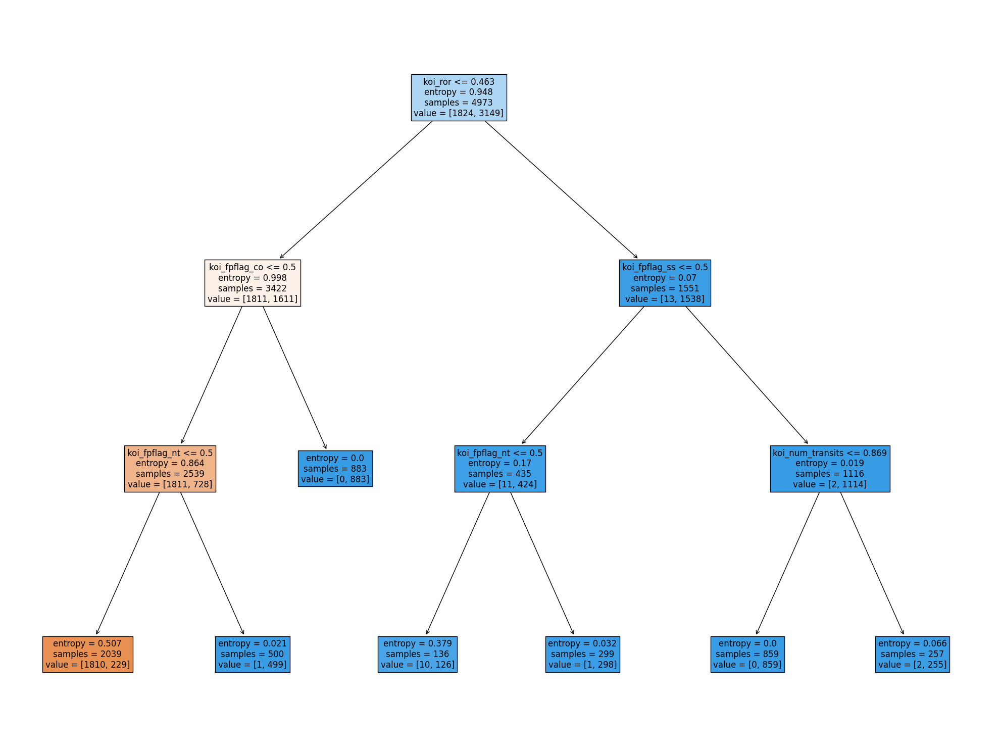

In [275]:
plt.figure(figsize=(20, 15))
tree.plot_tree(model_C2_2, filled=True,fontsize=12, feature_names=X_train_2.columns)
plt.show()

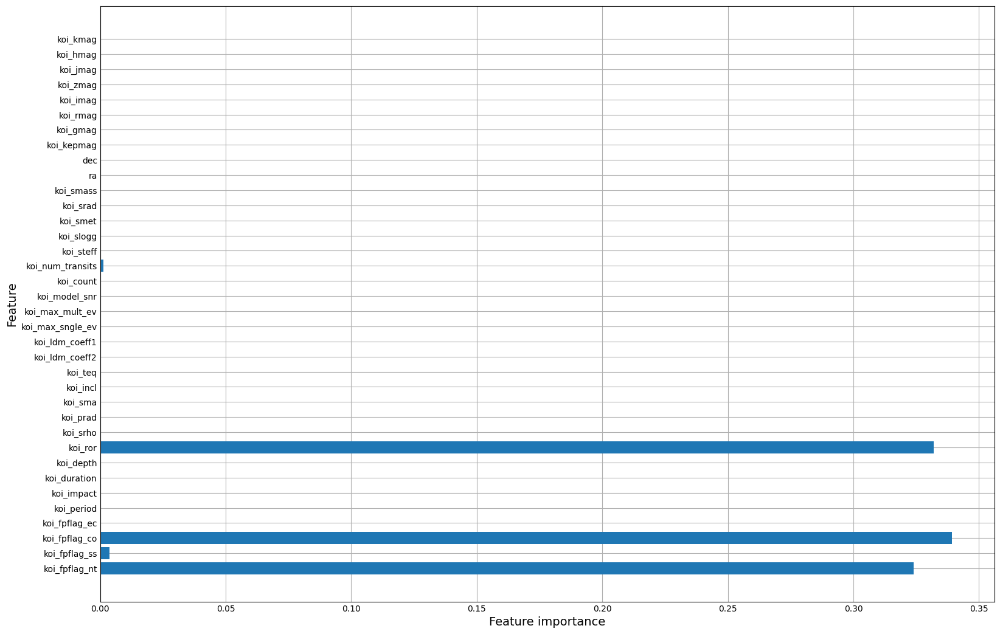

In [276]:
plot_feature_importances_exoplanet_c2(model_C2_2)

In [277]:
model_RFC_vanilla = RandomForestClassifier()
model_C2_3 = model_RFC_vanilla.fit(X_train_2,y_train_2.values.ravel())
y_pred_C2_3_RFC = model_C2_3.predict(X_test_2)

print("Accuracy on training set: {:.3f}".format(model_C2_3.score(X_train_2, y_train_2)))
print("Accuracy on test set: {:.3f}".format(model_C2_3.score(X_test_2, y_test_2)))
print(confusion_matrix(y_test_2, y_pred_C2_3_RFC))

Accuracy on training set: 1.000
Accuracy on test set: 0.995
[[ 623    7]
 [   1 1027]]


In [278]:
model_RFC_vanilla = RandomForestClassifier(criterion='gini', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C2_4 = model_RFC_vanilla.fit(X_train_2,y_train_2.values.ravel())
y_pred_C2_4_RFC = model_C2_4.predict(X_test_2)

print("Accuracy on training set: {:.4f}".format(model_C2_4.score(X_train_2, y_train_2)))
print("Accuracy on test set: {:.4f}".format(model_C2_4.score(X_test_2, y_test_2)))
print(confusion_matrix(y_test_2, y_pred_C2_4_RFC))

Accuracy on training set: 0.9823
Accuracy on test set: 0.9807
[[ 611   19]
 [  13 1015]]


In [279]:
model_RFC_vanilla = RandomForestClassifier(criterion='entropy', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C2_4 = model_RFC_vanilla.fit(X_train_2,y_train_2.values.ravel())
y_pred_C2_4_RFC = model_C2_4.predict(X_test_2)

print("Accuracy on training set: {:.4f}".format(model_C2_4.score(X_train_2, y_train_2)))
print("Accuracy on test set: {:.4f}".format(model_C2_4.score(X_test_2, y_test_2)))
print(confusion_matrix(y_test_2, y_pred_C2_4_RFC))

Accuracy on training set: 0.9845
Accuracy on test set: 0.9807
[[ 620   10]
 [  22 1006]]


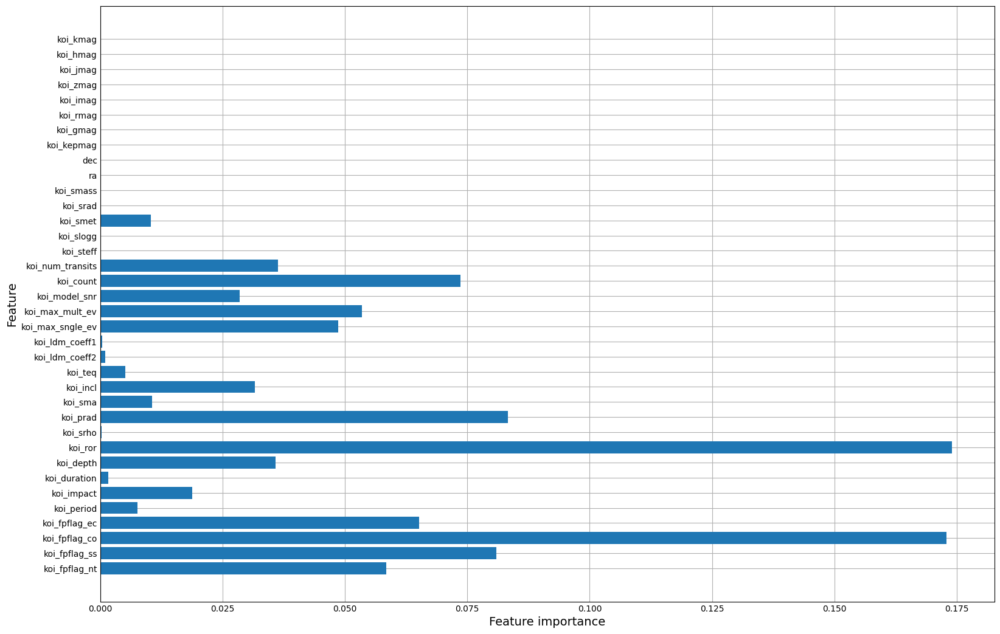

In [280]:
plot_feature_importances_exoplanet_c2(model_C2_4)

### Cenário 3

In [281]:
model_DTC_vanilla = tree.DecisionTreeClassifier()
model_C3_1 = model_DTC_vanilla.fit(X_train_3,y_train_3)
y_pred_C3_1_DTC = model_C3_1.predict(X_test_3)

print("Accuracy on training set: {:.4f}".format(model_C3_1.score(X_train_3, y_train_3)))
print("Accuracy on test set: {:.4f}".format(model_C3_1.score(X_test_3, y_test_3)))
print(confusion_matrix(y_test_3, y_pred_C3_1_DTC))

Accuracy on training set: 1.0000
Accuracy on test set: 0.9970
[[ 627    3]
 [   2 1026]]


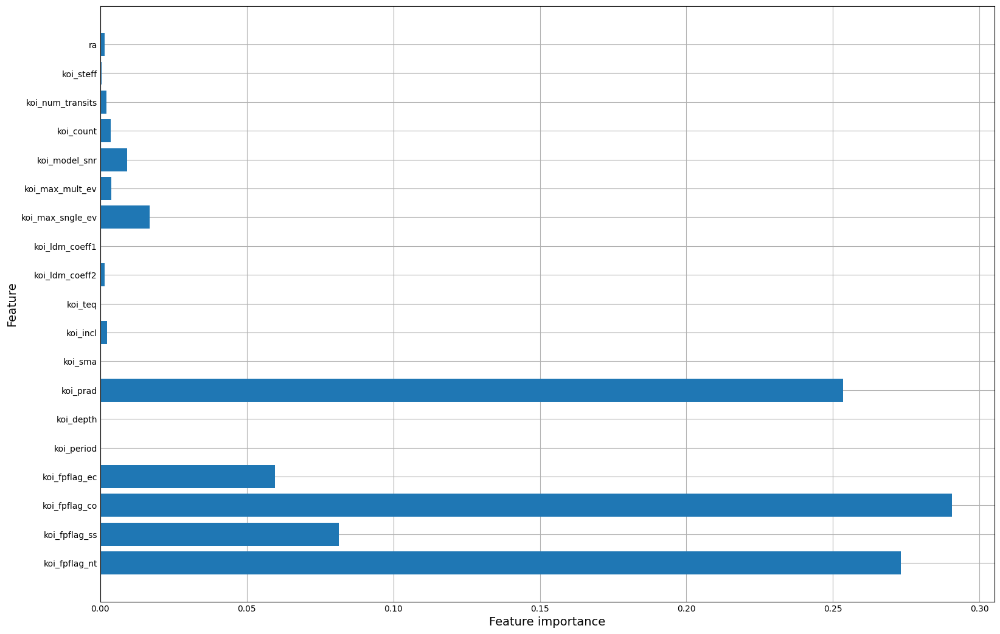

In [282]:
plot_feature_importances_exoplanet_c3(model_C3_1)

In [283]:
model_DTC = tree.DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=50)
model_C3_2 = model_DTC.fit(X_train_3,y_train_3)
y_pred_C3_2_DTC = model_C3_2.predict(X_test_3)

print("Accuracy on training set: {:.4f}".format(model_C3_2.score(X_train_3, y_train_3)))
print("Accuracy on test set: {:.4f}".format(model_C3_2.score(X_test_3, y_test_3)))
print(confusion_matrix(y_test_3, y_pred_C3_2_DTC))

Accuracy on training set: 0.9523
Accuracy on test set: 0.9530
[[625   5]
 [ 73 955]]


In [284]:
model_DTC = tree.DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=50)
model_C3_2 = model_DTC.fit(X_train_3,y_train_3)
y_pred_C3_2_DTC = model_C3_2.predict(X_test_3)

print("Accuracy on training set: {:.4f}".format(model_C3_2.score(X_train_3, y_train_3)))
print("Accuracy on test set: {:.4f}".format(model_C3_2.score(X_test_3, y_test_3)))
print(confusion_matrix(y_test_3, y_pred_C3_2_DTC))

Accuracy on training set: 0.9517
Accuracy on test set: 0.9524
[[625   5]
 [ 74 954]]


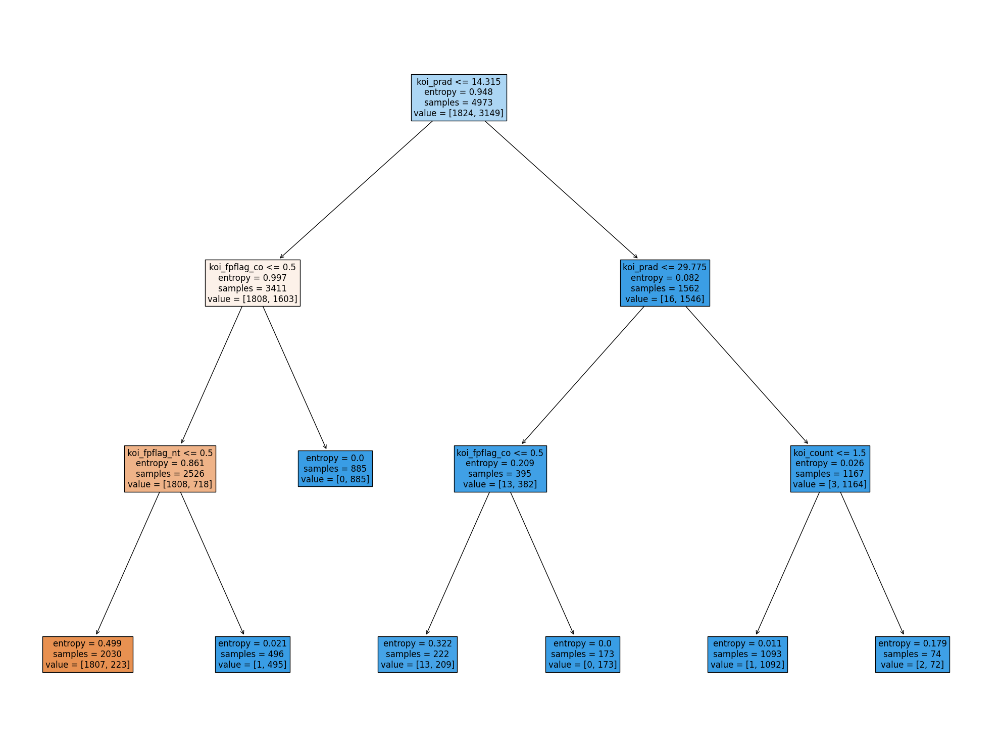

In [285]:
plt.figure(figsize=(20, 15))
tree.plot_tree(model_C3_2, filled=True,fontsize=12, feature_names=X_train_3.columns)
plt.show()

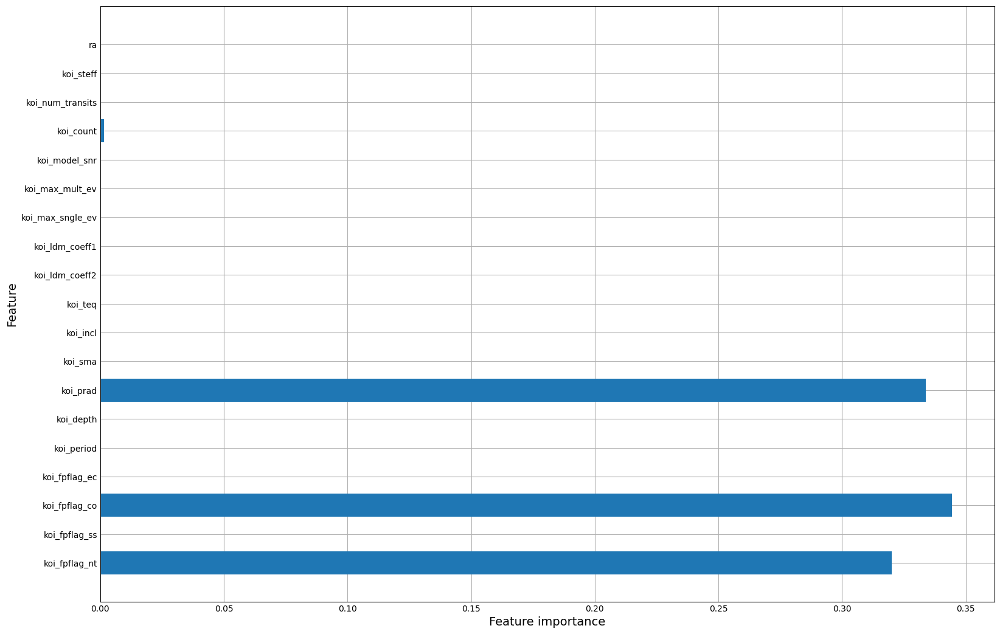

In [286]:
plot_feature_importances_exoplanet_c3(model_C3_2)

In [287]:
model_RFC_vanilla = RandomForestClassifier()
model_C3_3 = model_RFC_vanilla.fit(X_train_3,y_train_3.values.ravel())
y_pred_C3_3_RFC = model_C3_3.predict(X_test_3)

print("Accuracy on training set: {:.3f}".format(model_C3_3.score(X_train_3, y_train_3)))
print("Accuracy on test set: {:.3f}".format(model_C3_3.score(X_test_3, y_test_3)))
print(confusion_matrix(y_test_3, y_pred_C3_3_RFC))

Accuracy on training set: 1.000
Accuracy on test set: 0.995
[[ 623    7]
 [   1 1027]]


In [288]:
model_RFC_vanilla = RandomForestClassifier(criterion='gini', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C3_4 = model_RFC_vanilla.fit(X_train_3,y_train_3.values.ravel())
y_pred_C3_4_RFC = model_C3_4.predict(X_test_3)

print("Accuracy on training set: {:.4f}".format(model_C3_4.score(X_train_3, y_train_3)))
print("Accuracy on test set: {:.4f}".format(model_C3_4.score(X_test_3, y_test_3)))
print(confusion_matrix(y_test_3, y_pred_C3_4_RFC))

Accuracy on training set: 0.9781
Accuracy on test set: 0.9801
[[ 611   19]
 [  14 1014]]


In [289]:
model_RFC_vanilla = RandomForestClassifier(criterion='entropy', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C3_4 = model_RFC_vanilla.fit(X_train_3,y_train_3.values.ravel())
y_pred_C3_4_RFC = model_C3_4.predict(X_test_3)

print("Accuracy on training set: {:.4f}".format(model_C3_4.score(X_train_3, y_train_3)))
print("Accuracy on test set: {:.4f}".format(model_C3_4.score(X_test_3, y_test_3)))
print(confusion_matrix(y_test_3, y_pred_C3_4_RFC))

Accuracy on training set: 0.9871
Accuracy on test set: 0.9885
[[ 619   11]
 [   8 1020]]


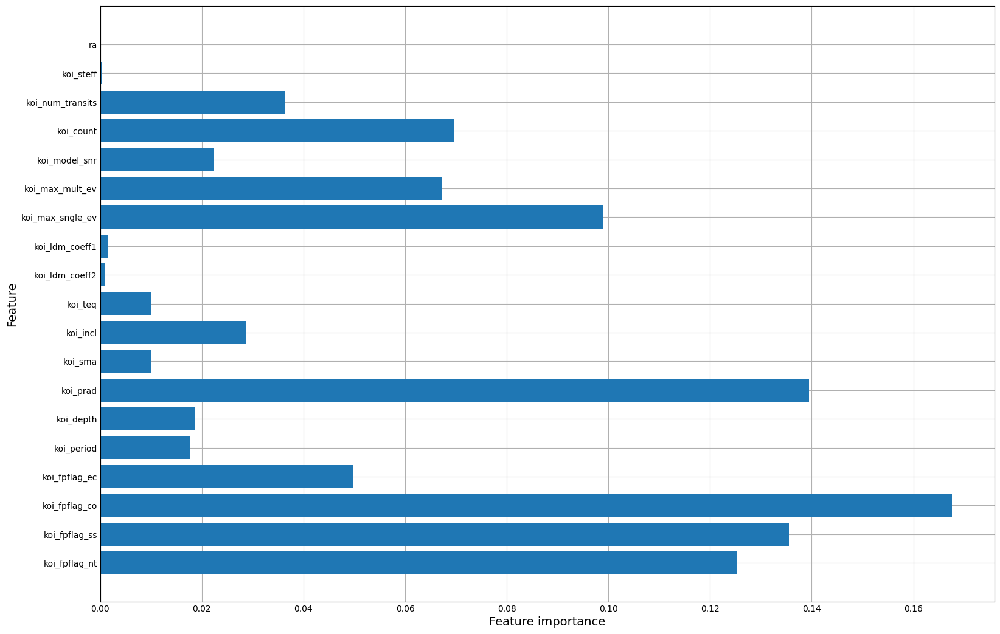

In [290]:
plot_feature_importances_exoplanet_c3(model_C3_4)

### Cenário 4

In [291]:
model_DTC_vanilla = tree.DecisionTreeClassifier()
model_C4_1 = model_DTC_vanilla.fit(X_train_4,y_train_4)
y_pred_C4_1_DTC = model_C4_1.predict(X_test_4)

print("Accuracy on training set: {:.4f}".format(model_C4_1.score(X_train_4, y_train_4)))
print("Accuracy on test set: {:.4f}".format(model_C4_1.score(X_test_4, y_test_4)))
print(confusion_matrix(y_test_4, y_pred_C4_1_DTC))

Accuracy on training set: 1.0000
Accuracy on test set: 0.9932
[[ 991    8]
 [  10 1644]]


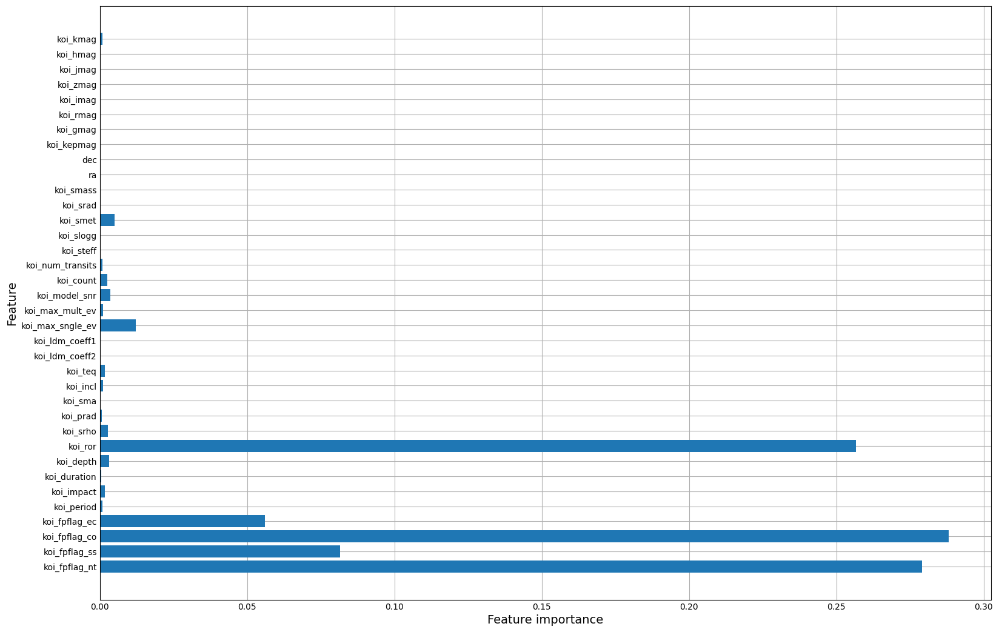

In [292]:
plot_feature_importances_exoplanet_c4(model_C4_1)

In [293]:
model_DTC = tree.DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=50)
model_C4_2 = model_DTC.fit(X_train_4,y_train_4)
y_pred_C4_2_DTC = model_C4_2.predict(X_test_4)

print("Accuracy on training set: {:.4f}".format(model_C4_2.score(X_train_4, y_train_4)))
print("Accuracy on test set: {:.4f}".format(model_C4_2.score(X_test_4, y_test_4)))
print(confusion_matrix(y_test_4, y_pred_C4_2_DTC))

Accuracy on training set: 0.9540
Accuracy on test set: 0.9484
[[ 989   10]
 [ 127 1527]]


In [294]:
model_DTC = tree.DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=50)
model_C4_2 = model_DTC.fit(X_train_4,y_train_4)
y_pred_C4_2_DTC = model_C4_2.predict(X_test_4)

print("Accuracy on training set: {:.4f}".format(model_C4_2.score(X_train_4, y_train_4)))
print("Accuracy on test set: {:.4f}".format(model_C4_2.score(X_test_4, y_test_4)))
print(confusion_matrix(y_test_4, y_pred_C4_2_DTC))

Accuracy on training set: 0.9527
Accuracy on test set: 0.9487
[[ 992    7]
 [ 129 1525]]


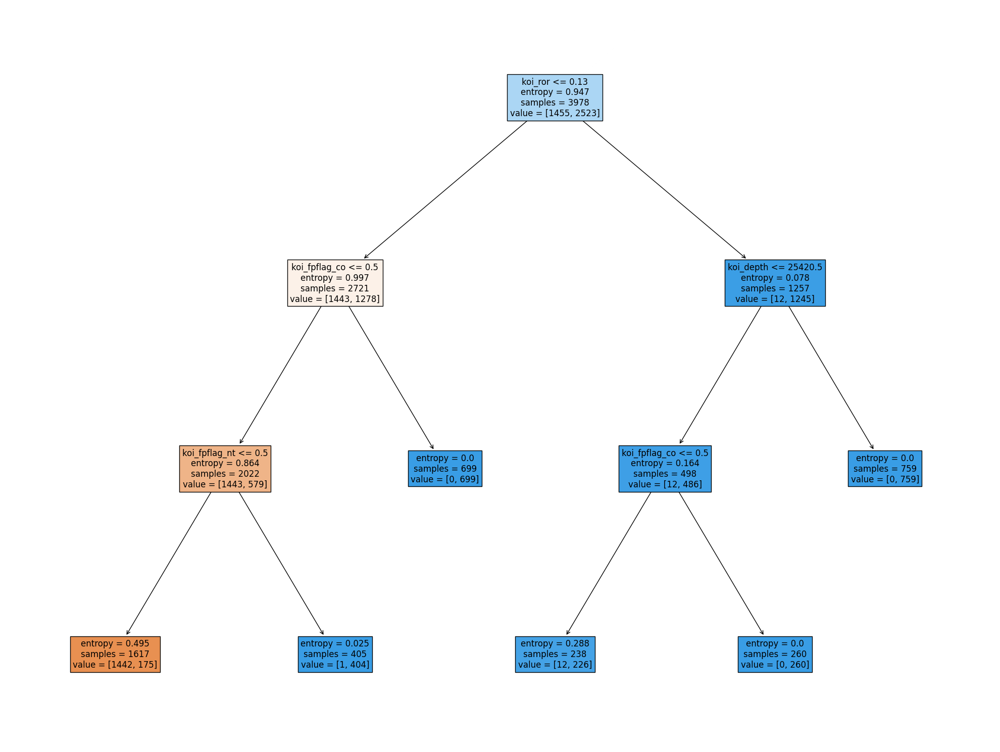

In [295]:
plt.figure(figsize=(20, 15))
tree.plot_tree(model_C4_2, filled=True,fontsize=12, feature_names=X_train_4.columns)
plt.show()

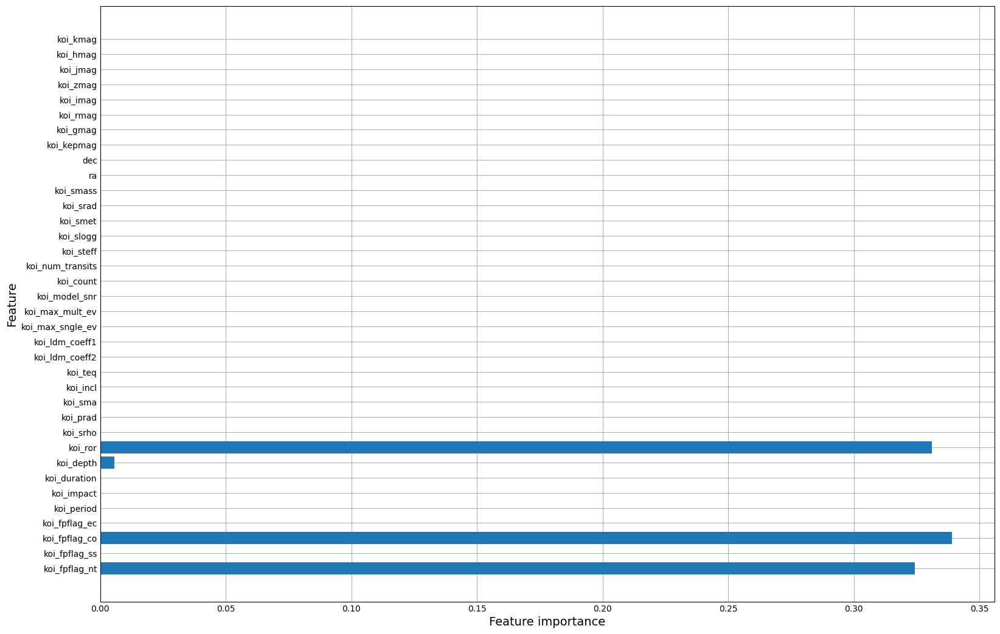

In [296]:
plot_feature_importances_exoplanet_c4(model_C4_2)

In [297]:
model_RFC_vanilla = RandomForestClassifier()
model_C4_3 = model_RFC_vanilla.fit(X_train_4,y_train_4.values.ravel())
y_pred_C4_3_RFC = model_C4_3.predict(X_test_4)

print("Accuracy on training set: {:.4f}".format(model_C4_3.score(X_train_4, y_train_4)))
print("Accuracy on test set: {:.4f}".format(model_C4_3.score(X_test_4, y_test_4)))
print(confusion_matrix(y_test_4, y_pred_C4_3_RFC))

Accuracy on training set: 1.0000
Accuracy on test set: 0.9962
[[ 990    9]
 [   1 1653]]


In [298]:
model_RFC_vanilla = RandomForestClassifier(criterion='gini', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C4_4 = model_RFC_vanilla.fit(X_train_4,y_train_4.values.ravel())
y_pred_C4_4_RFC = model_C4_4.predict(X_test_4)

print("Accuracy on training set: {:.4f}".format(model_C4_4.score(X_train_4, y_train_4)))
print("Accuracy on test set: {:.4f}".format(model_C4_4.score(X_test_4, y_test_4)))
print(confusion_matrix(y_test_4, y_pred_C4_4_RFC))

Accuracy on training set: 0.9824
Accuracy on test set: 0.9804
[[ 971   28]
 [  24 1630]]


In [299]:
model_RFC_vanilla = RandomForestClassifier(criterion='entropy', n_estimators=100, max_depth=3, min_samples_leaf=50)
model_C4_4 = model_RFC_vanilla.fit(X_train_4,y_train_4.values.ravel())
y_pred_C4_4_RFC = model_C4_4.predict(X_test_4)

print("Accuracy on training set: {:.4f}".format(model_C4_4.score(X_train_4, y_train_4)))
print("Accuracy on test set: {:.4f}".format(model_C4_4.score(X_test_4, y_test_4)))
print(confusion_matrix(y_test_4, y_pred_C4_4_RFC))

Accuracy on training set: 0.9902
Accuracy on test set: 0.9872
[[ 981   18]
 [  16 1638]]


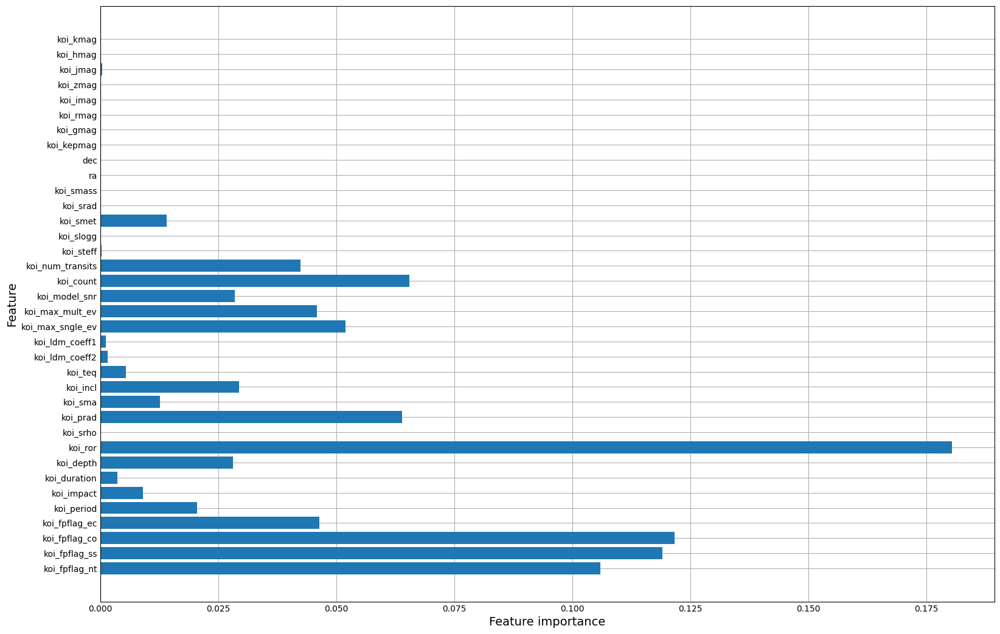

In [300]:
plot_feature_importances_exoplanet_c4(model_C4_4)

# EXTRAS/TESTES

In [361]:
df1 = pd.DataFrame(model_C1_4.feature_importances_,X_train_1.columns)
df2 = pd.DataFrame(model_C2_4.feature_importances_,X_train_2.columns)
df3 = pd.DataFrame(model_C3_4.feature_importances_,X_train_3.columns)
df4 = pd.DataFrame(model_C4_4.feature_importances_,X_train_4.columns)

In [362]:
df_features = pd.concat([df1, df2, df3, df4], axis=1)

In [363]:
df_features.fillna(0, inplace=True)

In [364]:
df_features.columns = ['model_C1_4','model_C2_4','model_C3_4','model_C4_4']

In [365]:
df_features

,model_C1_4,model_C2_4,model_C3_4,model_C4_4
koi_fpflag_nt,0.104346,0.058500,0.125273,0.105908
koi_fpflag_ss,0.148587,0.080915,0.135519,0.119135
koi_fpflag_co,0.184049,0.172910,0.167548,0.121720
koi_fpflag_ec,0.054722,0.065202,0.049659,0.046397
koi_period,0.029004,0.007594,0.017679,0.020504
koi_duration,0.002466,0.001687,0.000000,0.003703
koi_depth,0.056457,0.035824,0.018557,0.028128
koi_incl,0.040978,0.031551,0.028691,0.029462
koi_teq,0.003119,0.005135,0.010018,0.005446
koi_ldm_coeff2,0.000174,0.001085,0.000835,0.001632


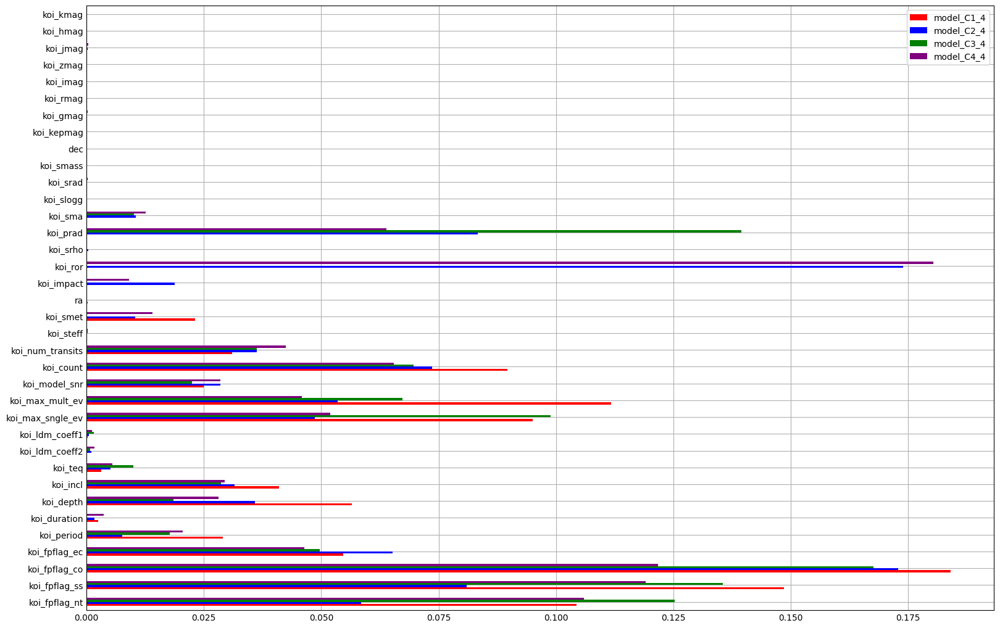

In [366]:
ax = df_features.plot.barh(figsize=(15,10),color={'model_C1_4':'red','model_C2_4':'blue','model_C3_4':'green','model_C4_4':'purple'})

In [322]:
def plot_feature_importances_exoplanet(model1,model2,model3,model4):
  
    #criação subplot
    fig, ax = plt.subplots(figsize=(15,10))
        
    n_features_1 = X_train_1.shape[1]
    n_features_2 = X_train_2.shape[1]
    #n_features_3 = X_train_3.shape[1]
    #n_features_4 = X_train_4.shape[1]
    
    ax.barh(range(n_features_1), model1.feature_importances_, align='center',color='blue',label='teste1')
    ax.barh(range(n_features_2), model2.feature_importances_, align='center',color='red',label='teste2')
    #plt.barh(range(n_features_3), model3.feature_importances_, align='center',color='green',label='teste3')
    #plt.barh(range(n_features_4), model4.feature_importances_, align='center',color='purple',label='teste4')
    plt.yticks(np.arange(n_features_1), X_train_1.columns)
    plt.yticks(np.arange(n_features_2), X_train_2.columns)
    #plt.yticks(np.arange(n_features_3), X_train_3.columns)
    #plt.yticks(np.arange(n_features_4), X_train_4.columns)
    
    plt.legend()
    plt.xlabel("Feature importance",fontdict = {'fontsize' : 14})
    plt.ylabel("Feature",fontdict = {'fontsize' : 14})
    plt.show()

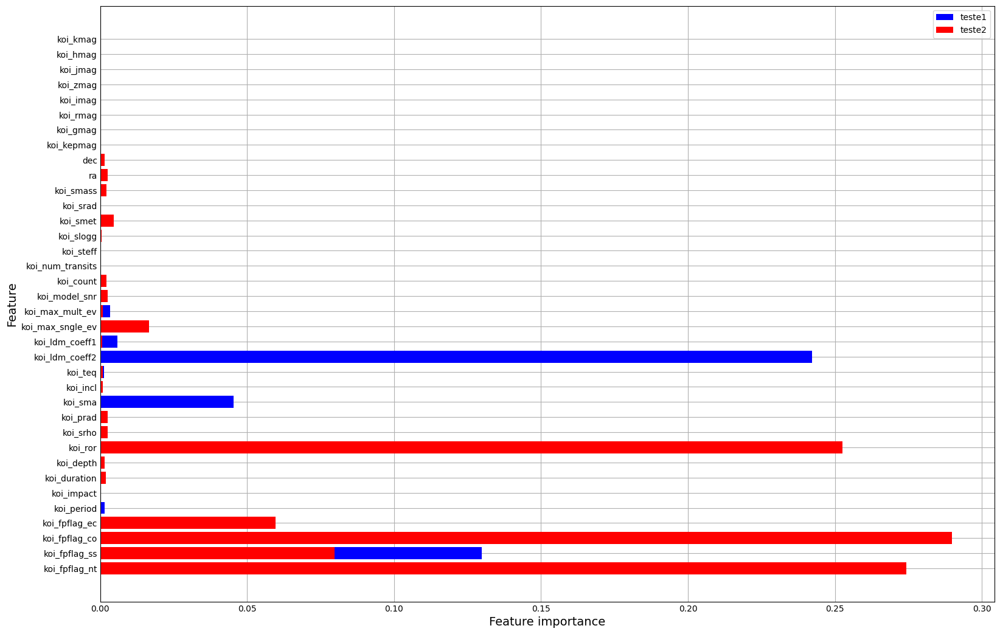

In [323]:
plot_feature_importances_exoplanet(model_C1_1,model_C2_1,model_C3_1,model_C4_1)